# previous work:

In [2]:
teachers = pd.read_csv('../data/teachers.csv')
students = pd.read_csv('../data/students.csv')
sessions = pd.read_csv('../data/sessions.csv')
schools = pd.read_csv('../data/schools.csv')
posts = pd.read_csv('../data/posts.csv')
planning_events = pd.read_csv('../data/planning_events.csv')
child_posts = pd.read_csv('../data/child_posts.csv')
classrooms = pd.read_csv('../data/classrooms.csv')
classrooms.rename(columns={'id':'classroom_id'})
lesson_posts = pd.read_csv('../data/lesson_posts.csv')
parents = pd.read_csv('../data/parents.csv')
sessions['start_date'] = pd.to_datetime(sessions['start_date'])
sessions['stop_date'] = pd.to_datetime(sessions['stop_date'])
sessions['exists']=1
posts['exists']=1
posts=posts.rename(columns={'id':'post_id'})
classrooms=classrooms.rename(columns={'id':'classroom_id'})
# posts['date'] = pd.to_datetime(posts.date, errors='coerce')
posts['date'] = pd.to_datetime(posts.date, errors='coerce')
classrooms_merged = pd.read_csv('../data/classrooms_merged.csv')

## Sessions analysis

In [2]:
sessions.head()

,id,current,start_date,stop_date,name,school_id,inactive,exists
0,1,f,2012-01-03,2012-06-20,2011-12,2,f,1
1,2,f,2012-06-25,2012-08-17,Summer 2012,2,f,1
2,6,f,2013-09-01,2014-07-01,2013-14,3,f,1
3,3,f,2012-09-04,2013-06-19,2012-13,2,f,1
4,4,f,2012-09-01,2013-06-30,2012-13,3,f,1


In [3]:
# churners:
sum(sessions.groupby('school_id')['stop_date'].max()<pd.to_datetime('april 28, 2018'))

14

In [ ]:
sum(sessions['stop_date']<pd.to_datetime('april 28, 2018'))

1973

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(20,40))
point_pairs = [((sessions.start_date[i],sessions.stop_date[i]),(sessions.school_id[i],sessions.school_id[i])) for i in range(len(sessions))]
# point_pairs = [((sessions.start_date[i],sessions.stop_date[i]),(sessions.school_id[i],sessions.school_id[i])) for i in range(100)]
for x in point_pairs:
    ax.plot(x[0], x[1], alpha=.5)
ax.set_xlabel('start/stop date')
ax.set_ylabel('school_id')
ax.set_title('school_id start/stop dates')

Text(0.5,1,'school_id start/stop dates')

In [ ]:
sessions.start_date[0]

In [ ]:
sessions.groupby('start_date').sum().head(5)
sum_sessions_date_indexed = sessions.groupby('start_date').sum()
sum_sessions_date_indexed['exists'] = np.log(sum_sessions_date_indexed['exists'])
sum_sessions_date_indexed[sum_sessions_date_indexed['school_id']==465]['exists']
sum_sessions = sum_sessions_date_indexed.reset_index()
sum_sessions.head()

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(20,3))
ax.plot(sum_sessions[sum_sessions['school_id']==24]['start_date'], sum_sessions[sum_sessions['school_id']==24]['exists'])
sessions.describe()
print('max stop = ' + str(sessions.stop_date.max()))
print('max start = ' + str(sessions.start_date.max()))
print('min stop = ' + str(sessions.stop_date.min()))
print('min start = ' + str(sessions.start_date.min()))

In [ ]:
sessions.head(3)

In [ ]:
sessions_grouped = sessions[['start_date','school_id','exists']].groupby(['start_date','school_id']).sum().reset_index().head()
# sessions_grouped.set_index('start_date', inplace=True)
sessions_grouped.groupby('school_id')['exists'].plot(legend=True)

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(20,20))
ax.plot(sessions[['exists','start_date']].groupby('start_date').sum());

## Posts analysis

In [ ]:
posts.head(3)

In [ ]:
posts.describe()

In [ ]:
sorted_post_date = posts.date.sort_values()

In [ ]:
# # posts.date.dtypes
# # posts.date.apply(lambda x: not isinstance(x, pd.Timestamp))
# sorted_post_date.iloc[-170:]
# # posts.date.dtypes
# posts['date'] = pd.to_datetime(posts.date, errors='coerce')
# # len(posts.date)
# # posts.date>'2018-12-12'

In [ ]:
print(posts.date.max())
print(posts.date.min())

In [ ]:
# posts['exists']=1
# posts.head(3)

In [ ]:
posts[['date','classroom_id','exists']].groupby(['classroom_id', 'date']).sum().plot();

In [ ]:
posts[['date','classroom_id','exists']].groupby(['classroom_id', 'date']).sum()

In [ ]:
sum_post = posts[['date','classroom_id','exists']].groupby(['classroom_id', 'date']).sum()
sum_post['exists'] = np.log(sum_post['exists'])
sum_post = sum_post.reset_index()
sum_post_date_indexed = sum_post.copy()
sum_post_date_indexed.set_index('date',inplace=True)
# plt.plot(sum_post[sum_post['classroom_id']==1])
# plt.scatter(sum_post[sum_post['classroom_id']==1][date], sum_post[sum_post['classroom_id']==1]['exists'])

In [ ]:
sum_post[sum_post['classroom_id']==3]

In [ ]:
sum_post['classroom_id'].value_counts()[60:61]
sum_post.head()

In [ ]:
# plt.plot(sum_post[sum_post['classroom_id']==1]);
np.exp(5)

In [ ]:
fig, ax = plt.subplots(2,1, figsize=(20,3))
ax[0].scatter(sum_post[sum_post['classroom_id']==77]['date'].values,sum_post[sum_post['classroom_id']==77]['exists'])
ax[1].plot(sum_post[sum_post['classroom_id']==77]['date'],sum_post[sum_post['classroom_id']==77]['exists']);
ax[0].set_title("Class 77 log(posts)")

In [ ]:
fig, ax = plt.subplots(2,1, figsize=(20,3))
ax[0].scatter(sum_post[sum_post['classroom_id']==852]['date'].values,sum_post[sum_post['classroom_id']==852]['exists'])
ax[1].plot(sum_post[sum_post['classroom_id']==852]['date'],sum_post[sum_post['classroom_id']==852]['exists']);
ax[0].set_title("Class 852 log(posts)")

In [ ]:
for classroom_id in sum_post['classroom_id'].unique()[0:30]:
    fig, ax = plt.subplots(2,1, figsize=(20,3))
    ax[0].scatter(sum_post[sum_post['classroom_id']==classroom_id]['date'].values,sum_post[sum_post['classroom_id']==classroom_id]['exists'], s=6)
    ax[1].plot(sum_post[sum_post['classroom_id']==classroom_id]['date'],sum_post[sum_post['classroom_id']==classroom_id]['exists']);
    ax[0].set_title(f"Class {classroom_id} log(posts)")
    plt.show()

## Peek at all data:

In [ ]:
posts.head(3)

In [ ]:
planning_events.head(10)

In [30]:
classrooms.head(10)

,id,school_id,lesson_set_id,inactive,classroom_type
0,2650,855,1281,f,Primary
1,174,48,126,t,Primary
2,2645,862,1276,f,Lower Elementary
3,3183,968,1563,f,Infant
4,3680,224,306,f,Primary
5,256,80,162,f,Lower Elementary
6,3190,969,1566,f,Primary
7,2599,220,1253,f,Lower Elementary
8,3184,968,1563,f,Infant
9,3675,1099,1847,f,Infant


In [ ]:
len(classrooms.lesson_set_id.unique())

In [ ]:
classrooms.lesson_set_id.value_counts().head(5)

In [ ]:
len(classrooms)

In [ ]:
len(classrooms.id.unique())

In [ ]:
teachers.head(3)

In [ ]:
len(teachers.id.unique())

In [ ]:
sum(teachers.default_classroom_id.isna())

In [ ]:
sum(teachers.teacher=='f')

In [ ]:
len(teachers.default_classroom_id.unique())

In [ ]:
students.head()

In [ ]:
schools.head(5)

In [ ]:
lesson_posts.head(3)

In [ ]:
plt.hist(lesson_posts.groupby('lesson_id').count()['post_id'], bins=30);

In [ ]:
lesson_posts.groupby('lesson_id').count()['post_id'].describe()

In [ ]:
plt.hist(lesson_posts.groupby('post_id').count()['lesson_id'], bins=30);

In [ ]:
child_posts.head(3)

In [35]:
print(len(posts))
posts.head()

4584013


,id,date,classroom_id,picture_file_name,private,exists
0,4319418,2018-01-25,1684,NaN,f,1
1,4319419,2018-01-25,1684,NaN,f,1
2,4319420,2018-01-25,1684,NaN,f,1
3,4319421,2018-01-25,1684,NaN,f,1
4,4319422,2018-01-25,1684,NaN,f,1


In [89]:
classrooms_merged = classrooms.merge(posts,how='outer', left_on='classroom_id', right_on='classroom_id')

In [90]:
classrooms_merged

,classroom_id,school_id,lesson_set_id,inactive,classroom_type,post_id,date,picture_file_name,private,exists
0,2650,855,1281,f,Primary,NaN,NaT,NaN,NaN,NaN
1,174,48,126,t,Primary,89168.0,2015-09-16,NaN,f,1.0
2,174,48,126,t,Primary,118933.0,2015-10-08,NaN,f,1.0
3,174,48,126,t,Primary,313583.0,2016-03-25,NaN,f,1.0
4,174,48,126,t,Primary,194688.0,2015-12-02,NaN,f,1.0
5,174,48,126,t,Primary,115274.0,2015-10-05,NaN,f,1.0
6,174,48,126,t,Primary,194683.0,2015-12-02,NaN,f,1.0
7,174,48,126,t,Primary,194684.0,2015-12-02,NaN,f,1.0
8,174,48,126,t,Primary,194685.0,2015-12-02,NaN,f,1.0
9,174,48,126,t,Primary,194686.0,2015-12-02,NaN,f,1.0


In [91]:
print(len(classrooms_merged))
print(len(classrooms_merged.classroom_id.unique()))

4585066
3643


In [92]:
children_per_post = child_posts.groupby('post_id').count()
children_per_post.describe()
children_per_post = children_per_post.reset_index()
children_per_post['children_per_post_aka_post_blast'] = children_per_post['child_id']
children_per_post = children_per_post.drop('child_id', axis=1)
children_per_post.head(3)

,post_id,children_per_post_aka_post_blast
0,6,2
1,7,1
2,10,1


In [93]:
classrooms_merged = classrooms_merged.merge(children_per_post, how='left', left_on='post_id', right_on='post_id')
print(len(classrooms_merged))
classrooms_merged.head(3)

4585066


,classroom_id,school_id,lesson_set_id,inactive,classroom_type,post_id,date,picture_file_name,private,exists,children_per_post_aka_post_blast
0,2650,855,1281,f,Primary,NaN,NaT,NaN,NaN,NaN,NaN
1,174,48,126,t,Primary,89168,2015-09-16,NaN,f,1.0,NaN
2,174,48,126,t,Primary,118933,2015-10-08,NaN,f,1.0,2.0


In [94]:
print(len(classrooms_merged.classroom_id.unique()))

3643


In [95]:
# not adding
posts_per_child = child_posts.groupby('child_id').count()
posts_per_child.describe()
posts_per_child.head(3)

,post_id
child_id,
1,172
2,132
4,899


In [96]:
posts_per_lesson = lesson_posts.groupby('lesson_id').count()
posts_per_lesson
print(len(posts_per_lesson))
posts_per_lesson = posts_per_lesson.reset_index()
posts_per_lesson['post_per_lesson_aka_popularity'] = posts_per_lesson['post_id']
posts_per_lesson = posts_per_lesson.drop('post_id', axis=1)
posts_per_lesson.head(3)


376224


,lesson_id,post_per_lesson_aka_popularity
0,1,172
1,2,132
2,4,899


In [97]:
classrooms_merged = classrooms_merged.merge(posts_per_lesson, how='left', left_on='lesson_set_id', right_on='lesson_id')
print(len(classrooms_merged))
classrooms_merged.head(3)

4585066


,classroom_id,school_id,lesson_set_id,inactive,classroom_type,post_id,date,picture_file_name,private,exists,children_per_post_aka_post_blast,lesson_id,post_per_lesson_aka_popularity
0,2650,855,1281,f,Primary,NaN,NaT,NaN,NaN,NaN,NaN,1281.0,18.0
1,174,48,126,t,Primary,89168,2015-09-16,NaN,f,1.0,NaN,126.0,78.0
2,174,48,126,t,Primary,118933,2015-10-08,NaN,f,1.0,2.0,126.0,78.0


In [98]:
print(len(classrooms_merged.classroom_id.unique()))

3643


In [99]:
len(teachers.default_classroom_id.unique())
len(teachers)

6622

In [100]:
len(teachers.school_id.unique())

729

In [103]:
classrooms_merged.head()

,classroom_id,school_id,lesson_set_id,inactive,classroom_type,post_id,date,picture_file_name,private,exists,children_per_post_aka_post_blast,lesson_id,post_per_lesson_aka_popularity
0,2650,855,1281,f,Primary,NaN,NaT,NaN,NaN,NaN,NaN,1281.0,18.0
1,174,48,126,t,Primary,89168,2015-09-16,NaN,f,1.0,NaN,126.0,78.0
2,174,48,126,t,Primary,118933,2015-10-08,NaN,f,1.0,2.0,126.0,78.0
3,174,48,126,t,Primary,313583,2016-03-25,NaN,f,1.0,4.0,126.0,78.0
4,174,48,126,t,Primary,194688,2015-12-02,NaN,f,1.0,2.0,126.0,78.0


376224


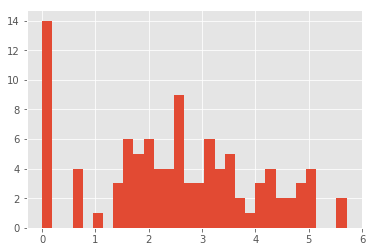

In [101]:
len(lesson_posts.lesson_id.unique())
len(lesson_posts.post_id.unique())
posts_per_lesson = lesson_posts.groupby('lesson_id').count()
print(len(posts_per_lesson))
plt.hist(np.log(posts_per_lesson.sample(100).values), bins=30);
posts_per_lesson.head(3)
posts_per_lesson.rename(index=str, columns={"post_id": "posts_per_lesson"});

In [104]:
classrooms_merged = classrooms_merged.merge(posts_per_lesson, how='left', left_on='lesson_set_id', right_index=True)
classrooms_merged.head(3)

,classroom_id,school_id,lesson_set_id,inactive,classroom_type,post_id_x,date,picture_file_name,private,exists,children_per_post_aka_post_blast,lesson_id,post_per_lesson_aka_popularity,post_id_y
0,2650,855,1281,f,Primary,NaN,NaT,NaN,NaN,NaN,NaN,1281.0,18.0,18.0
1,174,48,126,t,Primary,89168,2015-09-16,NaN,f,1.0,NaN,126.0,78.0,78.0
2,174,48,126,t,Primary,118933,2015-10-08,NaN,f,1.0,2.0,126.0,78.0,78.0


In [105]:
print(len(classrooms_merged.classroom_id.unique()))

3643


In [106]:
# next time try merging first, then filter by time, then groupby and count
# We're going to have to merge by time soon.

In [107]:
# classrooms_merged = classrooms_merged.merge(teachers, how='left', left_on='classroom_id', right_on='default_classroom_id')

In [108]:
teachers['teach_and_admin'] = (teachers['teacher']=='t') & (teachers['admin']=='t' )
teachers['is_teacher'] = teachers['teacher']=='t'
teachers['is_admin'] = teachers['admin']=='t'

In [109]:
teachers_per_class = teachers.groupby('default_classroom_id').sum()
teachers_per_class.head(3)

,id,school_id,teach_and_admin,is_teacher,is_admin
default_classroom_id,,,,,
1.0,252293,34,3.0,17.0,3.0
3.0,68,3,0.0,1.0,0.0
4.0,36555,9,0.0,2.0,1.0


In [110]:
# THIS IS ALMOST DEFINITELY DATA LEAKAGE:
classrooms_merged = classrooms_merged.merge(teachers, how='left', left_on='classroom_id', right_index=True)

In [111]:
print(len(classrooms_merged.classroom_id.unique()))

3643


In [112]:
students.head()

,child_id,classroom_id,current
0,997,72,f
1,13,1,f
2,2221,55,f
3,32489,1466,t
4,8388,60,f


In [113]:
len(students.child_id.unique())

59676

In [114]:
len(students.classroom_id.unique())

3066

In [115]:
current_students_per_class = students[students['current']=='t'].groupby('classroom_id').count()
current_students_per_class.drop('current', axis=1)
current_students_per_class.rename({'child_id': 'num_current_children'});

In [116]:
old_students_per_class = students[students['current']=='f'].groupby('classroom_id').count()
old_students_per_class.drop('current', axis=1)
old_students_per_class.rename({'child_id': 'num_old_children'});

In [117]:
classrooms_merged = classrooms_merged.merge(current_students_per_class, how='left', left_on='classroom_id', right_index=True)
classrooms_merged = classrooms_merged.merge(old_students_per_class, how='left', left_on='classroom_id', right_index=True)

In [118]:
classrooms_merged.head(3)

,classroom_id,school_id_x,lesson_set_id,inactive,classroom_type,post_id_x,date,picture_file_name,private,exists,...,default_classroom_id,teacher,admin,teach_and_admin,is_teacher,is_admin,child_id_x,current_x,child_id_y,current_y
0,2650,855,1281,f,Primary,NaN,NaT,NaN,NaN,NaN,...,3636.0,t,f,False,True,False,NaN,NaN,NaN,NaN
1,174,48,126,t,Primary,89168,2015-09-16,NaN,f,1.0,...,607.0,t,f,False,True,False,NaN,NaN,28.0,28.0
2,174,48,126,t,Primary,118933,2015-10-08,NaN,f,1.0,...,607.0,t,f,False,True,False,NaN,NaN,28.0,28.0


In [20]:
len(teachers.id.unique())* 365

2417030

In [119]:
print(len(classrooms_merged.classroom_id.unique()))

3643


In [120]:
classrooms_merged.to_csv('../data/classrooms_merged.csv')

## Combine NON LEAKY data into one dataframe for analysis:

In [14]:
posts_before = posts[posts['date']<now]
classrooms_merged = classrooms.merge(posts,how='outer', left_on='classroom_id', right_on='classroom_id')
children_per_post = child_posts.groupby('post_id').count()
children_per_post = children_per_post.reset_index()
children_per_post['children_per_post_aka_post_blast'] = children_per_post['child_id']
children_per_post = children_per_post.drop('child_id', axis=1)

KeyboardInterrupt: 

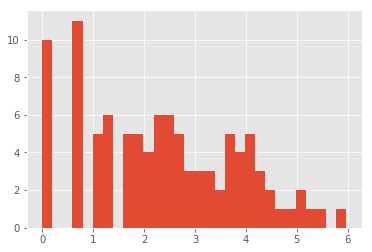

In [15]:
classrooms_merged = classrooms_merged.merge(children_per_post, how='left', left_on='post_id', right_on='post_id')
posts_per_child = child_posts.groupby('child_id').count()
posts_per_lesson = lesson_posts.groupby('lesson_id').count()
posts_per_lesson = posts_per_lesson.reset_index()
posts_per_lesson['post_per_lesson_aka_popularity'] = posts_per_lesson['post_id']
posts_per_lesson = posts_per_lesson.drop('post_id', axis=1)
classrooms_merged = classrooms_merged.merge(posts_per_lesson, how='left', left_on='lesson_set_id', right_on='lesson_id')
posts_per_lesson = lesson_posts.groupby('lesson_id').count()
plt.hist(np.log(posts_per_lesson.sample(100).values), bins=30);
posts_per_lesson.rename(index=str, columns={"post_id": "posts_per_lesson"});
classrooms_merged = classrooms_merged.merge(posts_per_lesson, how='left', left_on='lesson_set_id', right_index=True)

# next time try merging first, then filter by time, then groupby and count
# We're going to have to merge by time soon.

# # THIS IS ALMOST DEFINITELY DATA LEAKAGE:

# classrooms_merged = classrooms_merged.merge(teachers, how='left', left_on='classroom_id', right_on='default_classroom_id')

# teachers['teach_and_admin'] = (teachers['teacher']=='t') & (teachers['admin']=='t' )
# teachers['is_teacher'] = teachers['teacher']=='t'
# teachers['is_admin'] = teachers['admin']=='t'

# teachers_per_class = teachers.groupby('default_classroom_id').sum()
# teachers_per_class.head(3)

# classrooms_merged = classrooms_merged.merge(teachers, how='left', left_on='classroom_id', right_index=True)

# current_students_per_class = students[students['current']=='t'].groupby('classroom_id').count()
# current_students_per_class.drop('current', axis=1)
# current_students_per_class.rename({'child_id': 'num_current_children'});

# old_students_per_class = students[students['current']=='f'].groupby('classroom_id').count()
# old_students_per_class.drop('current', axis=1)
# old_students_per_class.rename({'child_id': 'num_old_children'});

# classrooms_merged = classrooms_merged.merge(current_students_per_class, how='left', left_on='classroom_id', right_index=True)
# classrooms_merged = classrooms_merged.merge(old_students_per_class, how='left', left_on='classroom_id', right_index=True)

classrooms_merged.to_csv('../data/classrooms_merged_non_leak.csv')

## Combine data into one dataframe for analysis:

In [2]:
posts = pd.read_csv('../data/posts.csv')
posts['exists']=1
posts['date'] = pd.to_datetime(posts.date, errors='coerce')

In [35]:
print(len(posts))
posts.head()

4584013


,id,date,classroom_id,picture_file_name,private,exists
0,4319418,2018-01-25,1684,NaN,f,1
1,4319419,2018-01-25,1684,NaN,f,1
2,4319420,2018-01-25,1684,NaN,f,1
3,4319421,2018-01-25,1684,NaN,f,1
4,4319422,2018-01-25,1684,NaN,f,1


In [89]:
classrooms_merged = classrooms.merge(posts,how='outer', left_on='classroom_id', right_on='classroom_id')

In [71]:
classrooms_merged.head()

,classroom_id,school_id,lesson_set_id,inactive,classroom_type,id,date,picture_file_name,private,exists
0,2650,855,1281,f,Primary,NaN,NaT,NaN,NaN,NaN
1,174,48,126,t,Primary,89168.0,2015-09-16,NaN,f,1.0
2,174,48,126,t,Primary,118933.0,2015-10-08,NaN,f,1.0
3,174,48,126,t,Primary,313583.0,2016-03-25,NaN,f,1.0
4,174,48,126,t,Primary,194688.0,2015-12-02,NaN,f,1.0


In [91]:
print(len(classrooms_merged))
print(len(classrooms_merged.classroom_id.unique()))

4585066
3643


In [92]:
children_per_post = child_posts.groupby('post_id').count()
children_per_post.describe()
children_per_post = children_per_post.reset_index()
children_per_post['children_per_post_aka_post_blast'] = children_per_post['child_id']
children_per_post = children_per_post.drop('child_id', axis=1)
children_per_post.head(3)

,post_id,children_per_post_aka_post_blast
0,6,2
1,7,1
2,10,1


In [93]:
classrooms_merged = classrooms_merged.merge(children_per_post, how='left', left_on='post_id', right_on='post_id')
print(len(classrooms_merged))
classrooms_merged.head(3)

4585066


,classroom_id,school_id,lesson_set_id,inactive,classroom_type,post_id,date,picture_file_name,private,exists,children_per_post_aka_post_blast
0,2650,855,1281,f,Primary,NaN,NaT,NaN,NaN,NaN,NaN
1,174,48,126,t,Primary,89168,2015-09-16,NaN,f,1.0,NaN
2,174,48,126,t,Primary,118933,2015-10-08,NaN,f,1.0,2.0


In [94]:
print(len(classrooms_merged.classroom_id.unique()))

3643


In [95]:
# not adding
posts_per_child = child_posts.groupby('child_id').count()
posts_per_child.describe()
posts_per_child.head(3)

,post_id
child_id,
1,172
2,132
4,899


In [96]:
posts_per_lesson = lesson_posts.groupby('lesson_id').count()
posts_per_lesson
print(len(posts_per_lesson))
posts_per_lesson = posts_per_lesson.reset_index()
posts_per_lesson['post_per_lesson_aka_popularity'] = posts_per_lesson['post_id']
posts_per_lesson = posts_per_lesson.drop('post_id', axis=1)
posts_per_lesson.head(3)


376224


,lesson_id,post_per_lesson_aka_popularity
0,1,172
1,2,132
2,4,899


In [97]:
classrooms_merged = classrooms_merged.merge(posts_per_lesson, how='left', left_on='lesson_set_id', right_on='lesson_id')
print(len(classrooms_merged))
classrooms_merged.head(3)

4585066


,classroom_id,school_id,lesson_set_id,inactive,classroom_type,post_id,date,picture_file_name,private,exists,children_per_post_aka_post_blast,lesson_id,post_per_lesson_aka_popularity
0,2650,855,1281,f,Primary,NaN,NaT,NaN,NaN,NaN,NaN,1281.0,18.0
1,174,48,126,t,Primary,89168,2015-09-16,NaN,f,1.0,NaN,126.0,78.0
2,174,48,126,t,Primary,118933,2015-10-08,NaN,f,1.0,2.0,126.0,78.0


In [98]:
print(len(classrooms_merged.classroom_id.unique()))

3643


In [99]:
len(teachers.default_classroom_id.unique())
len(teachers)

6622

In [100]:
len(teachers.school_id.unique())

729

In [103]:
classrooms_merged.head()

,classroom_id,school_id,lesson_set_id,inactive,classroom_type,post_id,date,picture_file_name,private,exists,children_per_post_aka_post_blast,lesson_id,post_per_lesson_aka_popularity
0,2650,855,1281,f,Primary,NaN,NaT,NaN,NaN,NaN,NaN,1281.0,18.0
1,174,48,126,t,Primary,89168,2015-09-16,NaN,f,1.0,NaN,126.0,78.0
2,174,48,126,t,Primary,118933,2015-10-08,NaN,f,1.0,2.0,126.0,78.0
3,174,48,126,t,Primary,313583,2016-03-25,NaN,f,1.0,4.0,126.0,78.0
4,174,48,126,t,Primary,194688,2015-12-02,NaN,f,1.0,2.0,126.0,78.0


376224


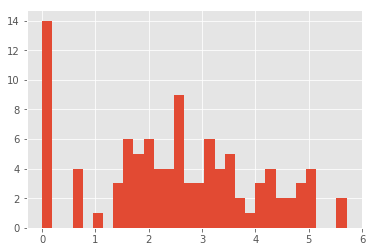

In [101]:
len(lesson_posts.lesson_id.unique())
len(lesson_posts.post_id.unique())
posts_per_lesson = lesson_posts.groupby('lesson_id').count()
print(len(posts_per_lesson))
plt.hist(np.log(posts_per_lesson.sample(100).values), bins=30);
posts_per_lesson.head(3)
posts_per_lesson.rename(index=str, columns={"post_id": "posts_per_lesson"});

In [104]:
classrooms_merged = classrooms_merged.merge(posts_per_lesson, how='left', left_on='lesson_set_id', right_index=True)
classrooms_merged.head(3)

,classroom_id,school_id,lesson_set_id,inactive,classroom_type,post_id_x,date,picture_file_name,private,exists,children_per_post_aka_post_blast,lesson_id,post_per_lesson_aka_popularity,post_id_y
0,2650,855,1281,f,Primary,NaN,NaT,NaN,NaN,NaN,NaN,1281.0,18.0,18.0
1,174,48,126,t,Primary,89168,2015-09-16,NaN,f,1.0,NaN,126.0,78.0,78.0
2,174,48,126,t,Primary,118933,2015-10-08,NaN,f,1.0,2.0,126.0,78.0,78.0


In [105]:
print(len(classrooms_merged.classroom_id.unique()))

3643


In [106]:
# next time try merging first, then filter by time, then groupby and count
# We're going to have to merge by time soon.

In [107]:
# classrooms_merged = classrooms_merged.merge(teachers, how='left', left_on='classroom_id', right_on='default_classroom_id')

In [108]:
teachers['teach_and_admin'] = (teachers['teacher']=='t') & (teachers['admin']=='t' )
teachers['is_teacher'] = teachers['teacher']=='t'
teachers['is_admin'] = teachers['admin']=='t'

In [109]:
teachers_per_class = teachers.groupby('default_classroom_id').sum()
teachers_per_class.head(3)

,id,school_id,teach_and_admin,is_teacher,is_admin
default_classroom_id,,,,,
1.0,252293,34,3.0,17.0,3.0
3.0,68,3,0.0,1.0,0.0
4.0,36555,9,0.0,2.0,1.0


In [110]:
# THIS IS ALMOST DEFINITELY DATA LEAKAGE:
classrooms_merged = classrooms_merged.merge(teachers, how='left', left_on='classroom_id', right_index=True)

In [111]:
print(len(classrooms_merged.classroom_id.unique()))

3643


In [112]:
students.head()

,child_id,classroom_id,current
0,997,72,f
1,13,1,f
2,2221,55,f
3,32489,1466,t
4,8388,60,f


In [113]:
len(students.child_id.unique())

59676

In [114]:
len(students.classroom_id.unique())

3066

In [115]:
current_students_per_class = students[students['current']=='t'].groupby('classroom_id').count()
current_students_per_class.drop('current', axis=1)
current_students_per_class.rename({'child_id': 'num_current_children'});

In [116]:
old_students_per_class = students[students['current']=='f'].groupby('classroom_id').count()
old_students_per_class.drop('current', axis=1)
old_students_per_class.rename({'child_id': 'num_old_children'});

In [117]:
classrooms_merged = classrooms_merged.merge(current_students_per_class, how='left', left_on='classroom_id', right_index=True)
classrooms_merged = classrooms_merged.merge(old_students_per_class, how='left', left_on='classroom_id', right_index=True)

In [118]:
classrooms_merged.head(3)

,classroom_id,school_id_x,lesson_set_id,inactive,classroom_type,post_id_x,date,picture_file_name,private,exists,...,default_classroom_id,teacher,admin,teach_and_admin,is_teacher,is_admin,child_id_x,current_x,child_id_y,current_y
0,2650,855,1281,f,Primary,NaN,NaT,NaN,NaN,NaN,...,3636.0,t,f,False,True,False,NaN,NaN,NaN,NaN
1,174,48,126,t,Primary,89168,2015-09-16,NaN,f,1.0,...,607.0,t,f,False,True,False,NaN,NaN,28.0,28.0
2,174,48,126,t,Primary,118933,2015-10-08,NaN,f,1.0,...,607.0,t,f,False,True,False,NaN,NaN,28.0,28.0


In [20]:
len(teachers.id.unique())* 365

2417030

In [119]:
print(len(classrooms_merged.classroom_id.unique()))

3643


In [120]:
classrooms_merged.to_csv('../data/classrooms_merged.csv')

### NOT MERGED:

In [ ]:
posts_merge = posts_merge.merge(planning_events, how='left', left_on)
posts_merge.head(3)

In [ ]:
planning_events.child_id.value_counts().head(5)

In [ ]:
planning_events.head(5)

In [ ]:
#TODO: merge planning events totals according to time. 

## Combine planning_events into one dataframe for analysis:

In [ ]:
planning_events.created_at = pd.to_datetime(planning_events.created_at)

In [ ]:
planning_events['created_at'].apply(lambda x: isinstance(x, pd.Timestamp))

In [ ]:
len(planning_events.created_by_id.unique())

## Make hist of posts in last 30 days

In [ ]:
posts.head(3)

In [ ]:
plt.hist(np.log(num_posts_by_class['exists']), bins=100);

In [ ]:
plt.hist(num_posts_by_class)

### Num posts in the last X days

In [ ]:
def posts_since(posts,date):
    last_month_posts = posts[posts['date']>date].groupby('classroom_id').count()
    num_posts_by_class = posts.groupby('classroom_id').sum()
    last_month_posts_total= num_posts_by_class.join(last_month_posts, how='left', lsuffix='_num_posts_by_class', rsuffix='_last_month_posts')
    last_month_posts_total.loc[last_month_posts_total['id_last_month_posts'].isnull(),'exists_last_month_posts'] =0
    fig, ax = plt.subplots(1,1)
    ax.set_title(f'class posts since {date.date()}')
    ax.hist(last_month_posts_total['exists_last_month_posts'],bins=40)
    ax.set_ylabel("# of classes")
    ax.set_xlabel("# of posts")
    plt.show()
    
def log_posts_since(posts,date):
    last_month_posts = posts[posts['date']>date].groupby('classroom_id').count()
    num_posts_by_class = posts.groupby('classroom_id').sum()
    last_month_posts_total= num_posts_by_class.join(last_month_posts, how='left', lsuffix='_num_posts_by_class', rsuffix='_last_month_posts')
    last_month_posts_total.loc[last_month_posts_total['id_last_month_posts'].isnull(),'exists_last_month_posts'] =0
    fig, ax = plt.subplots(1,1)
    ax.set_title(f'class log(posts) since {date.date()}')
    ax.hist(np.log(last_month_posts_total['exists_last_month_posts']+1),bins=40)
    ax.set_ylabel("# of classes")
    ax.set_xlabel("log(#) of posts")
    plt.show()
posts_since(posts, pd.to_datetime("Feb 15 2018"))

In [ ]:
posts_since(posts, pd.to_datetime("Feb 15 2011"))
posts_since(posts, pd.to_datetime("Jan 15 2018"))
log_posts_since(posts, pd.to_datetime("jan 15 2018"))
log_posts_since(posts, pd.to_datetime("feb 15 2018"))

In [ ]:
def plot_posts_between(posts, date1, date2):
    print(sum((date1 < posts['date']) & (posts['date'] < date2)))
    last_month_posts = posts[(date1 < posts['date']) & (posts['date'] < date2)].groupby('classroom_id').count()
    num_posts_by_class = posts.groupby('classroom_id').sum()
    last_month_posts_total= num_posts_by_class.join(last_month_posts, how='left', lsuffix='_num_posts_by_class', rsuffix='_last_month_posts')
    last_month_posts_total.loc[last_month_posts_total['id_last_month_posts'].isnull(),'exists_last_month_posts'] =0
    fig, ax = plt.subplots(1,1)
    ax.set_title(f'class posts between {date1.date()} and {date2.date()}')
    ax.hist(last_month_posts_total['exists_last_month_posts'],bins=40)
    ax.set_ylabel("# of classes")
    ax.set_xlabel("# of posts")
    plt.show()
    
def plot_log_posts_between(posts, date1, date2):
    print(sum((date1 < posts['date']) & (posts['date'] < date2)))
    last_month_posts = posts[(date1 < posts['date']) & (posts['date'] < date2)].groupby('classroom_id').count()
    num_posts_by_class = posts.groupby('classroom_id').sum()
    last_month_posts_total= num_posts_by_class.join(last_month_posts, how='left', lsuffix='_num_posts_by_class', rsuffix='_last_month_posts')
    last_month_posts_total.loc[last_month_posts_total['id_last_month_posts'].isnull(),'exists_last_month_posts'] =0
    fig, ax = plt.subplots(1,1)
    ax.set_title(f'class log(posts) between {date1.date()} and {date2.date()}')
    ax.hist(np.log(last_month_posts_total['exists_last_month_posts']+1),bins=40)
    ax.set_ylabel("# of classes")
    ax.set_xlabel("log(#) of posts")
    plt.show()
plot_posts_between(posts, pd.to_datetime("Jan 15 2018"), pd.to_datetime("Feb 15 2018"))
plot_log_posts_between(posts, pd.to_datetime("Dec 15 2017"), pd.to_datetime("Jan 15 2018"))
plot_log_posts_between(posts, pd.to_datetime("Jan 15 2018"), pd.to_datetime("Feb 15 2018"))
plot_log_posts_between(posts, pd.to_datetime("FEB 15 2018"), pd.to_datetime("March 15 2018"))

In [ ]:
# testing a uniform distribution
import random
plt.hist(np.log([random.random()*500 for x in range(1015)]),bins=40);

In [ ]:
date1, date2 = pd.to_datetime("Dec 15 2010"), pd.to_datetime("Jan 15 2011")
sum((date1 < posts['date']) & (posts['date'] < date2))

### Num of days (in last month) with > 0 posts

In [ ]:
def plot_days_with_not_zero_posts_since(posts, date):
    days_one_post_in_last_month = posts[posts['date']> date].groupby(['classroom_id','date']).sum().groupby('classroom_id').count()
    num_posts_by_class = posts.groupby('classroom_id').count()
    days_one_post_in_last_month = num_posts_by_class.join(days_one_post_in_last_month, how='left', lsuffix='_num_posts_by_class', rsuffix='_days_one_post_in_last_month')
    days_one_post_in_last_month.loc[days_one_post_in_last_month['exists_days_one_post_in_last_month'].isnull(), 'exists_days_one_post_in_last_month'] = 0
    fig, ax = plt.subplots(1,1)
    ax.set_title(f'Days with not zero posts since {date.date()}')
    ax.hist(days_one_post_in_last_month['exists_days_one_post_in_last_month'],bins=30);
    ax.set_ylabel("# of classes")
    ax.set_xlabel("# of days")
    plt.show()
    
    
def plot_log_days_with_not_zero_posts_since(posts, date):
    days_one_post_in_last_month = posts[posts['date']> date].groupby(['classroom_id','date']).sum().groupby('classroom_id').count()
    num_posts_by_class = posts.groupby('classroom_id').count()
    days_one_post_in_last_month = num_posts_by_class.join(days_one_post_in_last_month, how='left', lsuffix='_num_posts_by_class', rsuffix='_days_one_post_in_last_month')
    days_one_post_in_last_month.loc[days_one_post_in_last_month['exists_days_one_post_in_last_month'].isnull(), 'exists_days_one_post_in_last_month'] = 0
    fig, ax = plt.subplots(1,1)
    ax.set_title(f'Days with not zero posts since {date.date()}')
    ax.hist(np.log(days_one_post_in_last_month['exists_days_one_post_in_last_month']+1),bins=30);
    ax.set_ylabel("# of classes")
    ax.set_xlabel("log(#) of days")
    plt.show()
    
plot_days_with_not_zero_posts_since(posts, pd.to_datetime("feb 15 2018"))
plot_log_days_with_not_zero_posts_since(posts, pd.to_datetime("feb 15 2018"))
plot_days_with_not_zero_posts_since(posts, pd.to_datetime("feb 15 2011"))
plot_log_days_with_not_zero_posts_since(posts, pd.to_datetime("feb 15 2011"))

In [ ]:
def plot_days_with_not_zero_posts_between(posts, date1, date2):
    print(sum((date1 < posts['date']) & (posts['date'] < date2)))
    days_one_post_in_last_month = posts[(date1 < posts['date']) & (posts['date'] < date2)].groupby(['classroom_id','date']).sum().groupby('classroom_id').count()
    num_posts_by_class = posts.groupby('classroom_id').count()
    days_one_post_in_last_month = num_posts_by_class.join(days_one_post_in_last_month, how='left', lsuffix='_num_posts_by_class', rsuffix='_days_one_post_in_last_month')
    days_one_post_in_last_month.loc[days_one_post_in_last_month['exists_days_one_post_in_last_month'].isnull(), 'exists_days_one_post_in_last_month'] = 0
    fig, ax = plt.subplots(1,1)
    ax.set_title(f'Days with not zero posts between {date1.date()} and {date2.date()}')
    ax.hist(days_one_post_in_last_month['exists_days_one_post_in_last_month'],bins=30);
    ax.set_ylabel("# of classes")
    ax.set_xlabel("# of days")
    plt.show()
    
    
def plot_log_days_with_not_zero_posts_between(posts, date1, date2):
    print(sum((date1 < posts['date']) & (posts['date'] < date2)))
    days_one_post_in_last_month = posts[(date1 < posts['date']) & (posts['date'] < date2)].groupby(['classroom_id','date']).sum().groupby('classroom_id').count()
    num_posts_by_class = posts.groupby('classroom_id').count()
    days_one_post_in_last_month = num_posts_by_class.join(days_one_post_in_last_month, how='left', lsuffix='_num_posts_by_class', rsuffix='_days_one_post_in_last_month')
    days_one_post_in_last_month.loc[days_one_post_in_last_month['exists_days_one_post_in_last_month'].isnull(), 'exists_days_one_post_in_last_month'] = 0
    fig, ax = plt.subplots(1,1)
    ax.set_title(f'Days with not zero posts between {date1.date()} and {date2.date()}')
    ax.hist(np.log(days_one_post_in_last_month['exists_days_one_post_in_last_month']+1),bins=30);
    ax.set_ylabel("# of classes")
    ax.set_xlabel("# of days")
    plt.show()
    
plot_days_with_not_zero_posts_between(posts, pd.to_datetime("Feb 15 2018"), pd.to_datetime("Feb 16 2018"))
plot_days_with_not_zero_posts_between(posts, pd.to_datetime("Jan 15 2018"), pd.to_datetime("Feb 15 2018"))
plot_log_days_with_not_zero_posts_between(posts, pd.to_datetime("Dec 15 2017"), pd.to_datetime("Jan 15 2018"))
plot_days_with_not_zero_posts_between(posts, pd.to_datetime("Jan 15 2018"), pd.to_datetime("Feb 15 2018"))
plot_log_days_with_not_zero_posts_between(posts, pd.to_datetime("FEB 15 2018"), pd.to_datetime("March 15 2018"))

## chart zero entry classes per month over time

In [ ]:
def posts_between(posts, date1, date2):
    print('total posts in this timeframe = ' + str(sum((date1 < posts['date']) & (posts['date'] < date2))))
    last_month_posts = posts[(date1 < posts['date']) & (posts['date'] < date2)].groupby('classroom_id').count()
    num_posts_by_class = posts.groupby('classroom_id').sum()
    last_month_posts_total= num_posts_by_class.join(last_month_posts, how='left', lsuffix='_num_posts_by_class', rsuffix='_last_month_posts')
    last_month_posts_total.loc[last_month_posts_total['id_last_month_posts'].isnull(),'exists_last_month_posts'] =0
    return last_month_posts_total
    
def log_posts_between(posts, date1, date2):
    print(sum((date1 < posts['date']) & (posts['date'] < date2)))
    last_month_posts = posts[(date1 < posts['date']) & (posts['date'] < date2)].groupby('classroom_id').count()
    num_posts_by_class = posts.groupby('classroom_id').sum()
    last_month_posts_total= num_posts_by_class.join(last_month_posts, how='left', lsuffix='_num_posts_by_class', rsuffix='_last_month_posts')
    last_month_posts_total.loc[last_month_posts_total['id_last_month_posts'].isnull(),'exists_last_month_posts'] =0
    last_month_posts_total['exists_last_month_posts'] = np.log(last_month_posts_total['exists_last_month_posts']+1)
    return last_month_posts_total
    
    
def plot_days_with_not_zero_posts_between(posts, date1, date2):
    print(sum((date1 < posts['date']) & (posts['date'] < date2)))
    days_one_post_in_last_month = posts[(date1 < posts['date']) & (posts['date'] < date2)].groupby(['classroom_id','date']).sum().groupby('classroom_id').count()
    num_posts_by_class = posts.groupby('classroom_id').count()
    days_one_post_in_last_month = num_posts_by_class.join(days_one_post_in_last_month, how='left', lsuffix='_num_posts_by_class', rsuffix='_days_one_post_in_last_month')
    days_one_post_in_last_month.loc[days_one_post_in_last_month['exists_days_one_post_in_last_month'].isnull(), 'exists_days_one_post_in_last_month'] = 0
    return days_one_post_in_last_month
    
def plot_log_days_with_not_zero_posts_between(posts, date1, date2):
    print(sum((date1 < posts['date']) & (posts['date'] < date2)))
    days_one_post_in_last_month = posts[(date1 < posts['date']) & (posts['date'] < date2)].groupby(['classroom_id','date']).sum().groupby('classroom_id').count()
    num_posts_by_class = posts.groupby('classroom_id').count()
    days_one_post_in_last_month = num_posts_by_class.join(days_one_post_in_last_month, how='left', lsuffix='_num_posts_by_class', rsuffix='_days_one_post_in_last_month')
    days_one_post_in_last_month.loc[days_one_post_in_last_month['exists_days_one_post_in_last_month'].isnull(), 'exists_days_one_post_in_last_month'] = 0
    days_one_post_in_last_month['exists_days_one_post_in_last_month'] = np.log(days_one_post_in_last_month['exists_days_one_post_in_last_month']+1)
    return days_one_post_in_last_month

In [ ]:
posts.groupby(pd.Grouper(freq="M"), as_index=False).count()

In [ ]:
# months = "jan, feb, mar, april, may, june, july, aug, sept, oct, nov, dec".split(',')
# for classroom_id in posts['classroom_id'].unique():
#     for year in range(2011,2018)
#         for i_month in range(months):
#             posts_between(posts, date1=pd.datetime(str(year) + months[i_month]), date2=)
#             plot_days_with_not_zero_posts_between(posts, date1, date2)

## Hearts

In [ ]:
sum(posts[posts['classroom_id']==4]['date']>pd.to_datetime('feb 15 2018'))

In [ ]:
sum(posts[posts['classroom_id']==4]['date']>pd.to_datetime('feb 15 2018'))

### in the last 90 days:
one <3 rewarded if:
1. the min of last three # posts/month is greater than 50
2. the min of last three # posts/month is greater than 200
3. the min of least month is greater than zero
4. the min of least WEEK is greater than zero (so one post every week) 
5. the least month is more than a fourth of the greatest month. (again, over the last three months)

In [ ]:
self.record_keeping_quantity_1 = month_min >= 50
self.record_keeping_quantity_2 = month_min >= 200
self.record_keeping_frequency_1 = month_min > 0
self.record_keeping_frequency_2 = week_min > 0
self.record_keeping_consistency = month_max && month_max < month_min * 4

## look at premade hearts

In [ ]:
hearts = pd.read_csv('../data2/health_checks.csv')
hearts['date'] = pd.to_datetime(hearts['date'], errors='coerce')
hearts.head(3)

In [ ]:
classrooms_merged.head(10)

In [ ]:
hearts_merged = classrooms_merged.merge(hearts, how='left', left_on=['school_id','date'], right_on=['school_id','date'])

In [ ]:
len(hearts_merged)

In [ ]:
len(hearts)

In [ ]:
len(classrooms_merged)

In [ ]:
hearts_merged.columns

In [ ]:
hearts_merged['classroom_id'] = hearts_merged['classroom_id_x']
hearts_merged = hearts_merged.drop('classroom_id_y', axis=1)
hearts_merged = hearts_merged.drop('classroom_id_x', axis=1)
hearts_merged.head(3)


In [ ]:
sum(pd.isna(hearts_merged['date']))

# sum(pd.isna(hearts_merged_cleaned_date['date']))

In [ ]:
from autoregression import cleandata
hearts_merged_cleaned_date = cleandata.clean_df_respect_to_y(hearts_merged, 'date')

def plot_hearts(hearts_merged):
    for classroom_id in sum_post['classroom_id'].unique()[20:30]:
        fig, ax = plt.subplots(2,1, figsize=(20,3))
        ax.flatten()
        ax[0].scatter(hearts_merged[hearts_merged['classroom_id']==classroom_id]['date'].values,hearts_merged[hearts_merged['classroom_id']==classroom_id]['score'], s=1)
        ax[1].plot(hearts_merged[hearts_merged['classroom_id']==classroom_id].sort_values('date')['date'],hearts_merged[hearts_merged['classroom_id']==classroom_id].sort_values('date')['score']);
        ax[0].set_title(f"Class {classroom_id} score")

    #     ax[0].get_xaxis().set_label_coords(2011,2019)
    #     ax[1].get_xaxis().set_label_coords(2011,2019)
    #     x0, x1 = ax[0].xaxis.label.get_position()
    #     print(x0, x1)
    # #     ax[1].xaxis.label.set_position([x0, x1])
    # #     ax[1].xaxis._autolabelpos=False
    #     ax[0].set_xticks([pd.to_datetime(x0),pd.to_datetime(x1)])
    #     ax[1].set_xticks([pd.to_datetime(x0),pd.to_datetime(x1)])
        plt.show()
plot_hearts(hearts_merged_cleaned_date)

## make non-zero monthly groupings

In [3]:
posts['year_month'] = pd.to_datetime(posts['date']).map(lambda dt: dt.replace(day=1))
posts.groupby(['classroom_id','year_month']).count().head(3)

id  date  picture_file_name  private  exists
classroom_id year_month                                               
1            2011-12-01   16    16                 16       16      16
             2012-01-01  167   167                 71      167     167
             2012-02-01  262   262                 93      262     262

In [ ]:
class_month_posts = posts.pivot_table(index='classroom_id', 
                     columns='year_month', 
                     values='exists',
                     fill_value=0, 
                     aggfunc='count').unstack()
class_month_posts.head(3)

year_month  classroom_id
1908-10-01  1               0
            3               0
            4               0
dtype: int64

In [ ]:
# pretty good so far, but I want those zeros
class_month_posts = posts.pivot_table(index='year_month',
                     columns='classroom_id', 
                     values='exists',
                     fill_value=0, 
                     aggfunc='count').unstack()
class_month_posts.head(3)

In [ ]:
for classroom_id in class_month_posts['classroom_id'].unique()[0:10]:
    fig, ax = plt.subplots(2,1, figsize=(20,3))
    ax.flatten()
    ax[0].scatter(class_month_posts[class_month_posts['classroom_id']==classroom_id]['date'].values,class_month_posts[class_month_posts['classroom_id']==classroom_id]['exists'], s=1)
    ax[1].plot(class_month_posts[class_month_posts['classroom_id']==classroom_id].sort_values('date')['date'],class_month_posts[class_month_posts['classroom_id']==classroom_id].sort_values('date')['exists']);
    ax[0].set_title(f"Class {classroom_id} score")

In [ ]:
for classroom_id in list(class_month_posts.index.get_level_values(0).unique())[0:10]:
    fig, ax = plt.subplots(2,1, figsize=(20,3))
    ax.flatten()
    dates = np.array(class_month_posts[classroom_id].index)
    current_monthly_posts = class_month_posts[classroom_id].values
    ax[0].scatter(dates, current_monthly_posts>0, s=1)
    ax[1].plot(dates, current_monthly_posts>0)
#     ax[1].plot(class_month_posts[class_month_posts['classroom_id']==classroom_id].sort_values('date')['date'],class_month_posts[class_month_posts['classroom_id']==classroom_id].sort_values('date'));
    ax[0].set_title(f"Class {classroom_id} score")
    ax[0].set_xlim("2011","2018")
    ax[1].set_xlim("2011","2018")
    plt.show()

## find the ended session cases

In [ ]:
sessions.head(3)

In [ ]:
sessions.groupby('school_id', 'stop_date').count()

In [ ]:
continued_accounts = (sessions.groupby('school_id').agg({'stop_date' : [np.max]}) > pd.to_datetime("march 2018")).sum()

In [ ]:
total_accounts = len(sessions.groupby('school_id').agg({'stop_date' : [np.max]}) > pd.to_datetime("march 2018"))

In [ ]:
sessions.groupby('school_id').agg({'stop_date' : [np.max]}) > pd.to_datetime("march 2018")

# Current Work

## make y_hat creator function

In [ ]:
import autoregression

In [ ]:
autoregression.__file__

In [5]:
from post_aggr import posts_between
# posts = pd.read_csv('../data/posts.csv')
# posts['date'] = pd.to_datetime(posts.date, errors='coerce')
# posts['exists']=1
posts['year_month'] = pd.to_datetime(posts['date']).map(lambda dt: dt.replace(day=1))
import datetime
from datetime import timedelta

In [16]:
# classrooms_merged = pd.read_csv('../data/classrooms_merged.csv')
classrooms_merged = pd.read_csv('../data/classrooms_merged_non_leak.csv')
# for each classroom make a set of data, per total history, warning about use decay. 

In [23]:
classrooms_merged.head()

,Unnamed: 0,classroom_id,school_id,lesson_set_id,inactive,classroom_type,post_id_x,date,picture_file_name,private,exists,year_month,children_per_post_aka_post_blast,lesson_id,post_per_lesson_aka_popularity,post_id_y
0,0,2650,855,1281,f,Primary,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1281.0,18.0,18.0
1,1,174,48,126,t,Primary,89168.0,2015-09-16,NaN,f,1.0,2015-09-01,NaN,126.0,78.0,78.0
2,2,174,48,126,t,Primary,118933.0,2015-10-08,NaN,f,1.0,2015-10-01,2.0,126.0,78.0,78.0
3,3,174,48,126,t,Primary,313583.0,2016-03-25,NaN,f,1.0,2016-03-01,4.0,126.0,78.0,78.0
4,4,174,48,126,t,Primary,194688.0,2015-12-02,NaN,f,1.0,2015-12-01,2.0,126.0,78.0,78.0


In [24]:
now = pd.to_datetime('Jan 24, 2015')
six_months = timedelta(days=365//2)
one_year = timedelta(days=365)

In [25]:
# posts_next_semester = posts_between(posts, now+six_months, now+one_year)
date1, date2 = now+six_months, now+one_year
last_month_posts = posts[(date1 < posts['date']) & (posts['date'] < date2)].groupby('classroom_id').count()
num_posts_by_class = posts.groupby('classroom_id').sum()
last_month_posts_total= num_posts_by_class.join(last_month_posts, how='left', lsuffix='_num_posts_by_class', rsuffix='_last_month_posts')
last_month_posts_total

,post_id_num_posts_by_class,exists_num_posts_by_class,post_id_last_month_posts,date,picture_file_name,private,exists_last_month_posts,year_month
classroom_id,,,,,,,,
1,15613435281,20480,1563.0,1563.0,888.0,1563.0,1563.0,1563.0
3,305284481,113,NaN,NaN,NaN,NaN,NaN,NaN
4,4002758976,1858,NaN,NaN,NaN,NaN,NaN,NaN
15,1564814461,2938,427.0,427.0,0.0,427.0,427.0,427.0
16,7093019051,7478,718.0,718.0,202.0,718.0,718.0,718.0
18,8842450227,9058,1957.0,1957.0,461.0,1957.0,1957.0,1957.0
19,4319312000,1288,NaN,NaN,NaN,NaN,NaN,NaN
21,4653281180,4400,783.0,783.0,688.0,783.0,783.0,783.0
22,3556776795,3539,506.0,506.0,370.0,506.0,506.0,506.0


In [26]:
last_month_posts_total.loc[last_month_posts_total['post_id_last_month_posts'].isnull(),'exists_last_month_posts'] = 0

In [27]:
y = posts_between(posts, now+six_months, now+one_year)['exists_last_month_posts']
empty_posts = pd.Series([0]*len(classrooms.classroom_id.unique()),index=classrooms.classroom_id.unique())
full_y = empty_posts.add(y, fill_value=0)

total posts in this timeframe = 154441


In [29]:
classrooms_merged['date'] = pd.to_datetime(classrooms_merged['date'])
classrooms_merged_before_now = classrooms_merged[classrooms_merged['date']<now]
classrooms_merged_before_now.columns

Index(['Unnamed: 0', 'classroom_id', 'school_id', 'lesson_set_id', 'inactive',
       'classroom_type', 'post_id_x', 'date', 'picture_file_name', 'private',
       'exists', 'year_month', 'children_per_post_aka_post_blast', 'lesson_id',
       'post_per_lesson_aka_popularity', 'post_id_y'],
      dtype='object')

In [32]:
len(classrooms.classroom_id.unique()),  len(classrooms_merged.classroom_id.unique()), len(y), len(posts.classroom_id.unique()), len(full_y), len(classrooms_merged_before_now_dropped.classroom_id.unique(), len(classrooms_sum_before_now.classroom_id.unique()))

AttributeError: 'DataFrame' object has no attribute 'classroom_id'

In [33]:
classrooms_merged_before_now_dropped = classrooms_merged_before_now.drop('inactive', axis=1).drop('post_id_y', axis=1).drop('Unnamed: 0', axis=1)
classrooms_merged_before_now_dropped

,classroom_id,school_id,lesson_set_id,classroom_type,post_id_x,date,picture_file_name,private,exists,year_month,children_per_post_aka_post_blast,lesson_id,post_per_lesson_aka_popularity
141632,28,16,418,Infant,21956.0,2014-10-28,thin-body20141028-2-1vm99qj,f,1.0,2014-10-01,NaN,418.0,259.0
141633,28,16,418,Infant,21957.0,2014-10-28,thin-body20141028-2-10uvesn,f,1.0,2014-10-01,3.0,418.0,259.0
141646,3,3,704,Primary,2530.0,2012-10-04,IMG_0358.JPG,f,1.0,2012-10-01,2.0,NaN,NaN
141654,3,3,704,Primary,2538.0,2012-10-03,NaN,t,1.0,2012-10-01,NaN,NaN,NaN
141655,3,3,704,Primary,2537.0,2012-10-03,NaN,t,1.0,2012-10-01,NaN,NaN,NaN
141661,3,3,704,Primary,2529.0,2012-10-04,IMG_0357.JPG,f,1.0,2012-10-01,NaN,NaN,NaN
162504,30,16,419,Toddler,21721.0,2014-10-26,thin-body20141026-2-yzjrq4,f,1.0,2014-10-01,1.0,419.0,288.0
162527,30,16,419,Toddler,21720.0,2014-10-26,thin-body20141026-2-1e1w6q6,f,1.0,2014-10-01,NaN,419.0,288.0
162528,30,16,419,Toddler,21722.0,2014-10-26,thin-body20141026-2-47rhds,f,1.0,2014-10-01,1.0,419.0,288.0
162529,30,16,419,Toddler,21724.0,2014-10-26,thin-body20141026-2-1i5mvrp,f,1.0,2014-10-01,1.0,419.0,288.0


In [69]:
# classrooms_sum = classrooms_merged.groupby('classroom_id').sum()
classrooms_sum_before_now = classrooms_merged_before_now.groupby('classroom_id').sum()
classrooms_sum_before_now['will_post_next_semester']= full_y>0
classrooms_sum_before_now.head()

,Unnamed: 0,school_id,lesson_set_id,post_id_x,exists,children_per_post_aka_post_blast,lesson_id,post_per_lesson_aka_popularity,post_id_y,will_post_next_semester
classroom_id,,,,,,,,,,
1,2413494557,17970,35940,67982997.0,8985.0,23088.0,35940.0,8077515.0,8077515.0,True
3,566616,12,2816,10134.0,4.0,2.0,0.0,0.0,0.0,False
15,2422691184,8582,18390,25190535.0,1226.0,5498.0,18390.0,728244.0,728244.0,True
16,540065410,16952,33904,39259041.0,2119.0,6935.0,33904.0,1260805.0,1260805.0,True
18,212241869,14058,23004,25026918.0,1278.0,3715.0,23004.0,785970.0,785970.0,True


In [35]:
len(classrooms_merged_before_now['classroom_id'].unique())

26

In [36]:
len(classrooms_sum_before_now['classroom_id'].unique())

KeyError: 'classroom_id'

In [37]:
len(classrooms.classroom_id.unique())

3643

In [42]:
classrooms_sum_before_now.will_post_next_semester.unique()

array([ True, False], dtype=bool)

In [ ]:
classrooms_sum_before_now.will_post_next_semester[classrooms_sum_before_now.will_post_next_semester==1] = 'will'

In [53]:
classrooms_sum_before_now.will_post_next_semester[classrooms_sum_before_now.will_post_next_semester==0] = 'wont'

In [87]:
classrooms_sum_before_now

,Unnamed: 0,school_id,lesson_set_id,post_id_x,exists,children_per_post_aka_post_blast,lesson_id,post_per_lesson_aka_popularity,post_id_y,will_post_next_semester
classroom_id,,,,,,,,,,
1,2413494557,17970,35940,67982997.0,8985.0,23088.0,35940.0,8077515.0,8077515.0,True
3,566616,12,2816,10134.0,4.0,2.0,0.0,0.0,0.0,False
15,2422691184,8582,18390,25190535.0,1226.0,5498.0,18390.0,728244.0,728244.0,True
16,540065410,16952,33904,39259041.0,2119.0,6935.0,33904.0,1260805.0,1260805.0,True
18,212241869,14058,23004,25026918.0,1278.0,3715.0,23004.0,785970.0,785970.0,True
19,15092954,96,152,93701.0,8.0,30.0,152.0,5144.0,5144.0,False
21,680721921,7345,11865,12664478.0,565.0,659.0,11865.0,510195.0,510195.0,True
24,211638530,1610,2760,2320514.0,115.0,143.0,2760.0,104880.0,104880.0,False
25,1667031910,7728,15456,19915302.0,966.0,2135.0,15456.0,574770.0,574770.0,True


MAKE SUBSAMPLE TIME: 4.76837158203125e-06
CLEAN_DF TIME: 0.01879596710205078


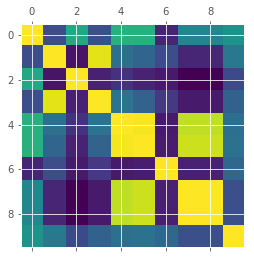

PLOT CORRELATION TIME: 0.34586620330810547


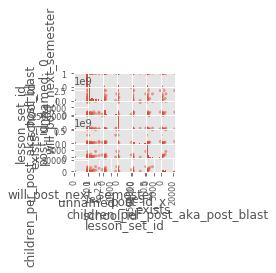

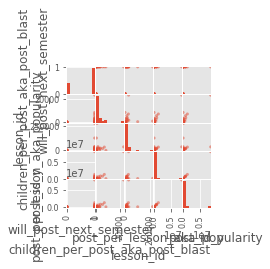

  0%|          | 0/9 [00:00<?, ?it/s]

MAKE SCATTER TIME: 3.1631007194519043

DF COLUMNS: 
['unnamed:_0', 'school_id', 'lesson_set_id', 'post_id_x', 'exists', 'children_per_post_aka_post_blast', 'lesson_id', 'post_per_lesson_aka_popularity', 'post_id_y', 'will_post_next_semester']

DF COLUMNS AFTER TRANSFORM: 
['unnamed:_0_spline_linear', 'unnamed:_0_spline_0', 'unnamed:_0_spline_1', 'unnamed:_0_spline_2', 'school_id_spline_linear', 'school_id_spline_0', 'school_id_spline_1', 'school_id_spline_2', 'lesson_set_id_spline_linear', 'lesson_set_id_spline_0', 'lesson_set_id_spline_1', 'lesson_set_id_spline_2', 'post_id_x_spline_linear', 'post_id_x_spline_0', 'post_id_x_spline_1', 'post_id_x_spline_2', 'exists_spline_linear', 'exists_spline_0', 'exists_spline_1', 'exists_spline_2', 'children_per_post_aka_post_blast_spline_linear', 'children_per_post_aka_post_blast_spline_0', 'children_per_post_aka_post_blast_spline_1', 'children_per_post_aka_post_blast_spline_2', 'lesson_id_spline_linear', 'lesson_id_spline_0', 'lesson_id_spline_1

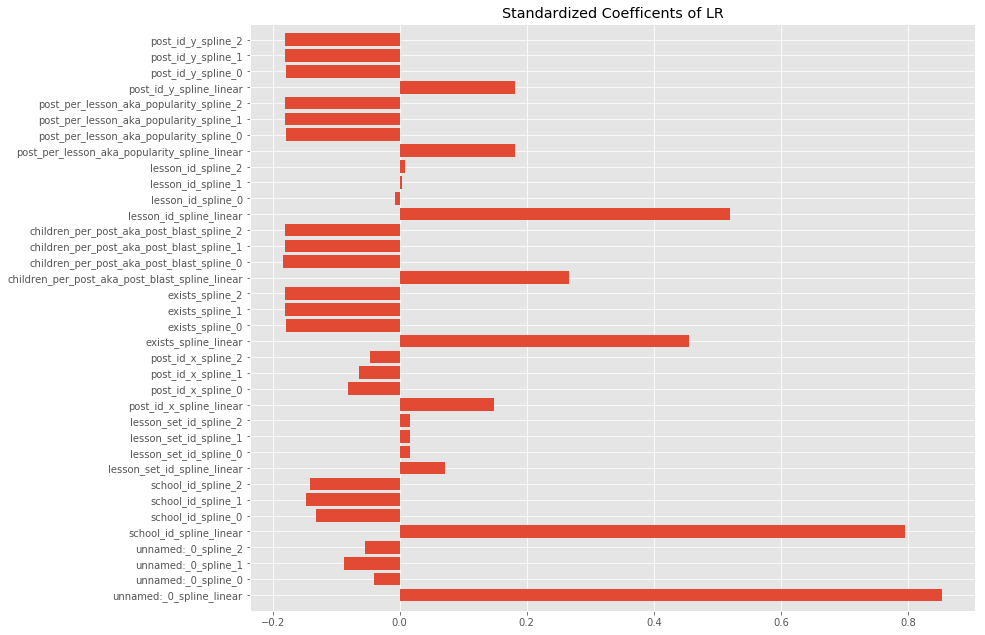

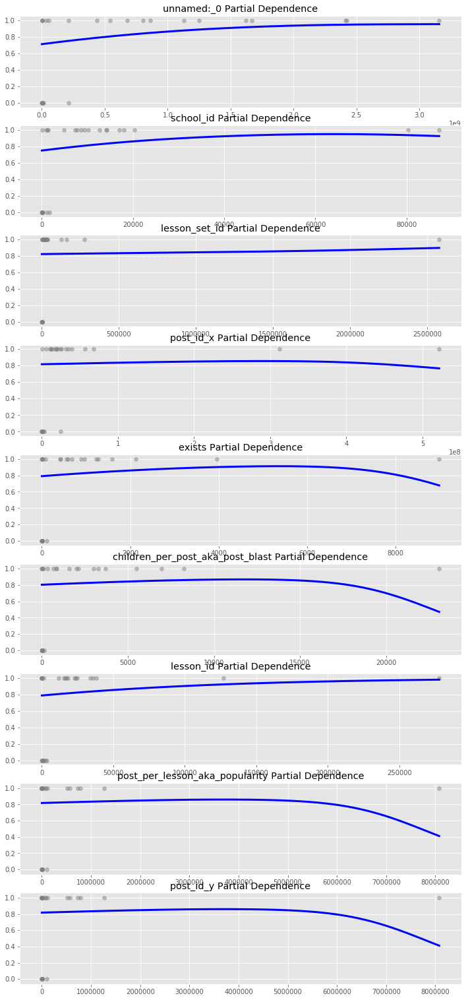

 11%|█         | 1/9 [00:11<01:28, 11.10s/it]

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 10.356535911560059
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.006306886672973633
[ 0.95498131  0.5833592   0.04818798  0.08845611  0.20904043  0.57801028
  0.267464    0.49657925  0.10349786  0.58150674  0.57413651  0.16833458
  0.22804952  0.03787244  0.58315869  0.03618362  0.02610706  0.09543476
  0.20598762  0.58296627  0.56770198  0.56835834  0.57899467  0.42161262
  0.05545405  0.56055421]
classroom_id
1        True
3       False
15       True
16       True
18       True
19      False
21       True
24      False
25       True
28      False
30      False
31       True
32       True
34       True
37      False
41       True
42       True
55       True
56       True
155      True
605      True
900      True
903     False
1509     True
2909     True
3179    False
Name: will_post_next_semester, dtype: bool
LR: logloss = -1.547002227625711
LR: logloss = 0.3076923076923077
LASSOish: mean=0.850000 std=0.320156
CV CALC TIME: 0.0299048423767089

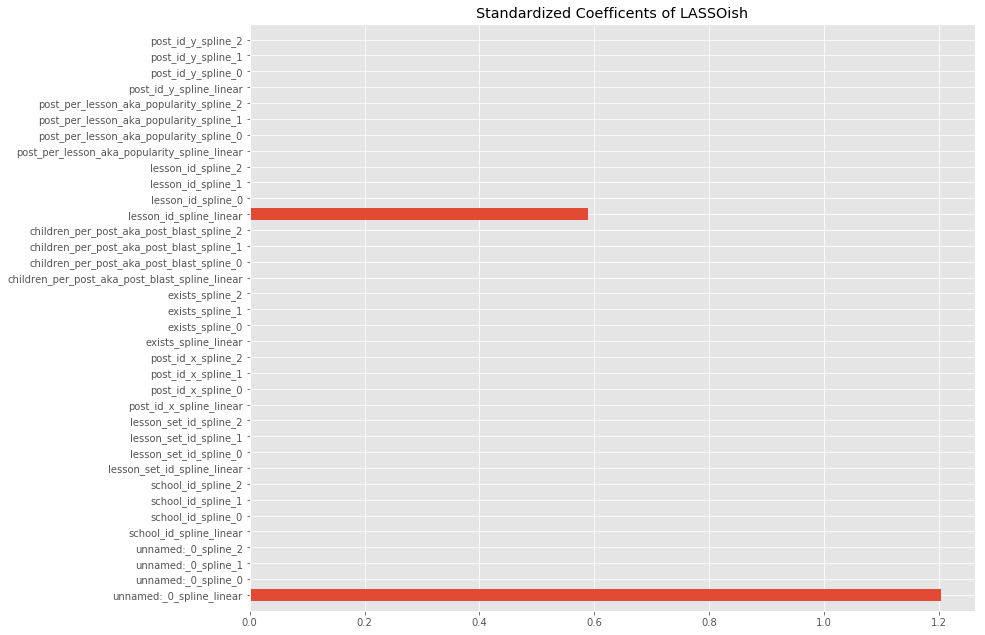

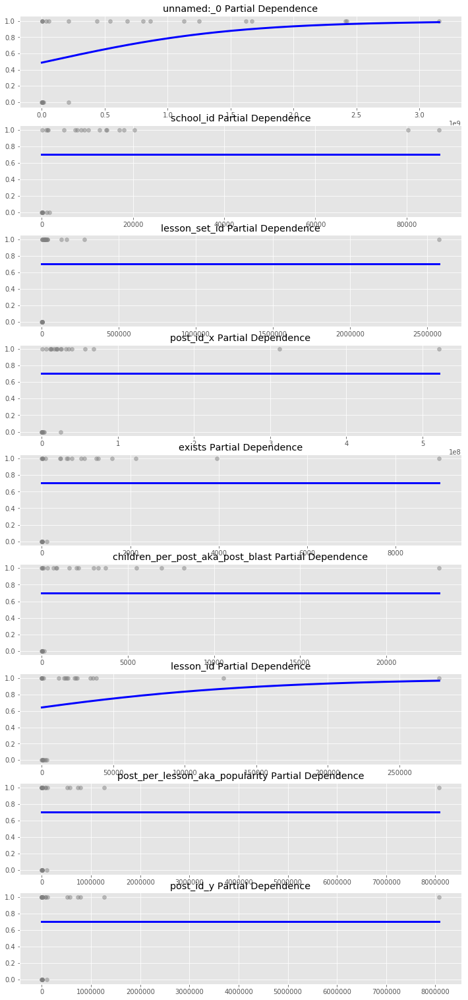

 22%|██▏       | 2/9 [00:21<01:14, 10.70s/it]

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 9.239590883255005
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.0031371116638183594
[ 0.0348669   0.57995948  0.04109976  0.318143    0.44906447  0.57477153
  0.32684316  0.50197903  0.10950999  0.57792341  0.57115989  0.2018795
  0.37116559  0.01882733  0.57942347  0.02489055  0.1332198   0.14633362
  0.25158316  0.57971709  0.57565216  0.57844579  0.57855382  0.52368421
  0.25371436  0.57404592]
classroom_id
1        True
3       False
15       True
16       True
18       True
19      False
21       True
24      False
25       True
28      False
30      False
31       True
32       True
34       True
37      False
41       True
42       True
55       True
56       True
155      True
605      True
900      True
903     False
1509     True
2909     True
3179    False
Name: will_post_next_semester, dtype: bool
LASSOish: logloss = -1.4528509910962673
LASSOish: logloss = 0.3076923076923077
LDA: mean=0.533333 std=0.331662
CV CALC TIME: 0.028678178

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are

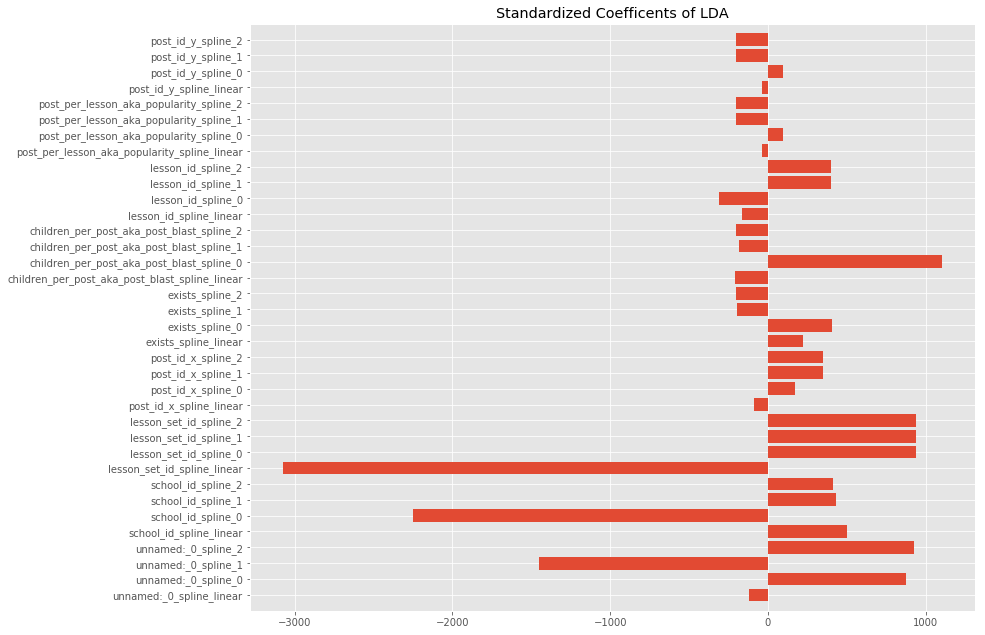

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:510: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)


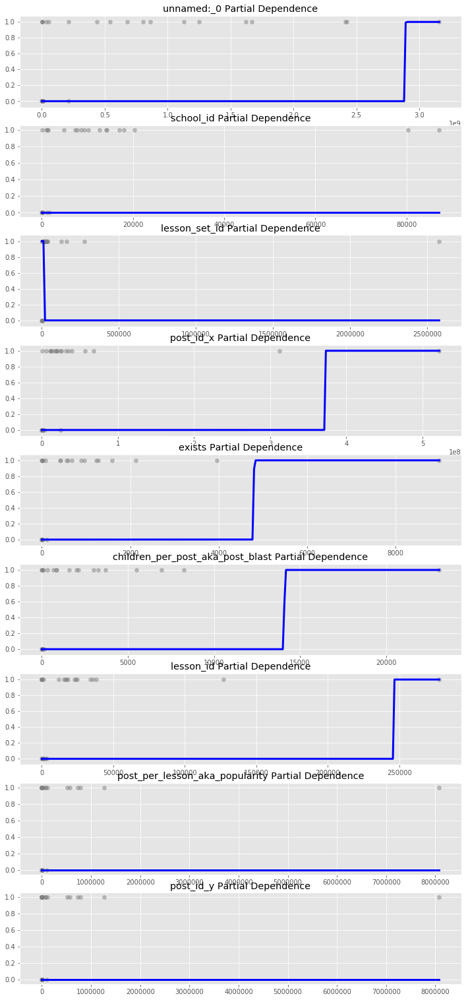

/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:401: RuntimeWarning: divide by zero encountered in log
  logloss = np.mean(y * np.log(y_hat) + (1 - y) * np.log(1 - y_hat))
 33%|███▎      | 3/9 [00:31<01:02, 10.46s/it]

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 9.212279081344604
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.0029938220977783203
[  5.45856632e-06   9.99999727e-01   1.00000000e+00   5.46026552e-06
   5.54529110e-06   5.12026097e-01   4.46104020e-06   9.99997777e-01
   5.37568797e-06   9.93586999e-01   1.00000000e+00   9.82570546e-01
   5.28194115e-06   5.45852477e-06   1.38867327e-01   5.45852846e-06
   5.45931327e-06   6.15040050e-06   4.62784075e-06   9.50974542e-02
   6.25514238e-02   1.29371418e-07   1.58511710e-01   3.91259935e-06
   1.00000000e+00   9.98769110e-01]
classroom_id
1        True
3       False
15       True
16       True
18       True
19      False
21       True
24      False
25       True
28      False
30      False
31       True
32       True
34       True
37      False
41       True
42       True
55       True
56       True
155      True
605      True
900      True
903     False
1509     True
2909     True
3179    False
Name: will_post_next_semester, dtype: bool
LDA

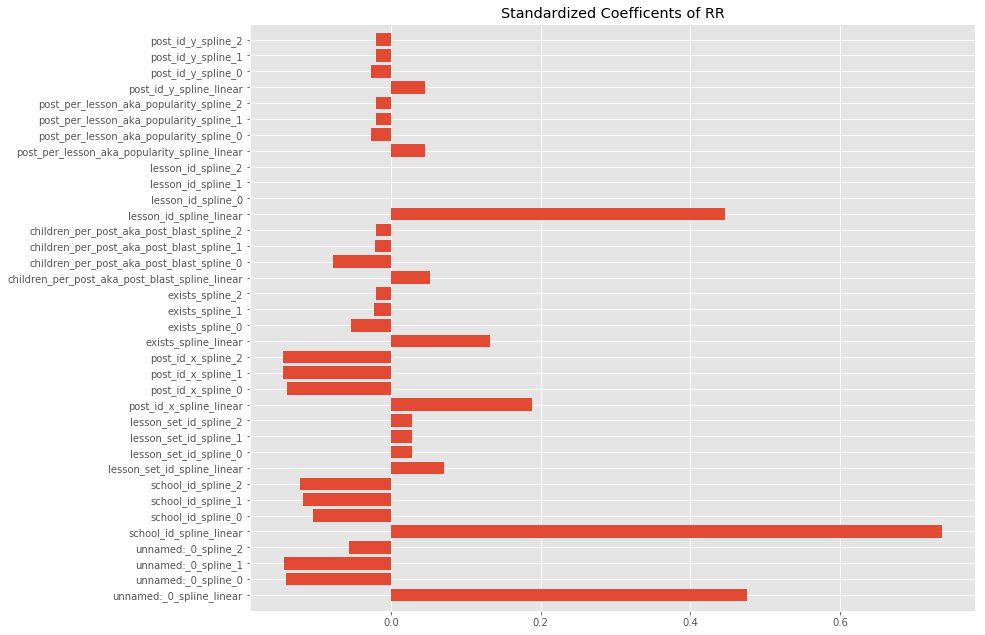

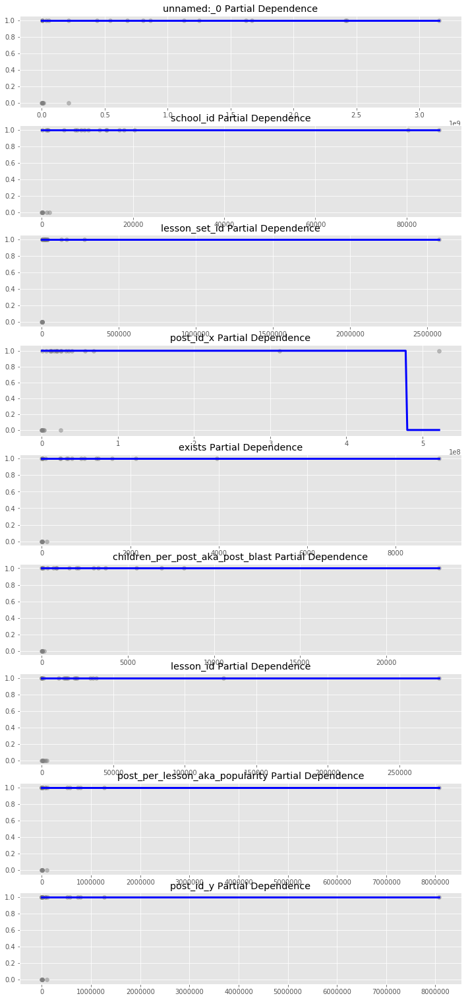

 44%|████▍     | 4/9 [00:41<00:51, 10.26s/it]

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 8.924316167831421
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.003933906555175781
RR: logloss = 0.3076923076923077
KNN: mean=0.800000 std=0.331662
CV CALC TIME: 0.025849103927612305
PLOT PREDICTED VS ACTUALS TIME: 0.0


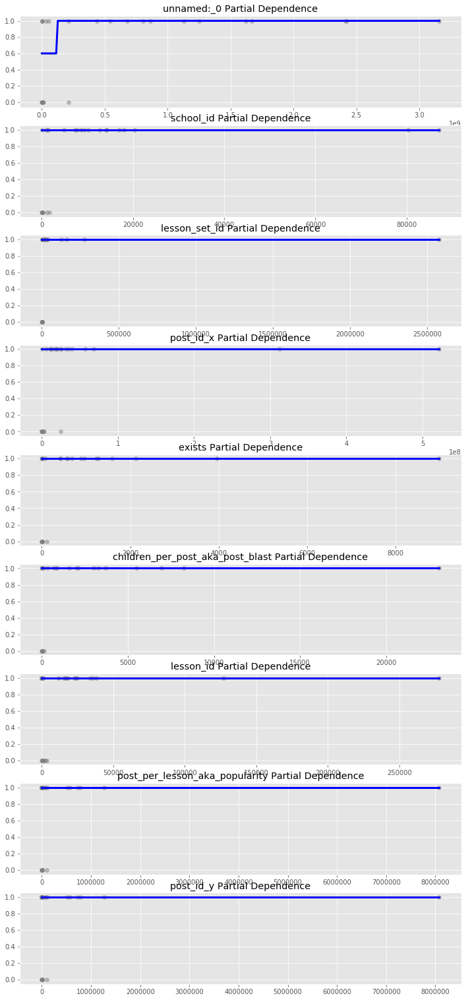

/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:401: RuntimeWarning: divide by zero encountered in log
  logloss = np.mean(y * np.log(y_hat) + (1 - y) * np.log(1 - y_hat))
 56%|█████▌    | 5/9 [00:49<00:39,  9.94s/it]

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 8.633352041244507
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.0037271976470947266
[ 0.   0.8  0.   0.   0.   0.8  0.2  0.6  0.   0.8  0.8  0.   0.   0.   0.8
  0.   0.   0.   0.   0.8  0.2  0.2  0.6  0.   0.   0.4]
classroom_id
1        True
3       False
15       True
16       True
18       True
19      False
21       True
24      False
25       True
28      False
30      False
31       True
32       True
34       True
37      False
41       True
42       True
55       True
56       True
155      True
605      True
900      True
903     False
1509     True
2909     True
3179    False
Name: will_post_next_semester, dtype: bool
KNN: logloss = -inf
DT: mean=0.666667 std=0.288675
CV CALC TIME: 0.019001245498657227
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07
PLOT FEATURE IMPORTANCES TIME: 0.08384203910827637


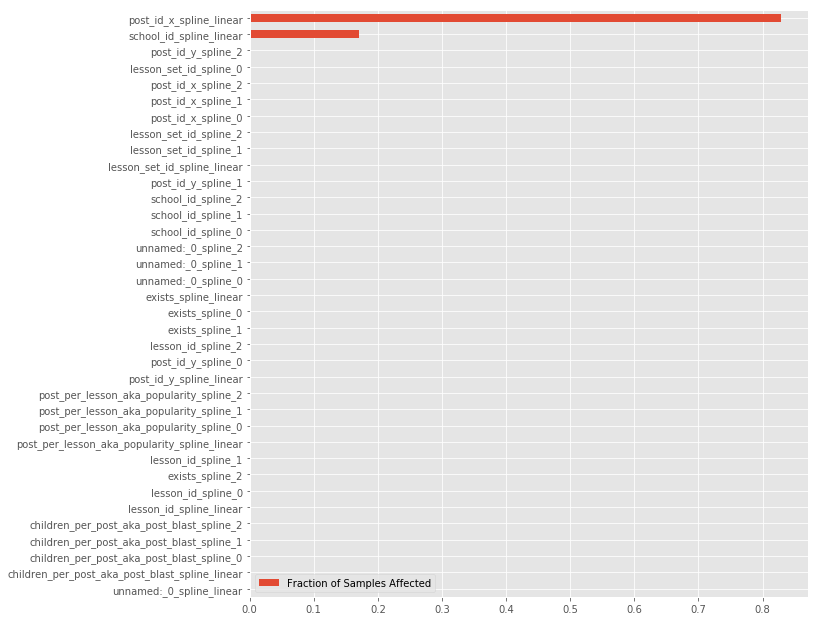

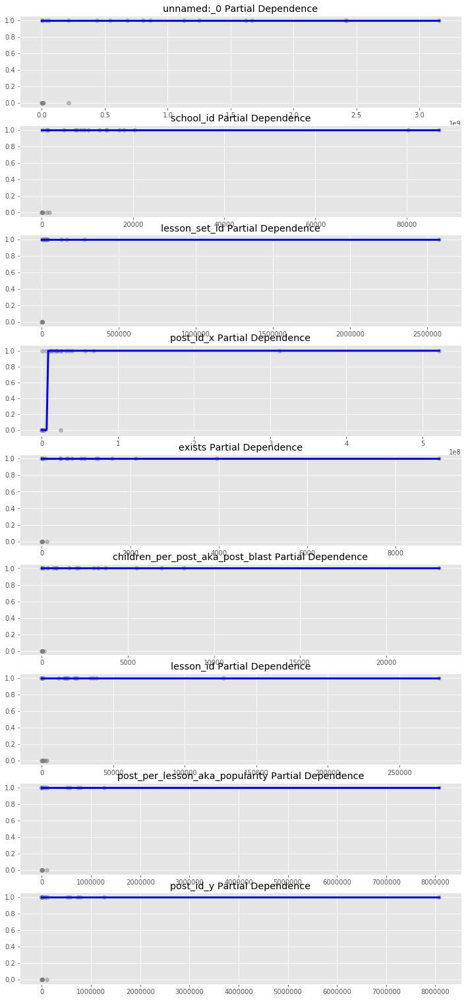

/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:401: RuntimeWarning: divide by zero encountered in log
  logloss = np.mean(y * np.log(y_hat) + (1 - y) * np.log(1 - y_hat))
 67%|██████▋   | 6/9 [01:00<00:30, 10.16s/it]

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 11.096714973449707
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.002938985824584961
[ 0.  0.  0.  0.  0.  1.  0.  1.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  1.  1.  0.  0.  0.]
classroom_id
1        True
3       False
15       True
16       True
18       True
19      False
21       True
24      False
25       True
28      False
30      False
31       True
32       True
34       True
37      False
41       True
42       True
55       True
56       True
155      True
605      True
900      True
903     False
1509     True
2909     True
3179    False
Name: will_post_next_semester, dtype: bool
DT: logloss = -inf
RF: mean=0.766667 std=0.326599
CV CALC TIME: 0.1848900318145752
PLOT PREDICTED VS ACTUALS TIME: 0.0
PLOT FEATURE IMPORTANCES TIME: 0.1193239688873291


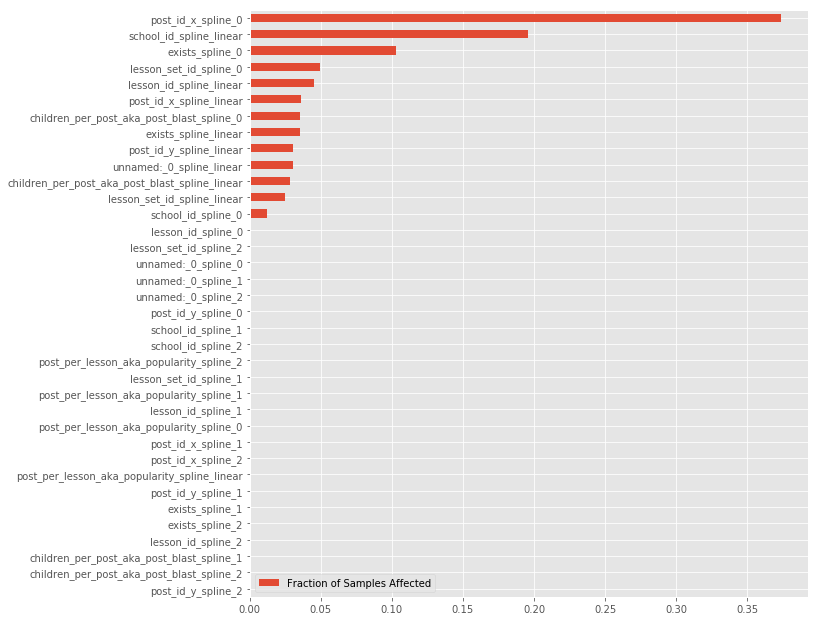

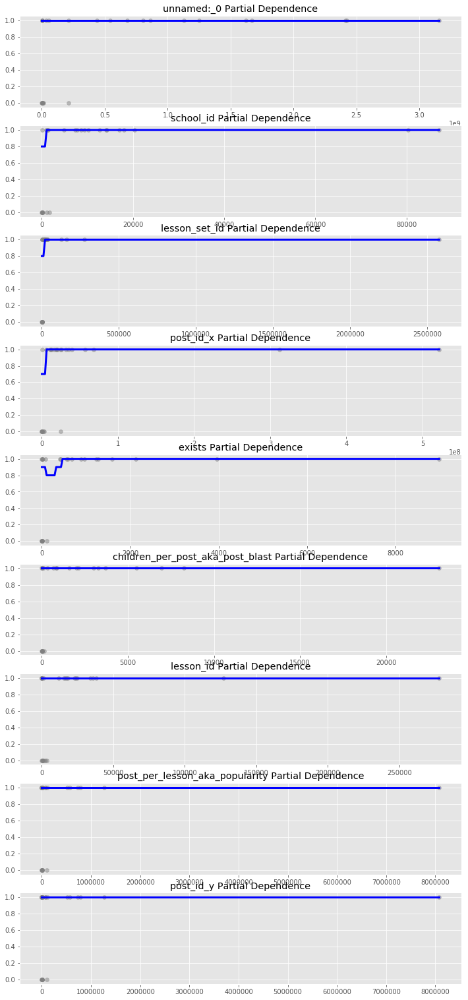

/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:401: RuntimeWarning: divide by zero encountered in log
  logloss = np.mean(y * np.log(y_hat) + (1 - y) * np.log(1 - y_hat))
 78%|███████▊  | 7/9 [01:12<00:20, 10.36s/it]

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 11.085896015167236
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.005197763442993164
[ 0.   1.   0.   0.   0.   0.8  0.2  1.   0.   1.   0.9  0.   0.   0.   0.9
  0.1  0.   0.   0.1  0.6  0.2  0.   0.9  0.   0.1  0.1]
classroom_id
1        True
3       False
15       True
16       True
18       True
19      False
21       True
24      False
25       True
28      False
30      False
31       True
32       True
34       True
37      False
41       True
42       True
55       True
56       True
155      True
605      True
900      True
903     False
1509     True
2909     True
3179    False
Name: will_post_next_semester, dtype: bool
RF: logloss = -inf
GB: mean=0.666667 std=0.288675
CV CALC TIME: 0.444957971572876
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07
PLOT FEATURE IMPORTANCES TIME: 0.09422087669372559


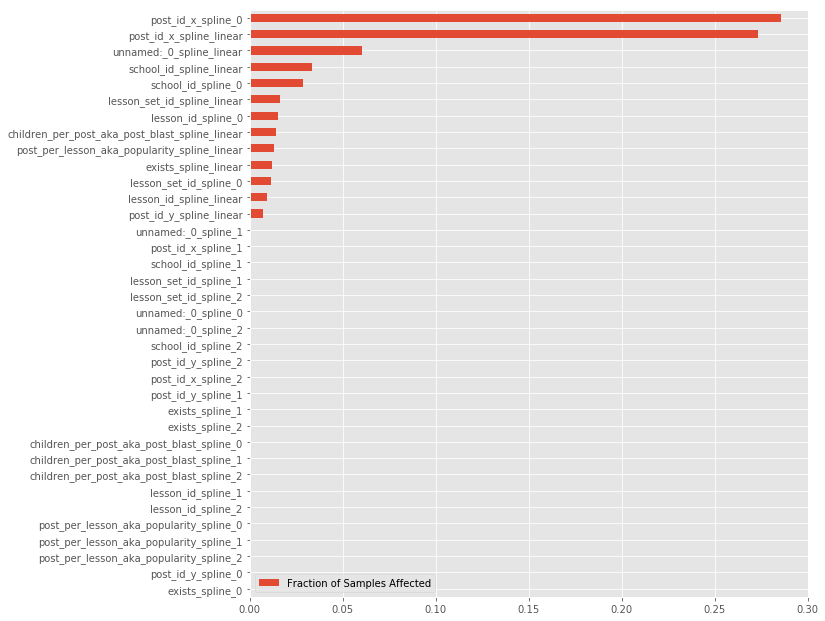

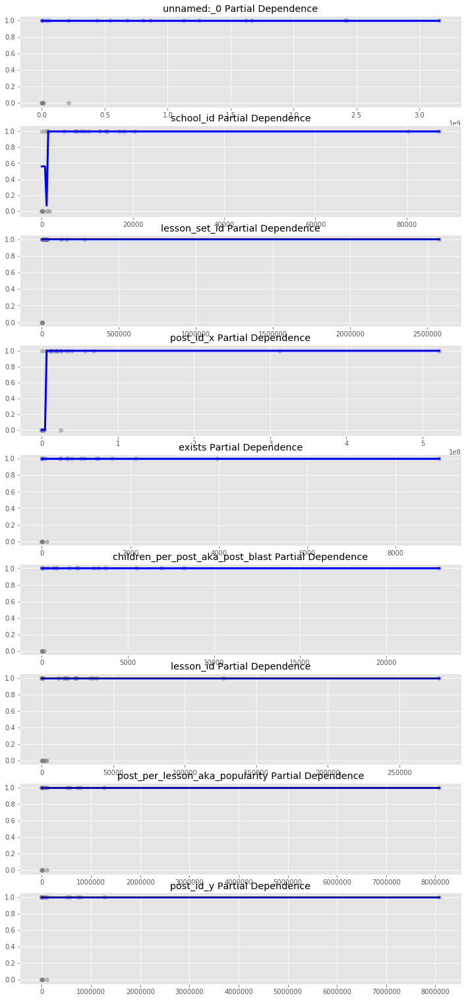

 89%|████████▉ | 8/9 [01:23<00:10, 10.42s/it]

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 9.88013482093811
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.0029931068420410156
[  2.69274198e-04   9.99779659e-01   2.69274198e-04   2.69274198e-04
   2.69274198e-04   9.99779659e-01   3.77595548e-04   9.99740563e-01
   2.69274198e-04   9.99797122e-01   9.99779659e-01   2.69274198e-04
   2.69274198e-04   2.69274198e-04   9.99779659e-01   2.69274198e-04
   2.69274198e-04   2.69274198e-04   2.69274198e-04   7.61293069e-04
   4.44581639e-04   3.77595548e-04   9.99779659e-01   2.69274198e-04
   2.69274198e-04   9.99366837e-01]
classroom_id
1        True
3       False
15       True
16       True
18       True
19      False
21       True
24      False
25       True
28      False
30      False
31       True
32       True
34       True
37      False
41       True
42       True
55       True
56       True
155      True
605      True
900      True
903     False
1509     True
2909     True
3179    False
Name: will_post_next_semester, dtype: bool
GB: 

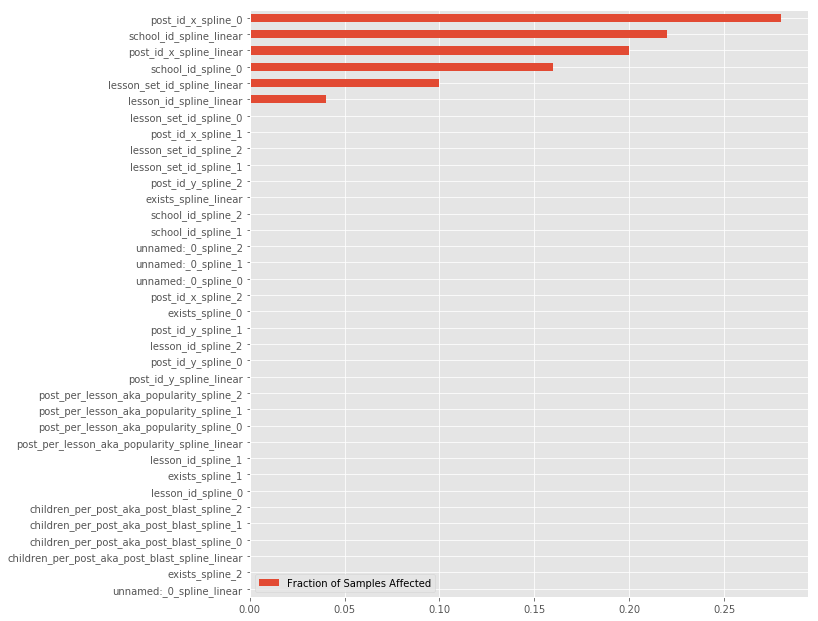

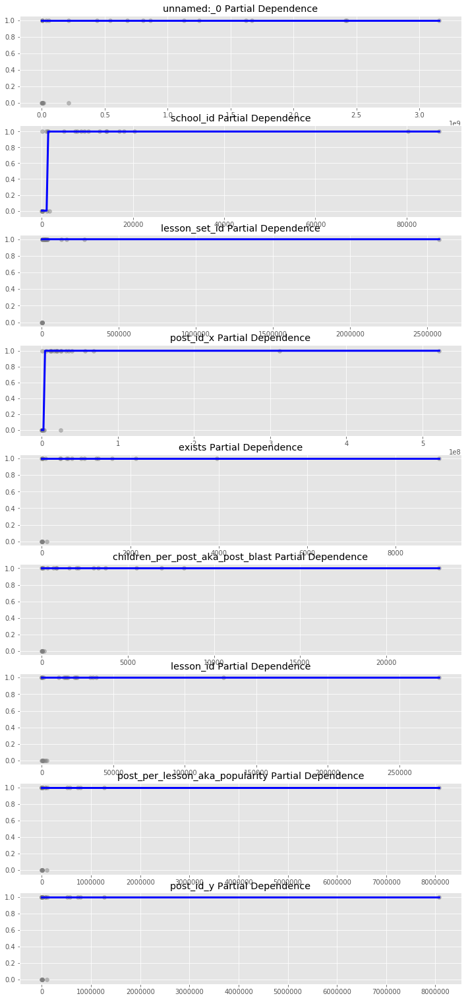

100%|██████████| 9/9 [01:35<00:00, 10.65s/it]

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 10.764150857925415
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.004160881042480469
[  7.38265355e-06   1.00000000e+00   7.38265355e-06   7.38265355e-06
   7.38265355e-06   1.00000000e+00   7.38265355e-06   9.99994886e-01
   7.38265355e-06   1.00000000e+00   1.00000000e+00   7.38265355e-06
   7.38265355e-06   6.54723486e-06   1.00000000e+00   7.38265355e-06
   6.54723486e-06   7.38265355e-06   7.38265355e-06   1.00000000e+00
   9.99991957e-01   6.54723486e-06   9.99997291e-01   7.38265355e-06
   7.38265355e-06   9.99991957e-01]
classroom_id
1        True
3       False
15       True
16       True
18       True
19      False
21       True
24      False
25       True
28      False
30      False
31       True
32       True
34       True
37      False
41       True
42       True
55       True
56       True
155      True
605      True
900      True
903     False
1509     True
2909     True
3179    False
Name: will_post_next_semester, dtype: bool
DT:

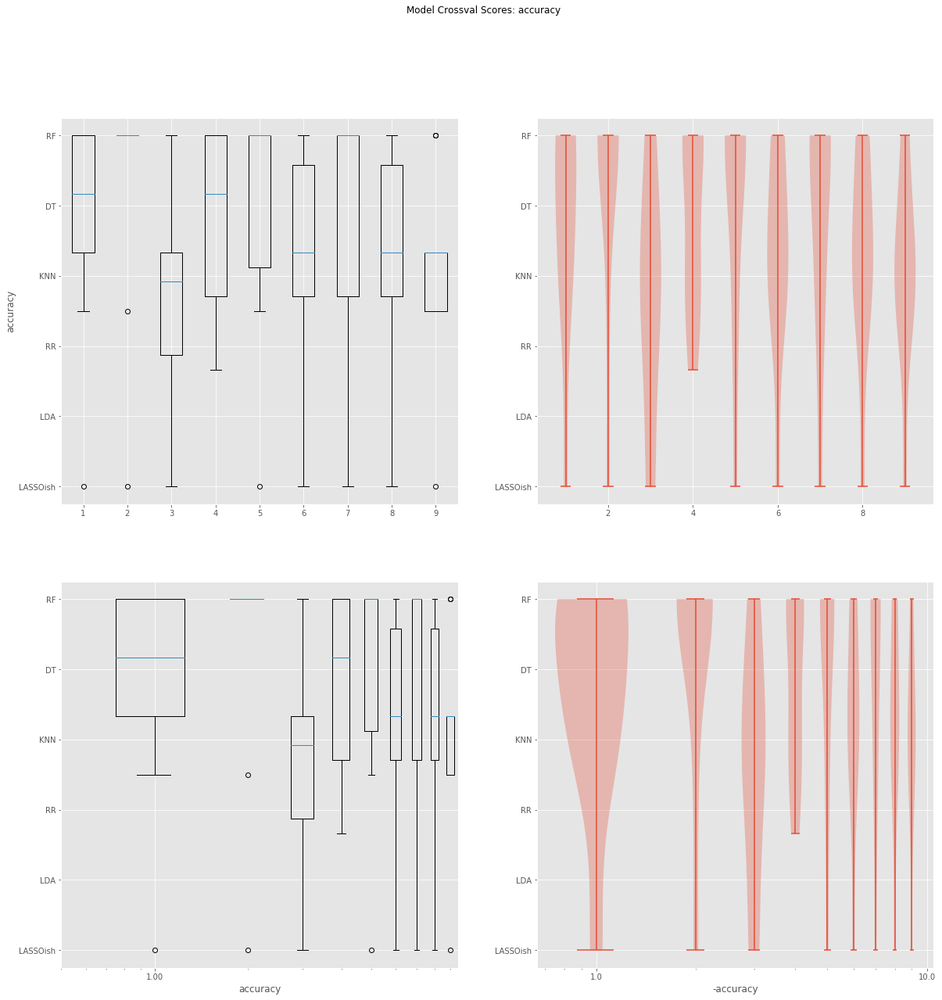

PLOT BAR AND VIOLIN TIME: 1.8446159362792969


/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:510: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)


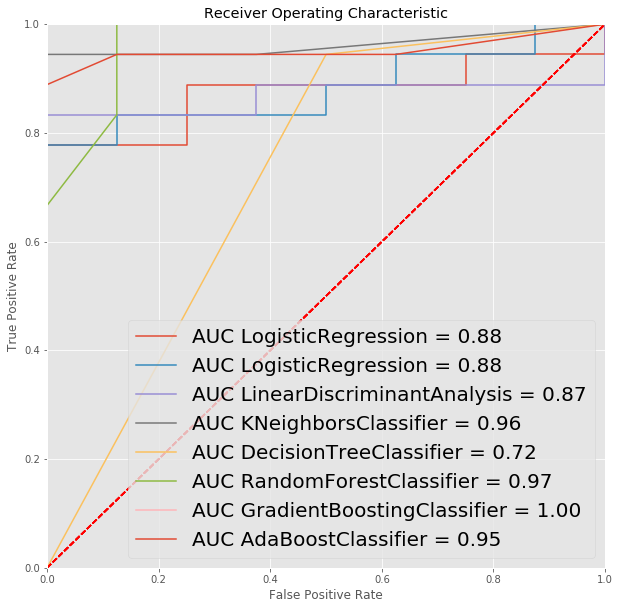

PLOT ROC TIME: 0.6832981109619141


In [76]:
names1, results1, models1, pipeline1, df_X1 = autoregression.compare_predictions(classrooms_sum_before_now, 'will_post_next_semester')

In [88]:
y_hat = models1[6].predict_proba(df_X1)

In [99]:
df1_y_hat = df_X1
df1_y_hat['y_hat']=y_hat[:,0]

In [109]:
#classroom answers in order!!!!!!!!!!!!!!!!
danger_classrooms = df1_y_hat.iloc[y_hat[:,0].argsort()[::-1]]

In [110]:
danger_classrooms.to_csv('../data/danger_classrooms.csv')

In [90]:
df_X1[y_hat[:,0]==1]

,unnamed:_0_spline_linear,unnamed:_0_spline_0,unnamed:_0_spline_1,unnamed:_0_spline_2,school_id_spline_linear,school_id_spline_0,school_id_spline_1,school_id_spline_2,lesson_set_id_spline_linear,lesson_set_id_spline_0,...,lesson_id_spline_1,lesson_id_spline_2,post_per_lesson_aka_popularity_spline_linear,post_per_lesson_aka_popularity_spline_0,post_per_lesson_aka_popularity_spline_1,post_per_lesson_aka_popularity_spline_2,post_id_y_spline_linear,post_id_y_spline_0,post_id_y_spline_1,post_id_y_spline_2
classroom_id,,,,,,,,,,,,,,,,,,,,,
3,-0.758467,-0.420850,-0.339317,-0.273972,-0.566336,-0.295390,-0.286051,-0.283704,-0.260642,-0.200358,...,-0.204884,-0.2,-0.305401,-0.201347,-0.2,-0.2,-0.305401,-0.201347,-0.2,-0.2
24,-0.520827,-0.419411,-0.339317,-0.273972,-0.492394,-0.295363,-0.286051,-0.283704,-0.260756,-0.200358,...,-0.204884,-0.2,-0.237895,-0.201335,-0.2,-0.2,-0.237895,-0.201335,-0.2,-0.2
28,-0.758786,-0.420850,-0.339317,-0.273972,-0.565410,-0.295390,-0.286051,-0.283704,-0.264656,-0.200358,...,-0.204884,-0.2,-0.305068,-0.201347,-0.2,-0.2,-0.305068,-0.201347,-0.2,-0.2


In [113]:
[a,b,c,d,e,f,g] = unzip(danger_classrooms)

NameError: name 'unzip' is not defined

In [115]:
[i for i in danger_classrooms]

['unnamed:_0_spline_linear',
 'unnamed:_0_spline_0',
 'unnamed:_0_spline_1',
 'unnamed:_0_spline_2',
 'school_id_spline_linear',
 'school_id_spline_0',
 'school_id_spline_1',
 'school_id_spline_2',
 'lesson_set_id_spline_linear',
 'lesson_set_id_spline_0',
 'lesson_set_id_spline_1',
 'lesson_set_id_spline_2',
 'post_id_x_spline_linear',
 'post_id_x_spline_0',
 'post_id_x_spline_1',
 'post_id_x_spline_2',
 'exists_spline_linear',
 'exists_spline_0',
 'exists_spline_1',
 'exists_spline_2',
 'children_per_post_aka_post_blast_spline_linear',
 'children_per_post_aka_post_blast_spline_0',
 'children_per_post_aka_post_blast_spline_1',
 'children_per_post_aka_post_blast_spline_2',
 'lesson_id_spline_linear',
 'lesson_id_spline_0',
 'lesson_id_spline_1',
 'lesson_id_spline_2',
 'post_per_lesson_aka_popularity_spline_linear',
 'post_per_lesson_aka_popularity_spline_0',
 'post_per_lesson_aka_popularity_spline_1',
 'post_per_lesson_aka_popularity_spline_2',
 'post_id_y_spline_linear',
 'post_id_y_

In [117]:
[list(danger_classrooms[i].values) for i in danger_classrooms]

[[-0.7587863786512774,
  -0.75846736170539031,
  -0.52082741207818317,
  -0.75693384078062842,
  -0.75791207827684282,
  -0.75764142428689218,
  -0.74211256506206336,
  -0.75863062327251418,
  -0.75542968710008496,
  0.0073004249972864026,
  -0.69745378867291519,
  -0.75100836089017142,
  0.14442814746740923,
  0.21075052654140239,
  -0.52014812961539114,
  1.9685347743075559,
  -0.15106079680306506,
  -0.26773090897519614,
  1.1177591859993363,
  0.51067685983705113,
  2.7964164318216507,
  1.0666683323723727,
  0.64560232383640248,
  -0.75330418945371025,
  -0.71887001139297746,
  1.9581805498368372],
 [-0.42085026130677317,
  -0.42085026130330533,
  -0.41941105875284262,
  -0.42085026062769937,
  -0.42085026123538971,
  -0.42085026114645596,
  -0.42084976617531056,
  -0.42085026130636954,
  -0.42085025726706493,
  -0.37282722197256501,
  -0.42082561853173367,
  -0.4208502110467725,
  -0.34214777738626379,
  -0.32350636315540876,
  -0.41939869840593358,
  1.7458816576844081,
  -0.396

In [119]:
danger_classrooms.columns

Index(['unnamed:_0_spline_linear', 'unnamed:_0_spline_0',
       'unnamed:_0_spline_1', 'unnamed:_0_spline_2', 'school_id_spline_linear',
       'school_id_spline_0', 'school_id_spline_1', 'school_id_spline_2',
       'lesson_set_id_spline_linear', 'lesson_set_id_spline_0',
       'lesson_set_id_spline_1', 'lesson_set_id_spline_2',
       'post_id_x_spline_linear', 'post_id_x_spline_0', 'post_id_x_spline_1',
       'post_id_x_spline_2', 'exists_spline_linear', 'exists_spline_0',
       'exists_spline_1', 'exists_spline_2',
       'children_per_post_aka_post_blast_spline_linear',
       'children_per_post_aka_post_blast_spline_0',
       'children_per_post_aka_post_blast_spline_1',
       'children_per_post_aka_post_blast_spline_2', 'lesson_id_spline_linear',
       'lesson_id_spline_0', 'lesson_id_spline_1', 'lesson_id_spline_2',
       'post_per_lesson_aka_popularity_spline_linear',
       'post_per_lesson_aka_popularity_spline_0',
       'post_per_lesson_aka_popularity_spline_1',
   

MAKE SUBSAMPLE TIME: 4.0531158447265625e-06
CLEAN_DF TIME: 0.010564088821411133


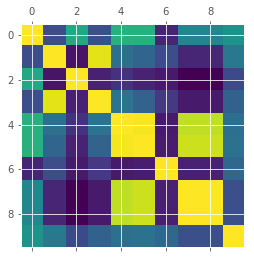

PLOT CORRELATION TIME: 0.12205696105957031


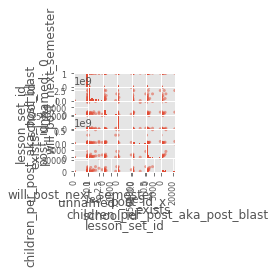

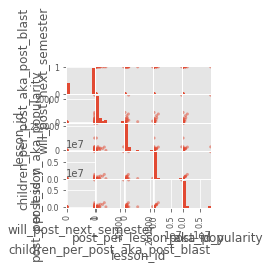

MAKE SCATTER TIME: 3.1184279918670654

DF COLUMNS: 
['unnamed:_0', 'school_id', 'lesson_set_id', 'post_id_x', 'exists', 'children_per_post_aka_post_blast', 'lesson_id', 'post_per_lesson_aka_popularity', 'post_id_y', 'will_post_next_semester']

DF COLUMNS AFTER TRANSFORM: 
['unnamed:_0_spline_linear', 'unnamed:_0_spline_0', 'unnamed:_0_spline_1', 'unnamed:_0_spline_2', 'school_id_spline_linear', 'school_id_spline_0', 'school_id_spline_1', 'school_id_spline_2', 'lesson_set_id_spline_linear', 'lesson_set_id_spline_0', 'lesson_set_id_spline_1', 'lesson_set_id_spline_2', 'post_id_x_spline_linear', 'post_id_x_spline_0', 'post_id_x_spline_1', 'post_id_x_spline_2', 'exists_spline_linear', 'exists_spline_0', 'exists_spline_1', 'exists_spline_2', 'children_per_post_aka_post_blast_spline_linear', 'children_per_post_aka_post_blast_spline_0', 'children_per_post_aka_post_blast_spline_1', 'children_per_post_aka_post_blast_spline_2', 'lesson_id_spline_linear', 'lesson_id_spline_0', 'lesson_id_spline_1

0it [00:00, ?it/s]/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

1it [00:00,  1.14it/s]/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed whe

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

2it [00:01,  1.18it/s]/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed whe

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

3it [00:02,  1.21it/s]/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed whe

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

6it [00:05,  1.16it/s]/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed whe

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

7it [00:06,  1.15it/s]/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed whe

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/base.py:340: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/base.py:340: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was 

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/base.py:340: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macb

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/base.py:340: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macb

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/base.py:340: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)
/Users/macb

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/base.py:340: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macb

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

15it [00:14,  1.01it/s]/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed wh

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

16it [00:15,  1.00it/s]/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed wh

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/base.py:340: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macb

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/base.py:340: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macb

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

21it [00:21,  1.03s/it]/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed wh

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/base.py:340: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macb

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/base.py:340: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)
/Users/macb

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/base.py:340: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macb

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expec

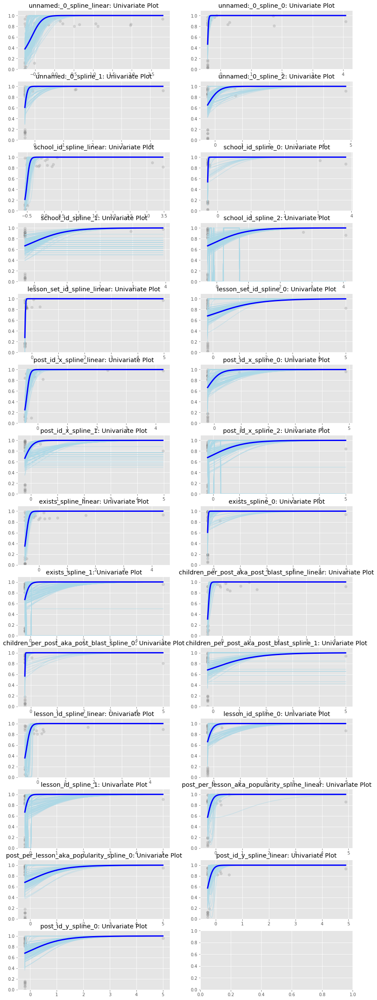

  0%|          | 0/6 [00:00<?, ?it/s]

RR: mean=-0.217769 std=0.111602
CV CALC TIME: 0.03142404556274414


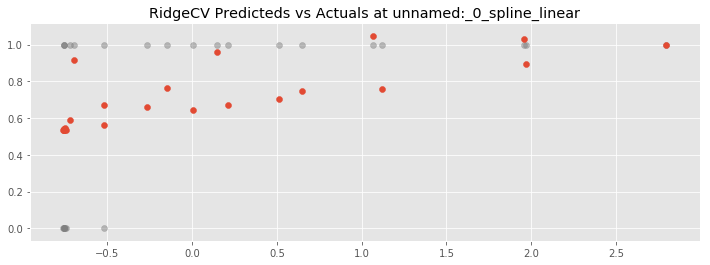

PLOT PREDICTED VS ACTUALS TIME: 0.24853825569152832


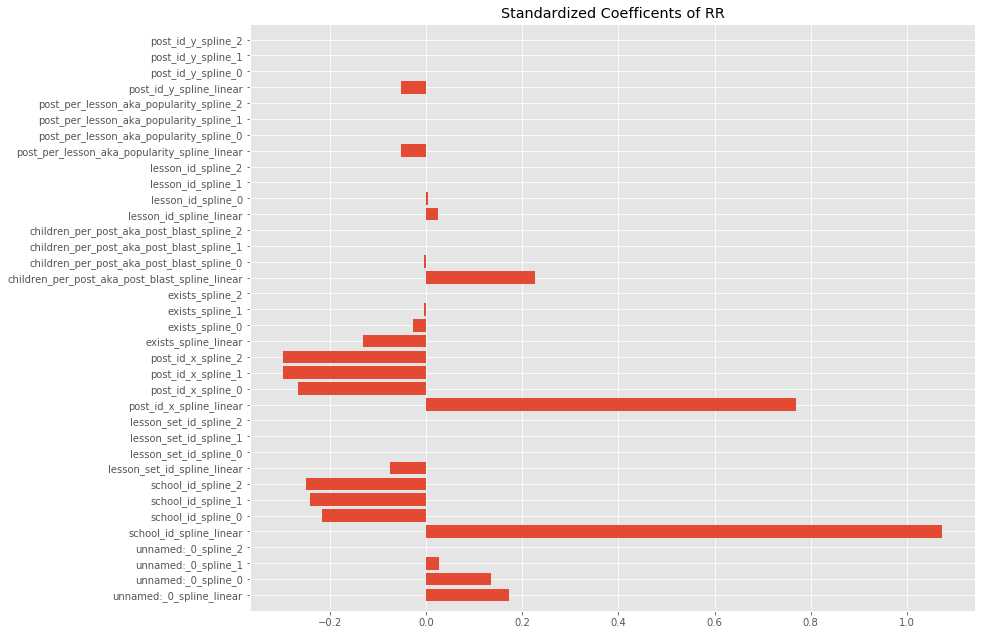

PLOT COEFFICIANTS TIME: 0.9050500392913818


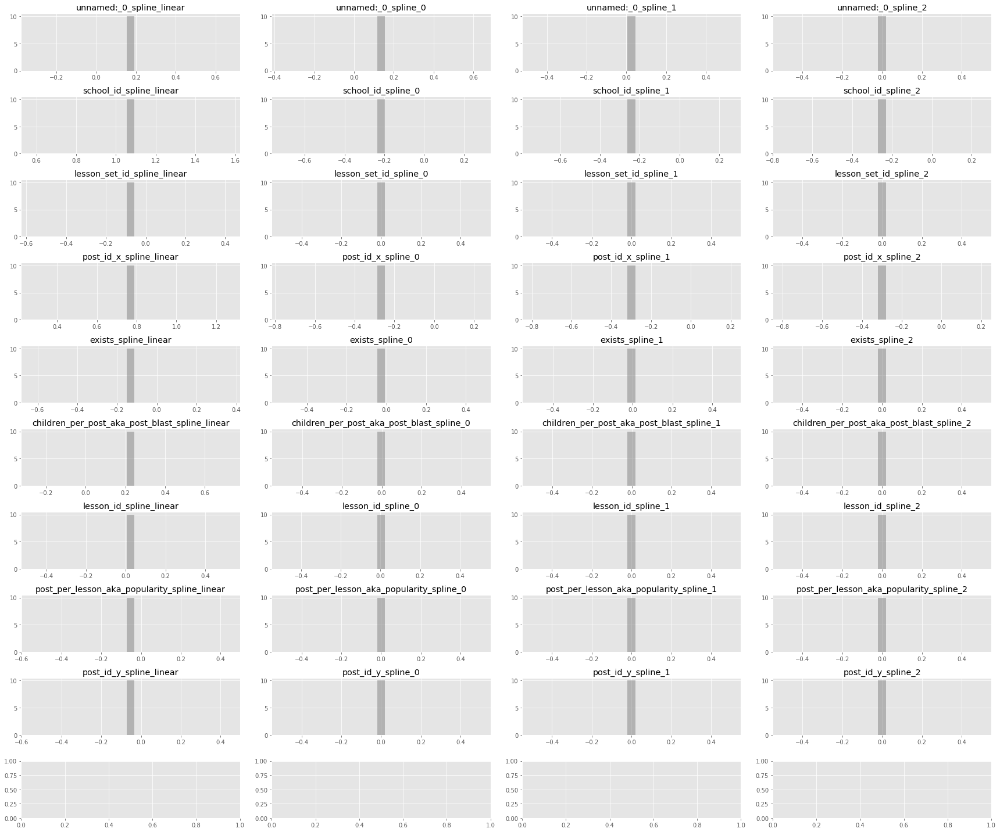

PLOT BOOTSTRAP COEFFICIANTS TIME: 6.712000131607056


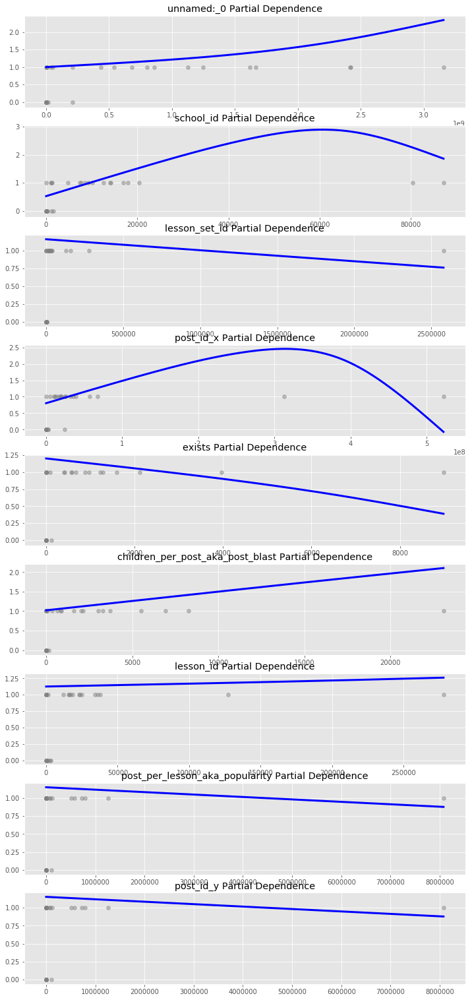

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 10.121865034103394
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.005669116973876953


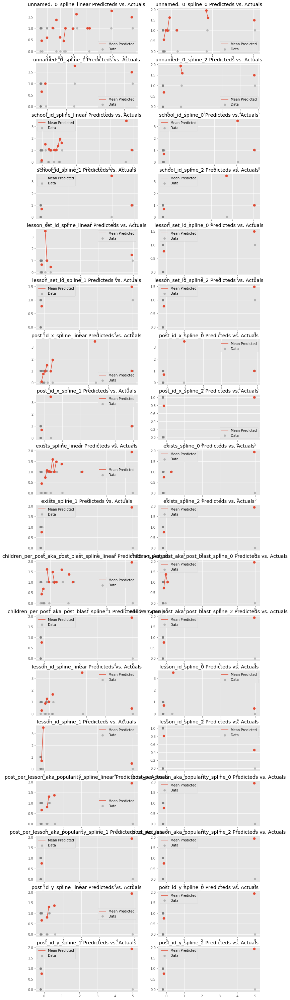

PLOT PREDICTEDS_VS_ACTUALS TIME: 6.606845855712891


/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:381: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  galgraphs.plot_residual_error(ax, df_X_sample.values[:,0].reshape(-1), y.reshape(-1), y_hat_sample.reshape(-1), s=30);


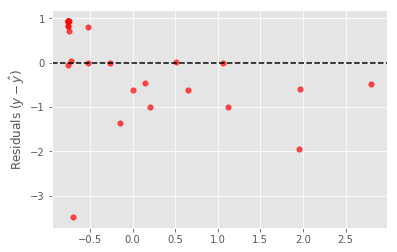

 17%|█▋        | 1/6 [00:25<02:06, 25.25s/it]

PLOT RESIDUAL ERROR TIME: 0.5811219215393066
RR: MSE = 0.4249363799223168
LASSO: mean=-0.201419 std=0.094985
CV CALC TIME: 0.1624152660369873


/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: 

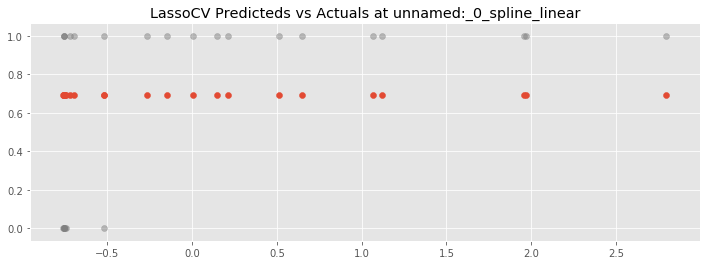

PLOT PREDICTED VS ACTUALS TIME: 0.24715614318847656


/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: 

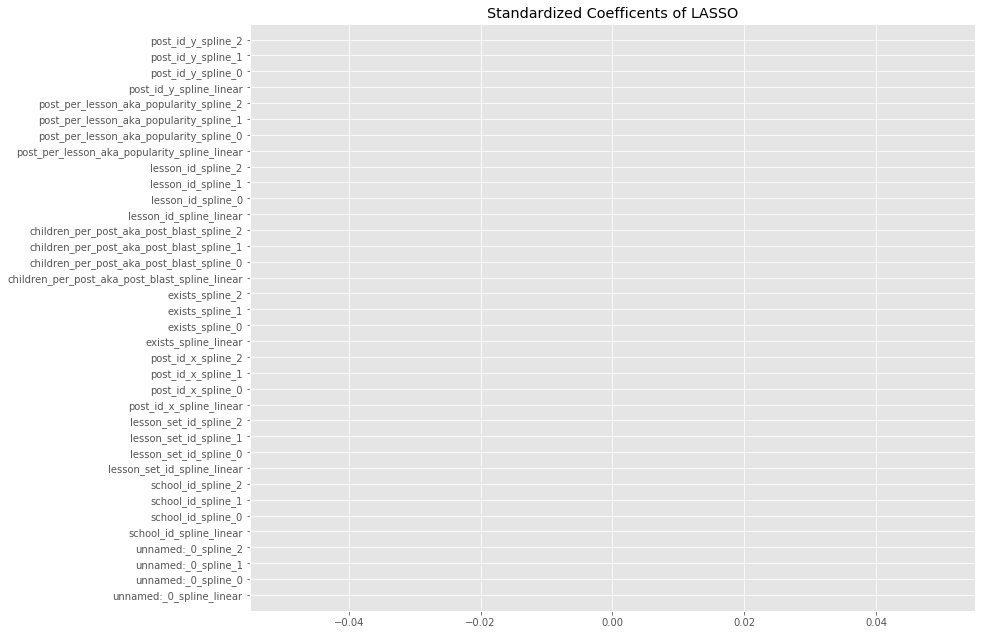

PLOT COEFFICIANTS TIME: 0.862637996673584


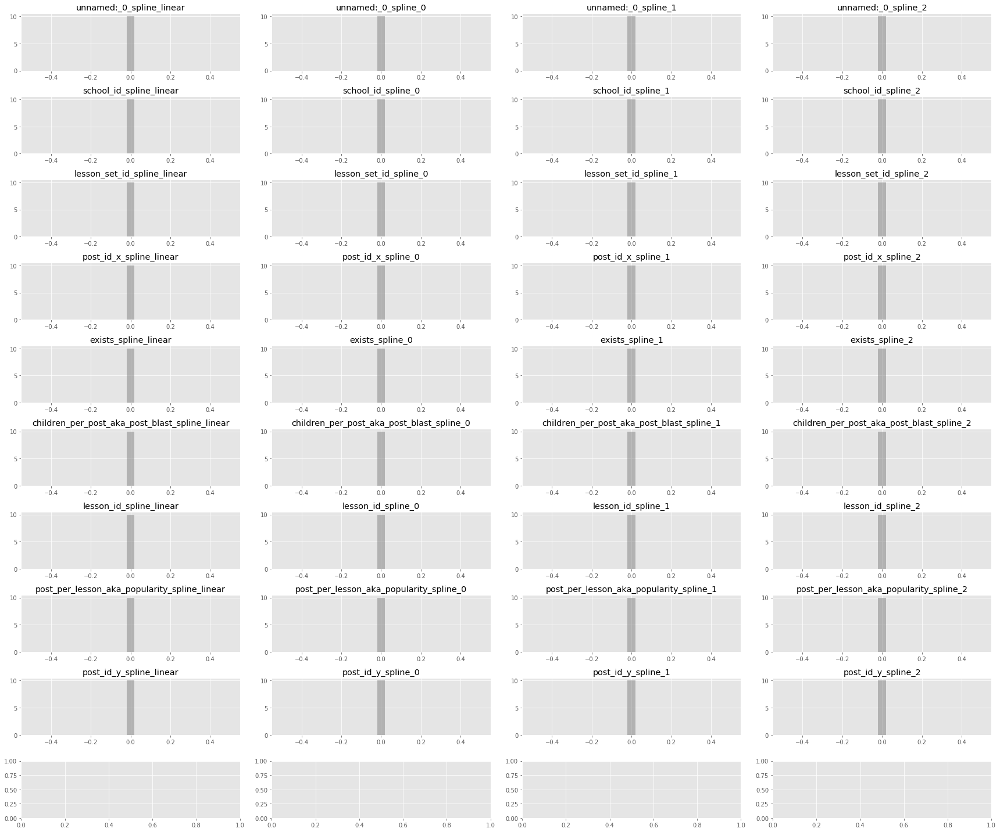

PLOT BOOTSTRAP COEFFICIANTS TIME: 6.596714973449707


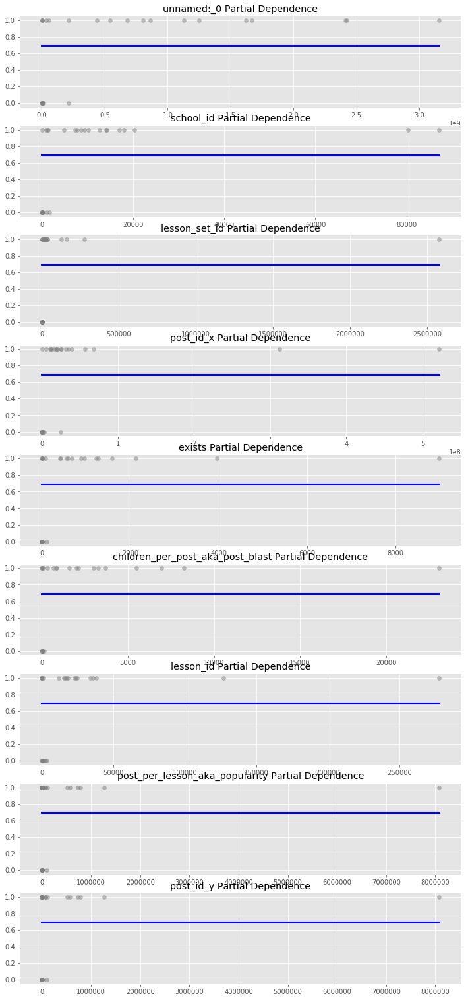

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 9.31279993057251
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.003432035446166992


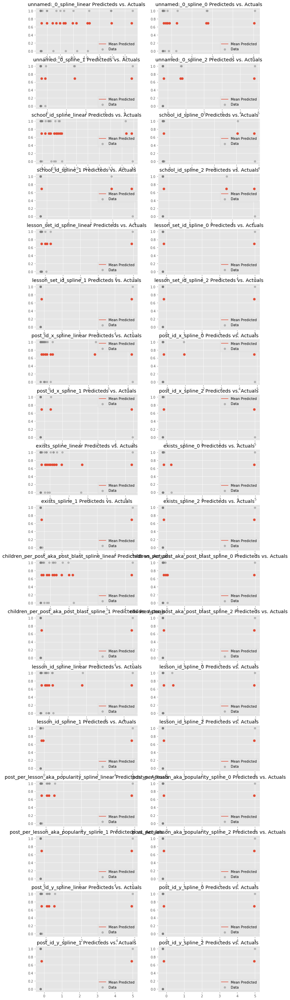

PLOT PREDICTEDS_VS_ACTUALS TIME: 6.082467079162598


/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:381: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  galgraphs.plot_residual_error(ax, df_X_sample.values[:,0].reshape(-1), y.reshape(-1), y_hat_sample.reshape(-1), s=30);


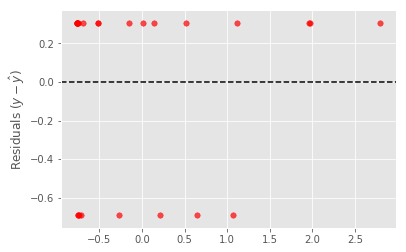

 33%|███▎      | 2/6 [00:48<01:37, 24.43s/it]

PLOT RESIDUAL ERROR TIME: 0.18432188034057617
LASSO: MSE = 0.21301775147928984
DT: mean=-0.383333 std=0.269258
CV CALC TIME: 0.0185549259185791


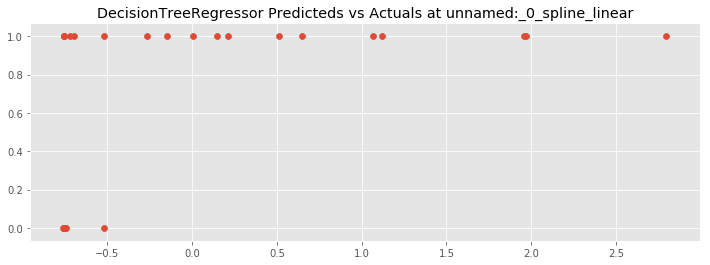

PLOT PREDICTED VS ACTUALS TIME: 0.21597909927368164
PLOT FEATURE IMPORTANCES TIME: 0.08563017845153809


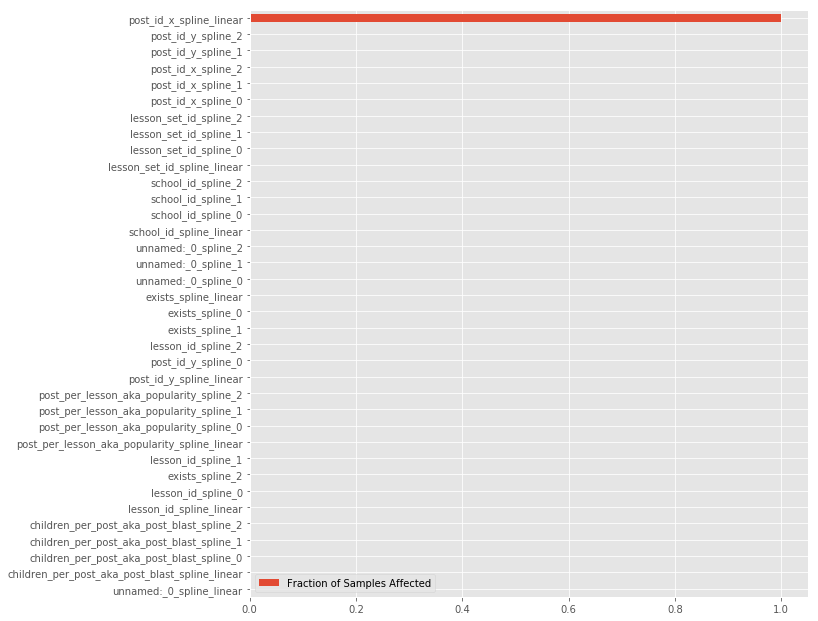

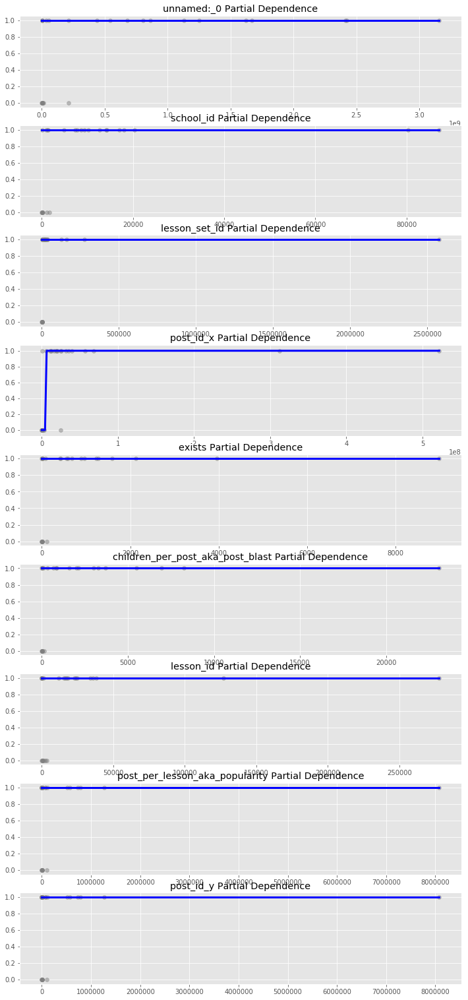

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 9.058778047561646
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.0029249191284179688


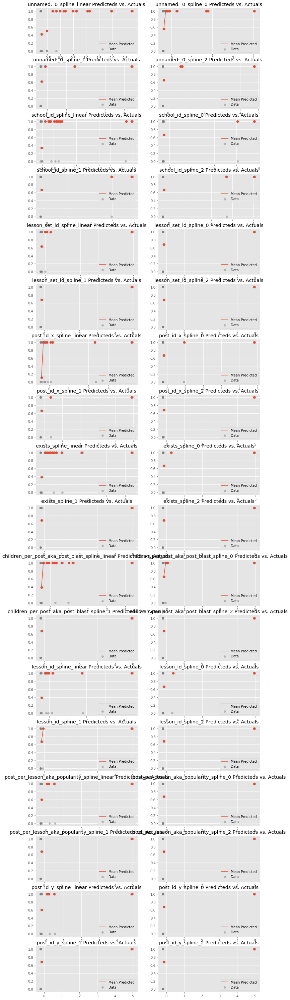

PLOT PREDICTEDS_VS_ACTUALS TIME: 6.033824920654297


/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:381: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  galgraphs.plot_residual_error(ax, df_X_sample.values[:,0].reshape(-1), y.reshape(-1), y_hat_sample.reshape(-1), s=30);


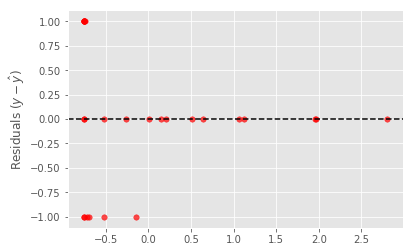

 50%|█████     | 3/6 [01:04<01:04, 21.50s/it]

PLOT RESIDUAL ERROR TIME: 0.20122385025024414
DT: MSE = 0.07692307692307693
RF: mean=-0.290500 std=0.281794
CV CALC TIME: 0.1548008918762207


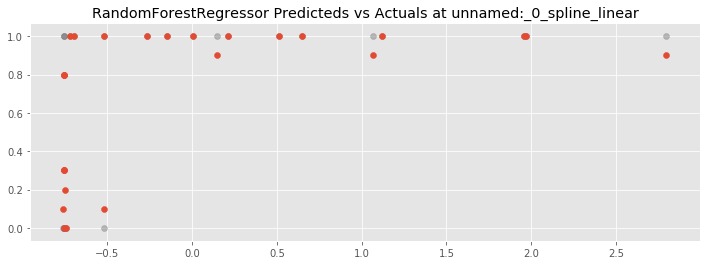

PLOT PREDICTED VS ACTUALS TIME: 0.22829794883728027
PLOT FEATURE IMPORTANCES TIME: 0.08100605010986328


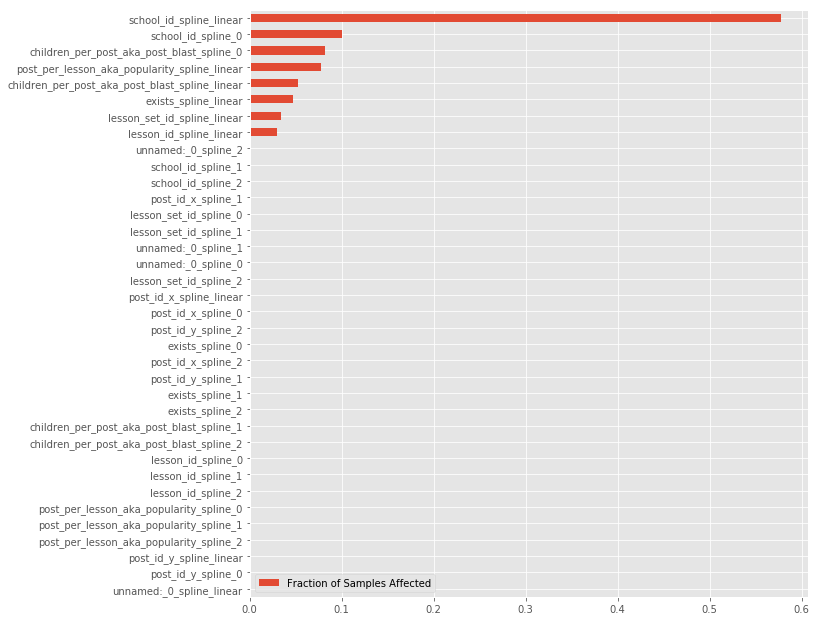

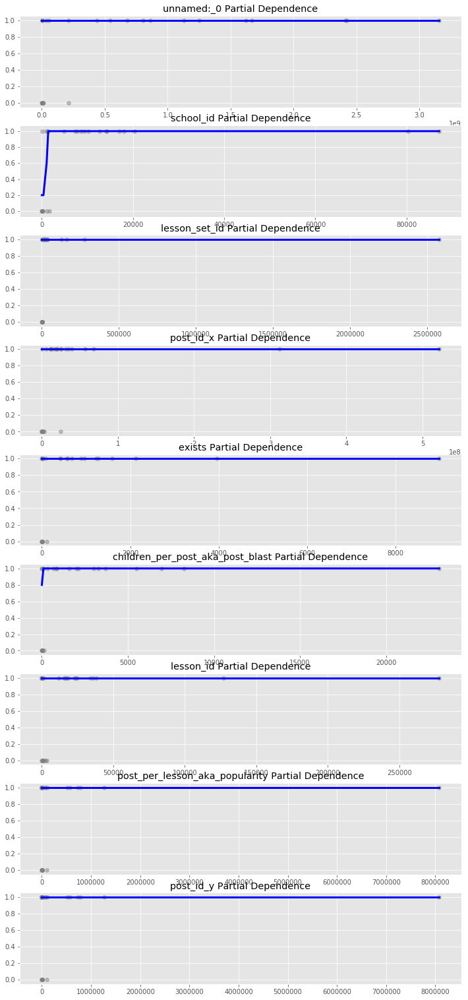

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 9.221059083938599
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.0037848949432373047


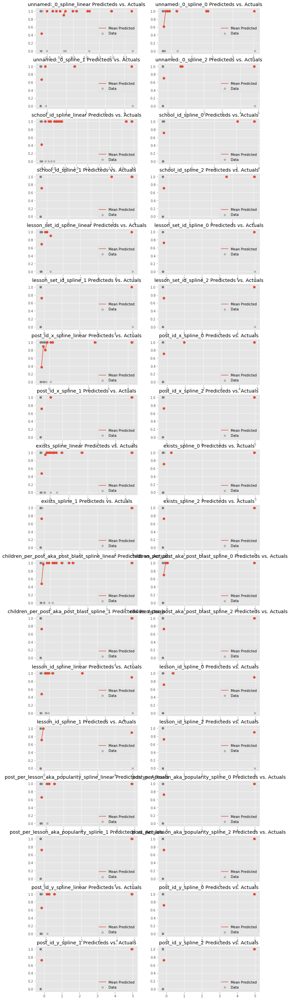

PLOT PREDICTEDS_VS_ACTUALS TIME: 6.039791107177734


/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:381: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  galgraphs.plot_residual_error(ax, df_X_sample.values[:,0].reshape(-1), y.reshape(-1), y_hat_sample.reshape(-1), s=30);


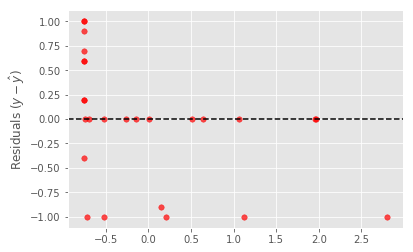

 67%|██████▋   | 4/6 [01:20<00:40, 20.14s/it]

PLOT RESIDUAL ERROR TIME: 0.19281506538391113
RF: MSE = 0.07192307692307692
GB: mean=-0.322323 std=0.285403
CV CALC TIME: 0.2187180519104004


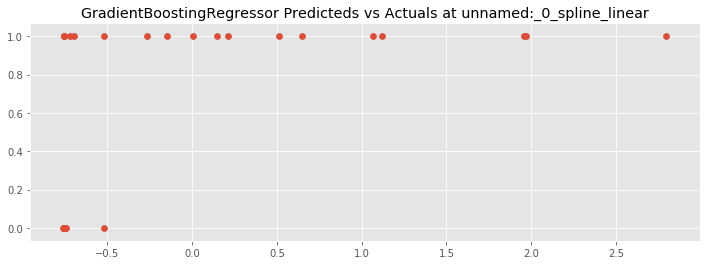

PLOT PREDICTED VS ACTUALS TIME: 0.22473692893981934
PLOT FEATURE IMPORTANCES TIME: 0.08995795249938965


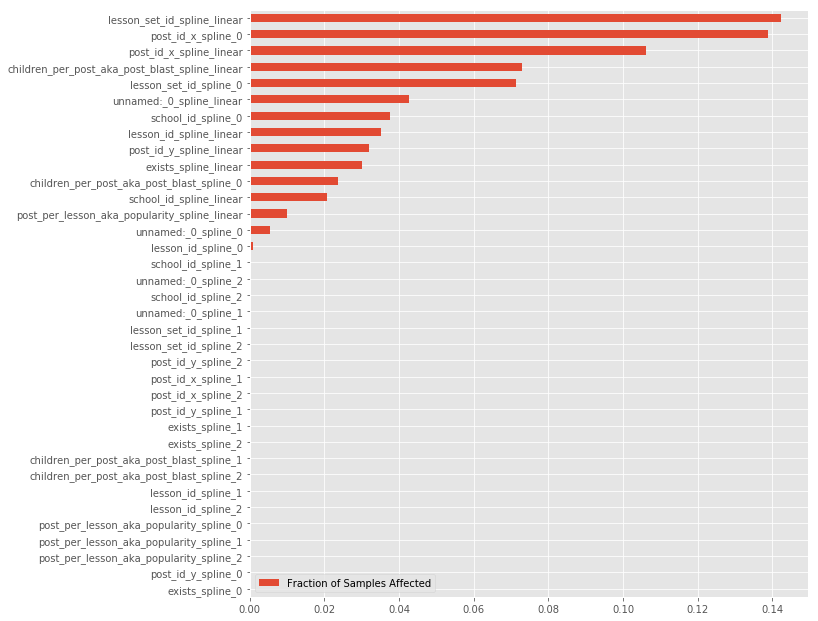

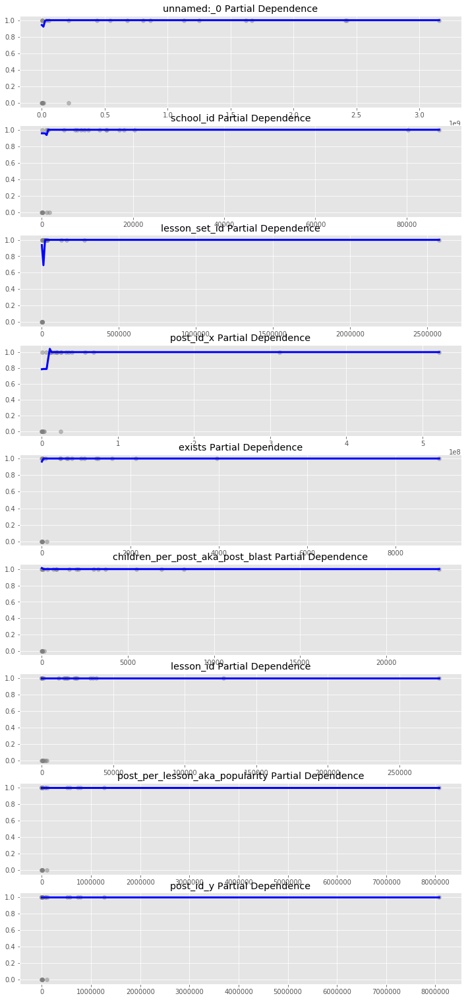

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 9.20561695098877
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.0030319690704345703


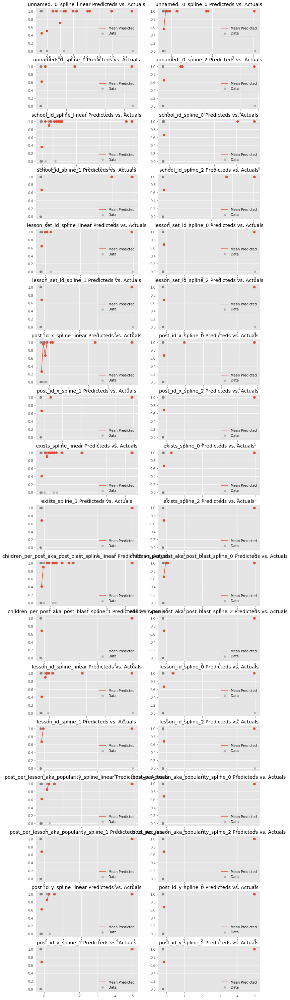

PLOT PREDICTEDS_VS_ACTUALS TIME: 5.921356201171875


/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:381: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  galgraphs.plot_residual_error(ax, df_X_sample.values[:,0].reshape(-1), y.reshape(-1), y_hat_sample.reshape(-1), s=30);


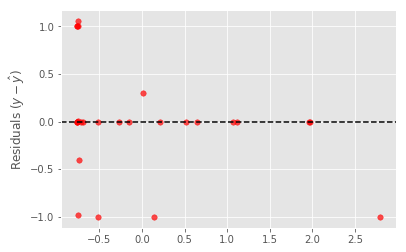

 83%|████████▎ | 5/6 [01:36<00:19, 19.32s/it]

PLOT RESIDUAL ERROR TIME: 0.17691755294799805
GB: MSE = 0.08955373427364374
GB: mean=-0.350000 std=0.292973
CV CALC TIME: 0.4314730167388916


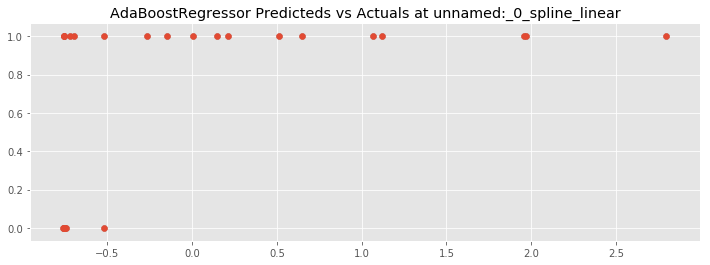

PLOT PREDICTED VS ACTUALS TIME: 0.22204208374023438
PLOT FEATURE IMPORTANCES TIME: 0.08406186103820801


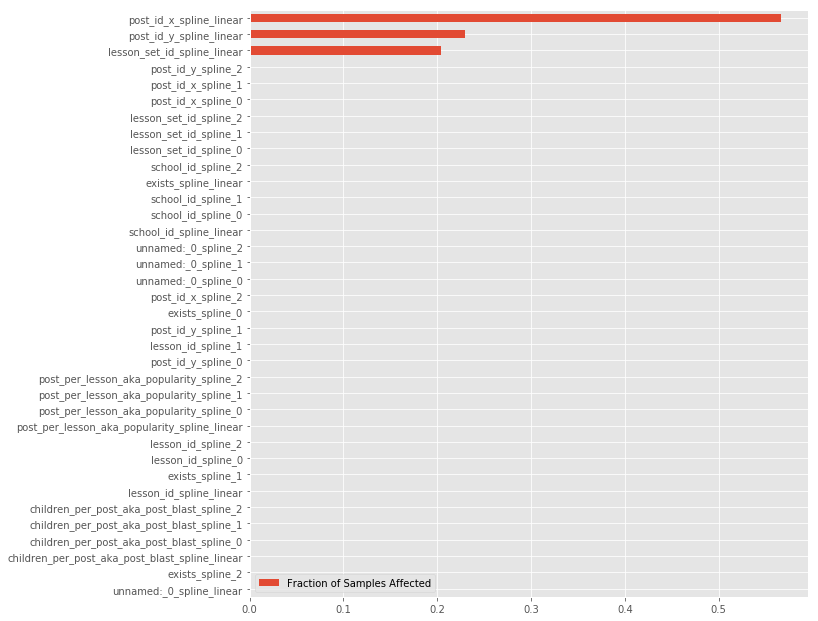

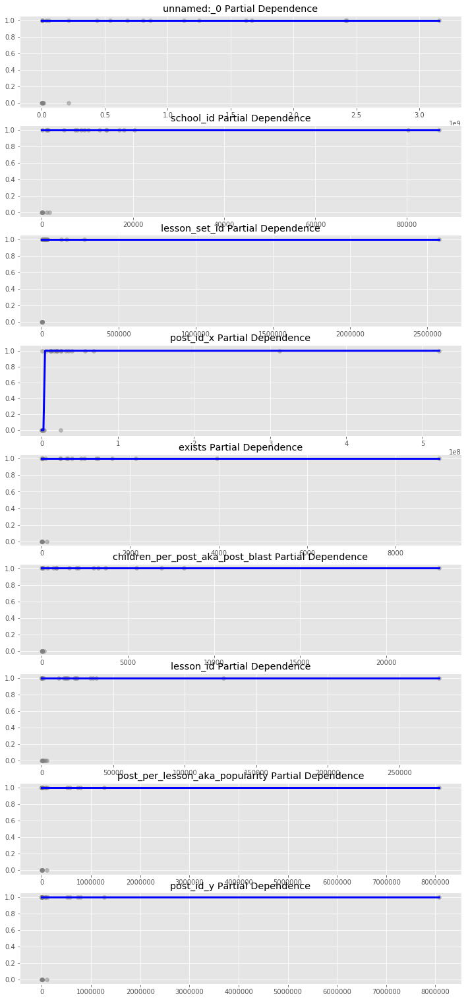

PLOT CONTINUOUS PARTIAL DEPENDENCIES TIME: 9.000914335250854
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.003004789352416992


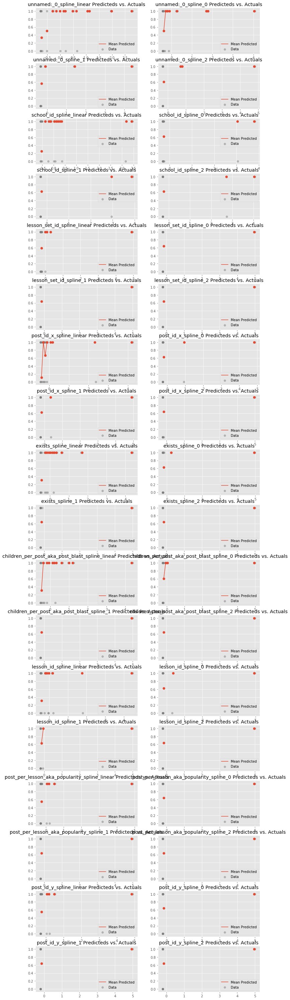

PLOT PREDICTEDS_VS_ACTUALS TIME: 6.074950933456421


/Users/macbookpro/Dropbox/Galvanize/autoregression/autoregression/autoregression.py:381: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  galgraphs.plot_residual_error(ax, df_X_sample.values[:,0].reshape(-1), y.reshape(-1), y_hat_sample.reshape(-1), s=30);


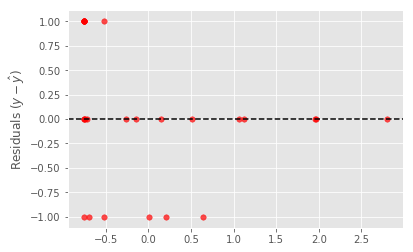

100%|██████████| 6/6 [01:52<00:00, 18.81s/it]

PLOT RESIDUAL ERROR TIME: 0.18544816970825195
GB: MSE = 0.038461538461538464


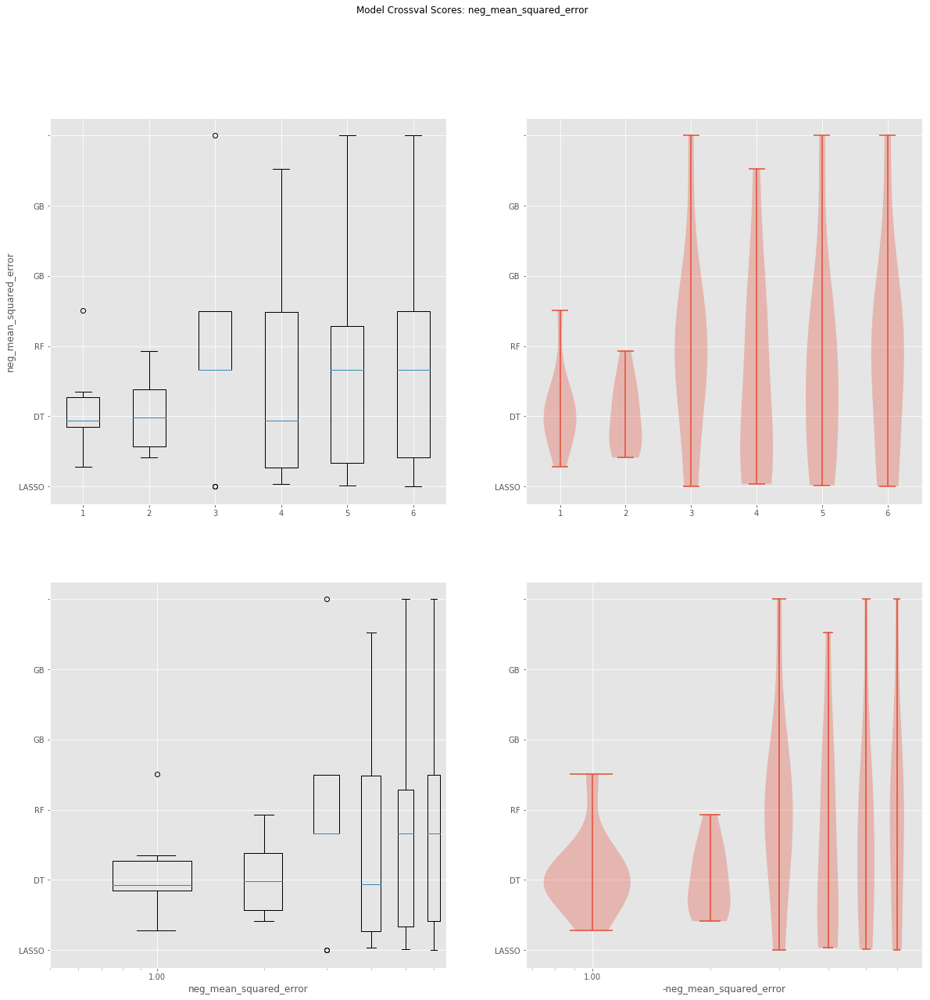

PLOT BAR AND VIOLIN TIME: 1.4569470882415771


In [49]:
names, results, models, pipeline = autoregression.compare_predictions(classrooms_sum_before_now, 'will_post_next_semester')

In [56]:
names, results, models, pipeline = _

ValueError: too many values to unpack (expected 4)

MAKE SUBSAMPLE TIME: 3.0994415283203125e-06
CLEAN_DF TIME: 0.013649940490722656


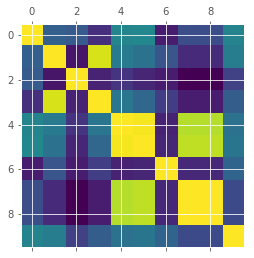

PLOT CORRELATION TIME: 0.158491849899292


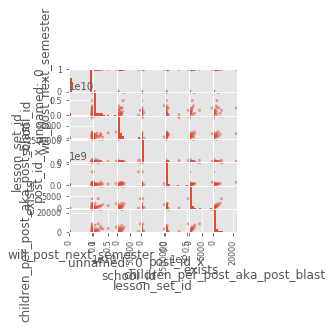

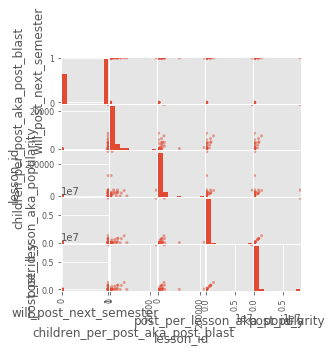

MAKE SCATTER TIME: 3.634323835372925

DF COLUMNS: 
['unnamed:_0', 'school_id', 'lesson_set_id', 'post_id_x', 'exists', 'children_per_post_aka_post_blast', 'lesson_id', 'post_per_lesson_aka_popularity', 'post_id_y', 'will_post_next_semester']



  0%|          | 0/8 [00:00<?, ?it/s]

DF COLUMNS AFTER TRANSFORM: 
['unnamed:_0_spline_linear', 'unnamed:_0_spline_0', 'unnamed:_0_spline_1', 'unnamed:_0_spline_2', 'school_id_spline_linear', 'school_id_spline_0', 'school_id_spline_1', 'school_id_spline_2', 'lesson_set_id_spline_linear', 'lesson_set_id_spline_0', 'lesson_set_id_spline_1', 'lesson_set_id_spline_2', 'post_id_x_spline_linear', 'post_id_x_spline_0', 'post_id_x_spline_1', 'post_id_x_spline_2', 'exists_spline_linear', 'exists_spline_0', 'exists_spline_1', 'exists_spline_2', 'children_per_post_aka_post_blast_spline_linear', 'children_per_post_aka_post_blast_spline_0', 'children_per_post_aka_post_blast_spline_1', 'children_per_post_aka_post_blast_spline_2', 'lesson_id_spline_linear', 'lesson_id_spline_0', 'lesson_id_spline_1', 'lesson_id_spline_2', 'post_per_lesson_aka_popularity_spline_linear', 'post_per_lesson_aka_popularity_spline_0', 'post_per_lesson_aka_popularity_spline_1', 'post_per_lesson_aka_popularity_spline_2', 'post_id_y_spline_linear', 'post_id_y_spli

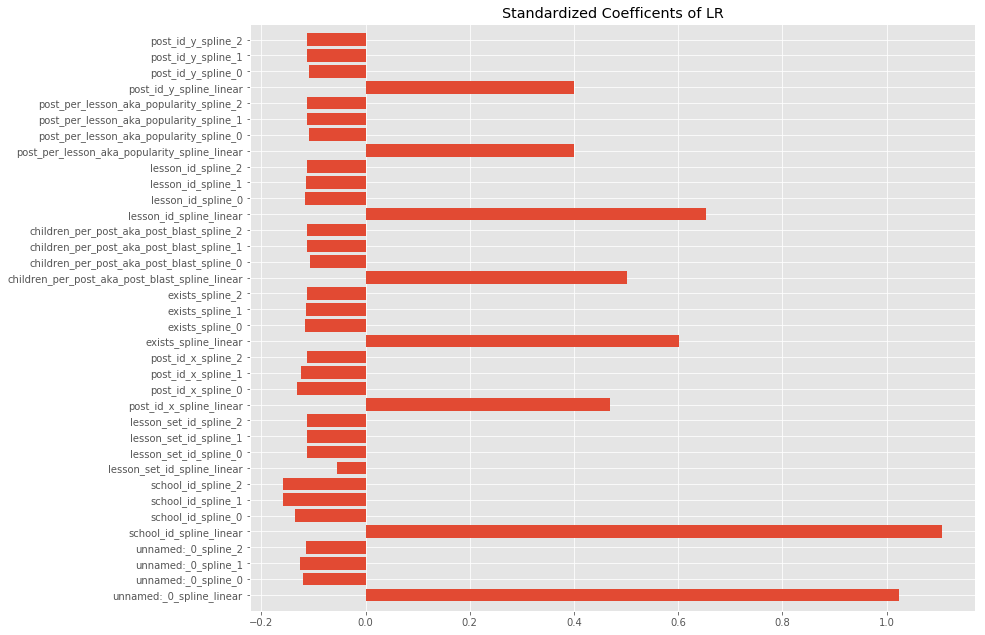

PLOT COEFFICIANTS TIME: 0.8196251392364502


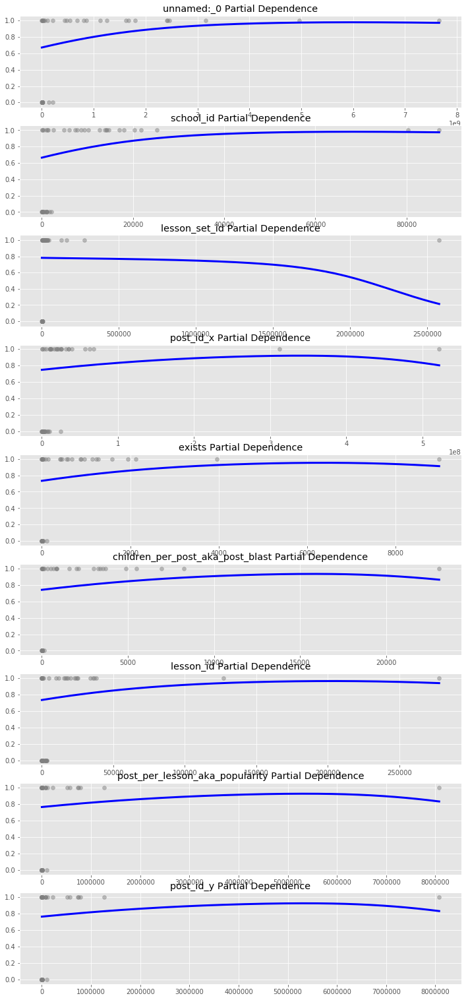

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 12%|█▎        | 1/8 [00:13<01:37, 13.88s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 12.986199140548706
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.008064031600952148
LR: MSE = 0.16279069767441862
LDA: mean=0.630000 std=0.210000
CV CALC TIME: 0.03890419006347656
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are

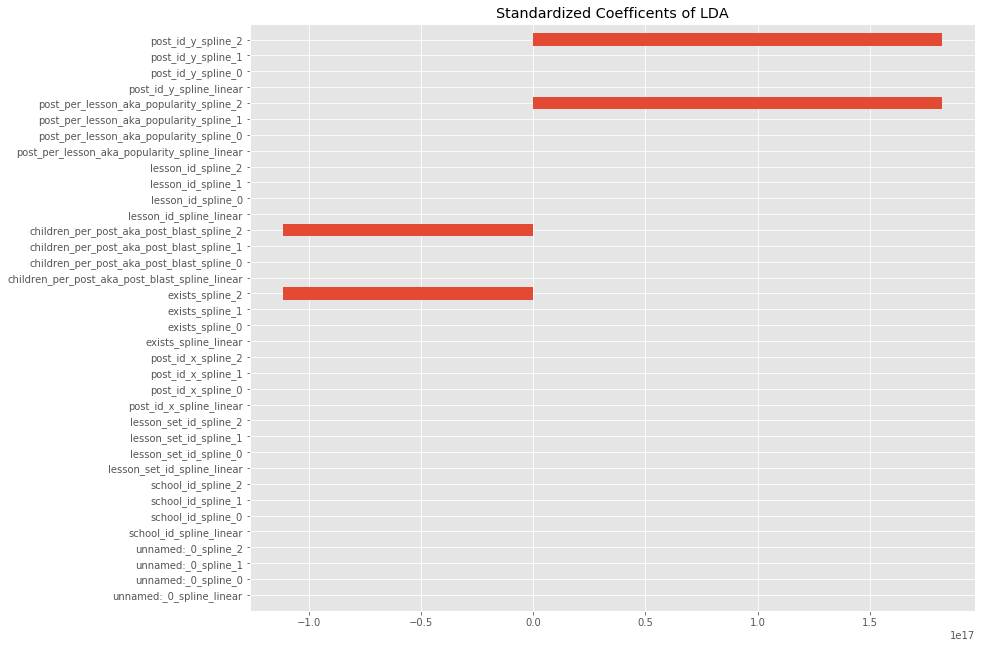

PLOT COEFFICIANTS TIME: 0.7407748699188232


/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:510: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)


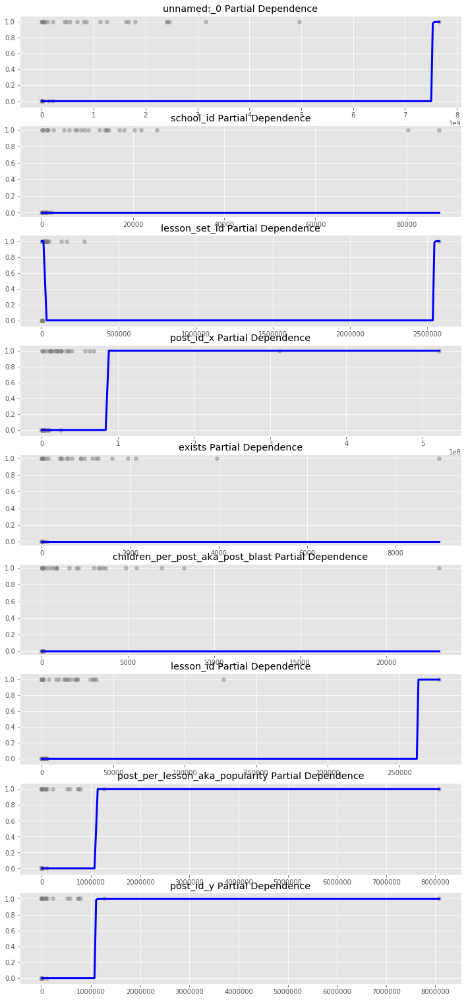

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 25%|██▌       | 2/8 [00:25<01:15, 12.62s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 10.552433013916016
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.003142118453979492
LDA: MSE = 0.20930232558139536
LC: mean=0.555000 std=0.227431
CV CALC TIME: 0.0382230281829834
PLOT PREDICTED VS ACTUALS TIME: 2.1457672119140625e-06


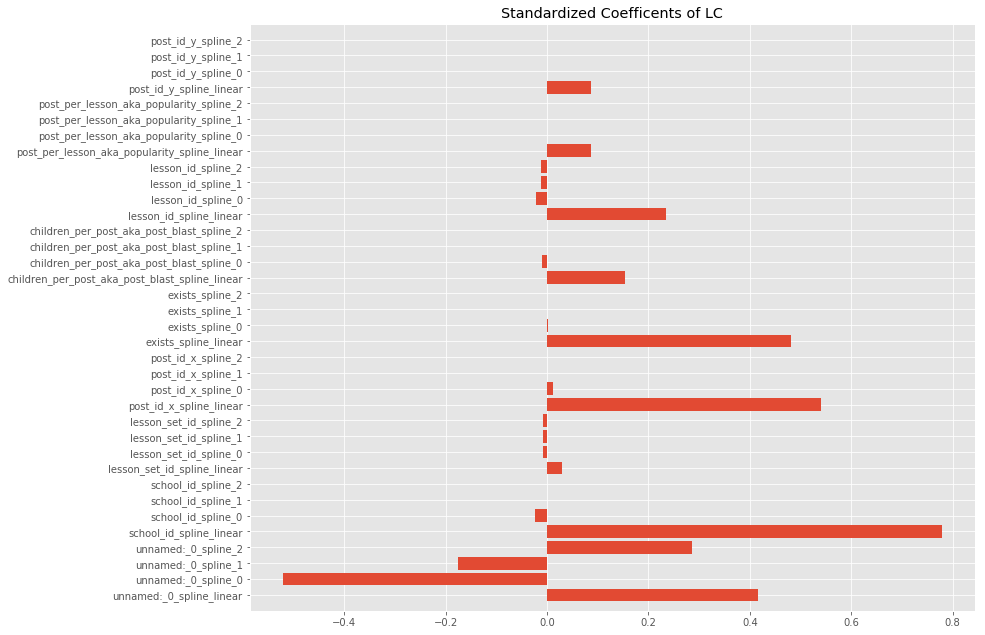

PLOT COEFFICIANTS TIME: 0.7282297611236572


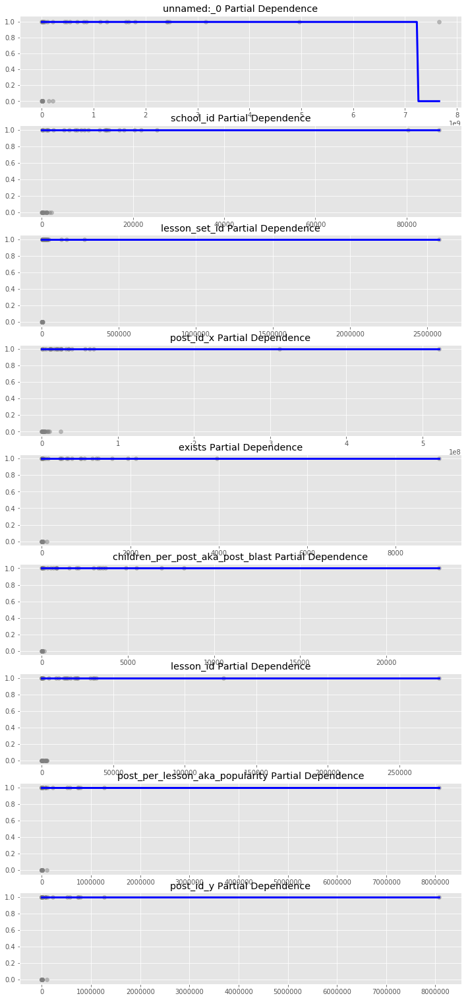

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 38%|███▊      | 3/8 [00:36<01:01, 12.30s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 10.835265159606934
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.004952907562255859
LC: MSE = 0.13953488372093023
KNN: mean=0.775000 std=0.207666
CV CALC TIME: 0.026633262634277344
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


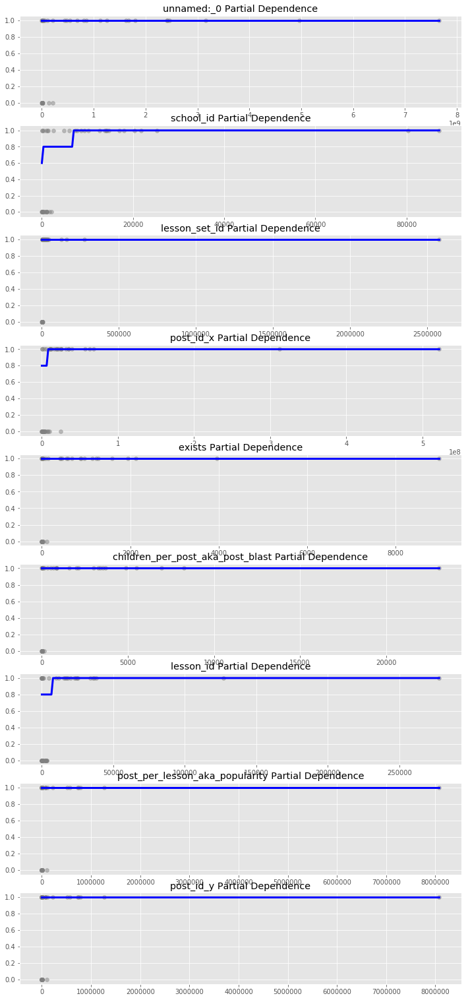

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 50%|█████     | 4/8 [00:46<00:46, 11.55s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 9.247739791870117
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.0030069351196289062
KNN: MSE = 0.16279069767441862
DT: mean=0.745000 std=0.152398
CV CALC TIME: 0.01857900619506836
PLOT PREDICTED VS ACTUALS TIME: 0.0


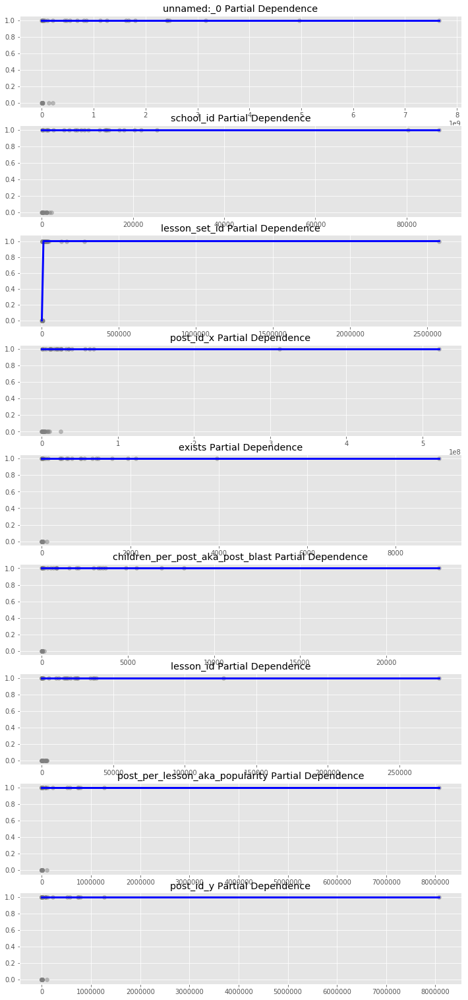

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 62%|██████▎   | 5/8 [00:56<00:33, 11.23s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 9.903840065002441
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.003515005111694336
DT: MSE = 0.09302325581395349
RF: mean=0.760000 std=0.159374
CV CALC TIME: 0.18152999877929688
PLOT PREDICTED VS ACTUALS TIME: 0.0


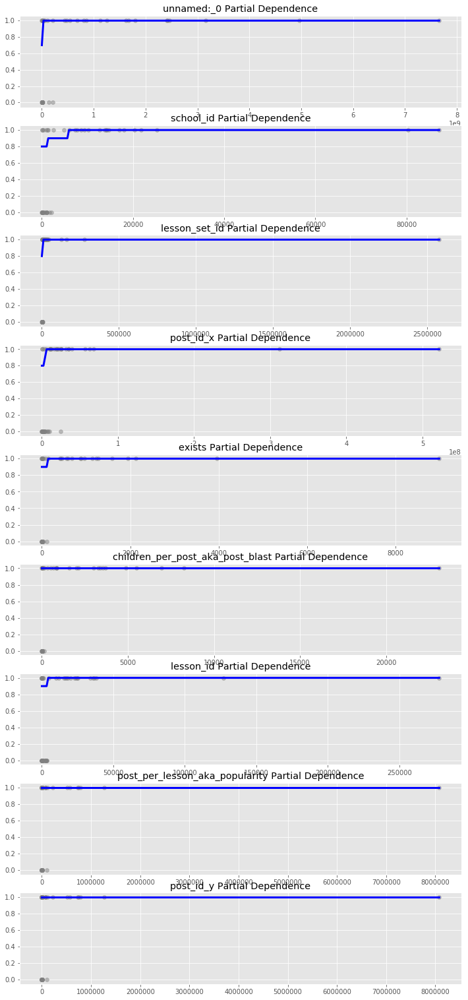

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 75%|███████▌  | 6/8 [01:06<00:22, 11.12s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 10.2099609375
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.0032608509063720703
RF: MSE = 0.09302325581395349
GB: mean=0.760000 std=0.159374
CV CALC TIME: 0.5876820087432861
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


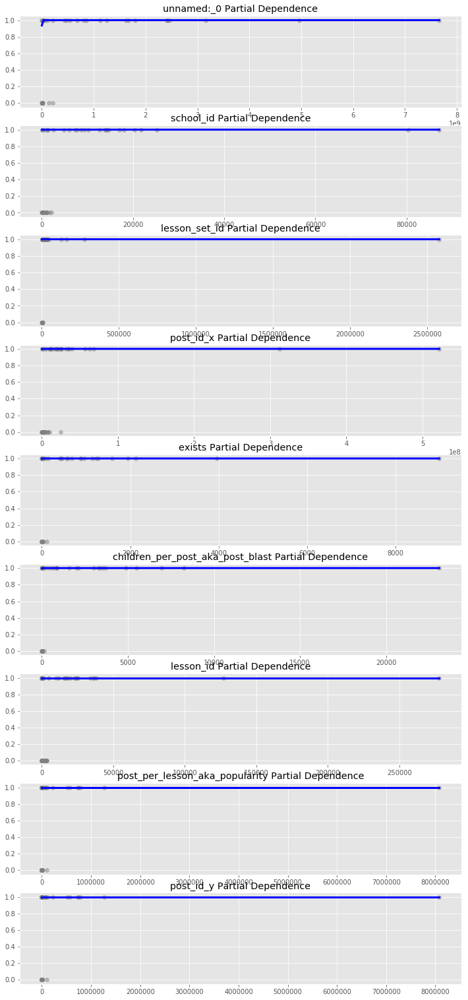

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 88%|████████▊ | 7/8 [01:16<00:10, 10.98s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 9.05069899559021
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.0029680728912353516
GB: MSE = 0.06976744186046512
DT: mean=0.690000 std=0.168523
CV CALC TIME: 0.870070219039917
PLOT PREDICTED VS ACTUALS TIME: 1.1920928955078125e-06


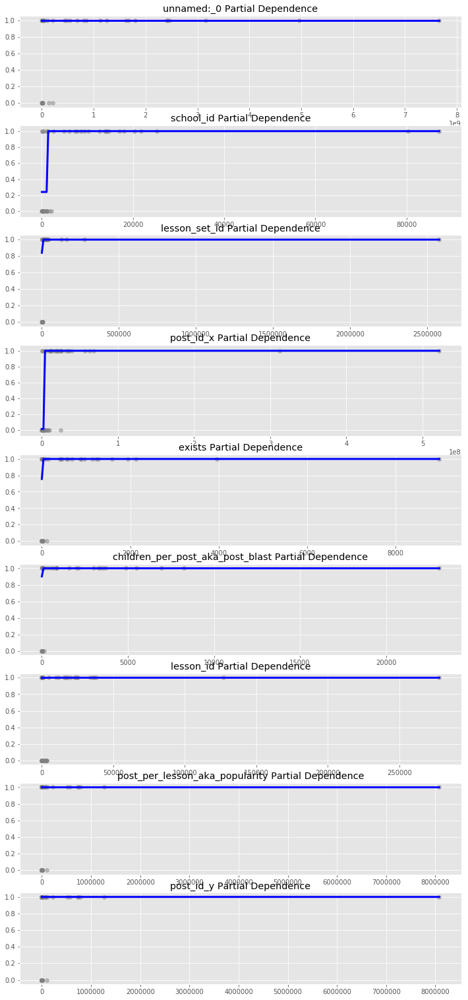

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
100%|██████████| 8/8 [01:28<00:00, 11.06s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 9.829677820205688
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.0097808837890625
DT: MSE = 0.11627906976744186


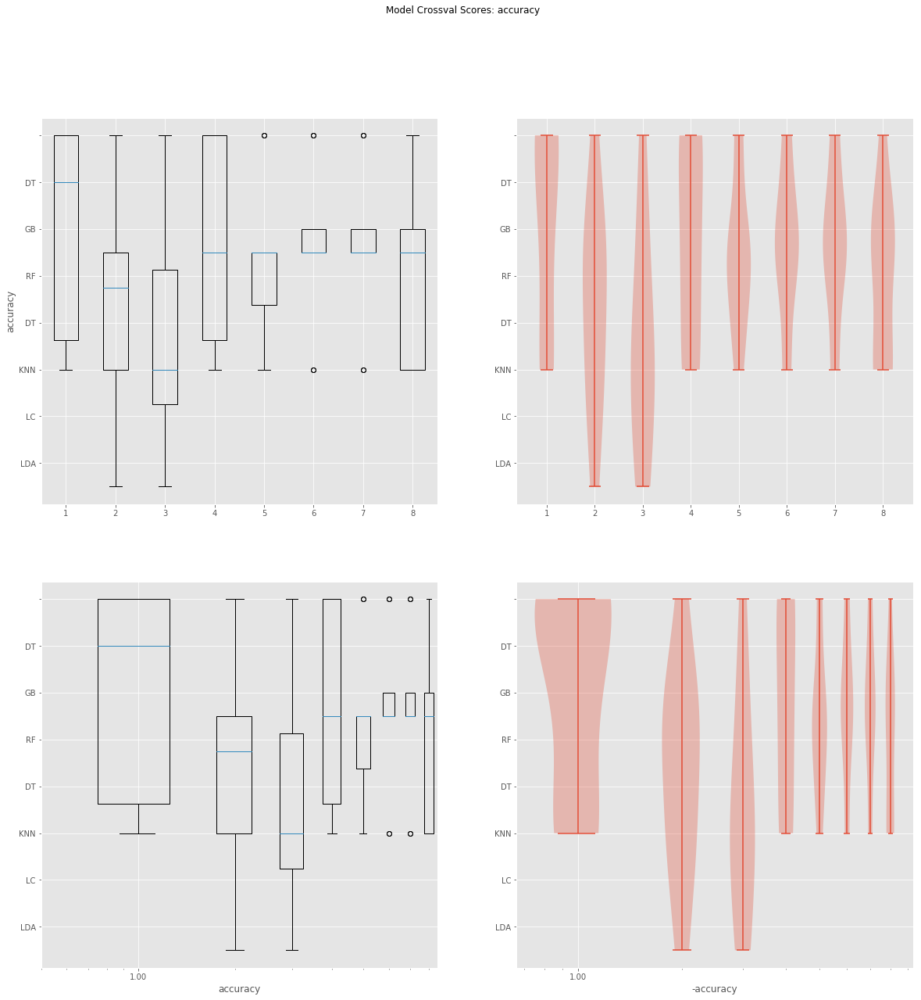

PLOT BAR AND VIOLIN TIME: 1.7882490158081055


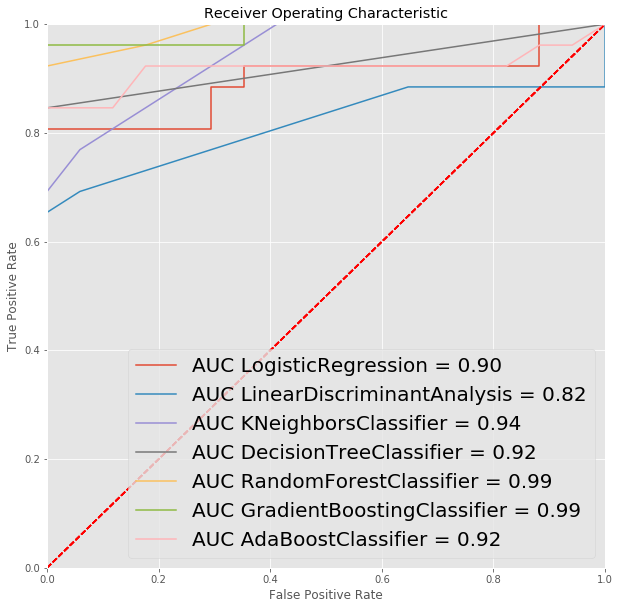

PLOT ROC TIME: 0.5024127960205078


In [137]:
import autoregression
names, results, models, pipeline = autoregression.compare_predictions(classrooms_sum_before_now, 'will_post_next_semester')

MAKE SUBSAMPLE TIME: 1.3113021850585938e-05
CLEAN_DF TIME: 0.010437965393066406


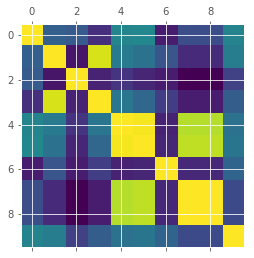

PLOT CORRELATION TIME: 0.1638798713684082


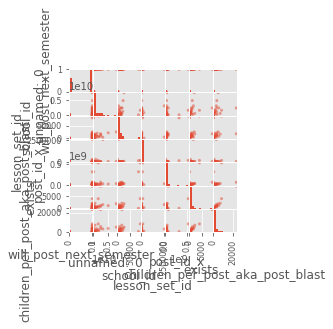

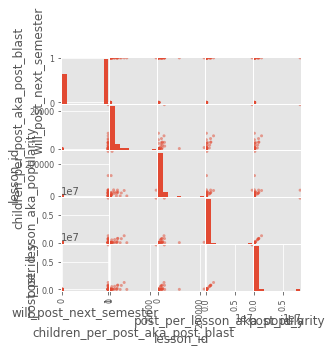

  0%|          | 0/8 [00:00<?, ?it/s]

MAKE SCATTER TIME: 3.094393014907837

DF COLUMNS: 
['unnamed:_0', 'school_id', 'lesson_set_id', 'post_id_x', 'exists', 'children_per_post_aka_post_blast', 'lesson_id', 'post_per_lesson_aka_popularity', 'post_id_y', 'will_post_next_semester']

DF COLUMNS AFTER TRANSFORM: 
['unnamed:_0_spline_linear', 'unnamed:_0_spline_0', 'unnamed:_0_spline_1', 'unnamed:_0_spline_2', 'school_id_spline_linear', 'school_id_spline_0', 'school_id_spline_1', 'school_id_spline_2', 'lesson_set_id_spline_linear', 'lesson_set_id_spline_0', 'lesson_set_id_spline_1', 'lesson_set_id_spline_2', 'post_id_x_spline_linear', 'post_id_x_spline_0', 'post_id_x_spline_1', 'post_id_x_spline_2', 'exists_spline_linear', 'exists_spline_0', 'exists_spline_1', 'exists_spline_2', 'children_per_post_aka_post_blast_spline_linear', 'children_per_post_aka_post_blast_spline_0', 'children_per_post_aka_post_blast_spline_1', 'children_per_post_aka_post_blast_spline_2', 'lesson_id_spline_linear', 'lesson_id_spline_0', 'lesson_id_spline_1'

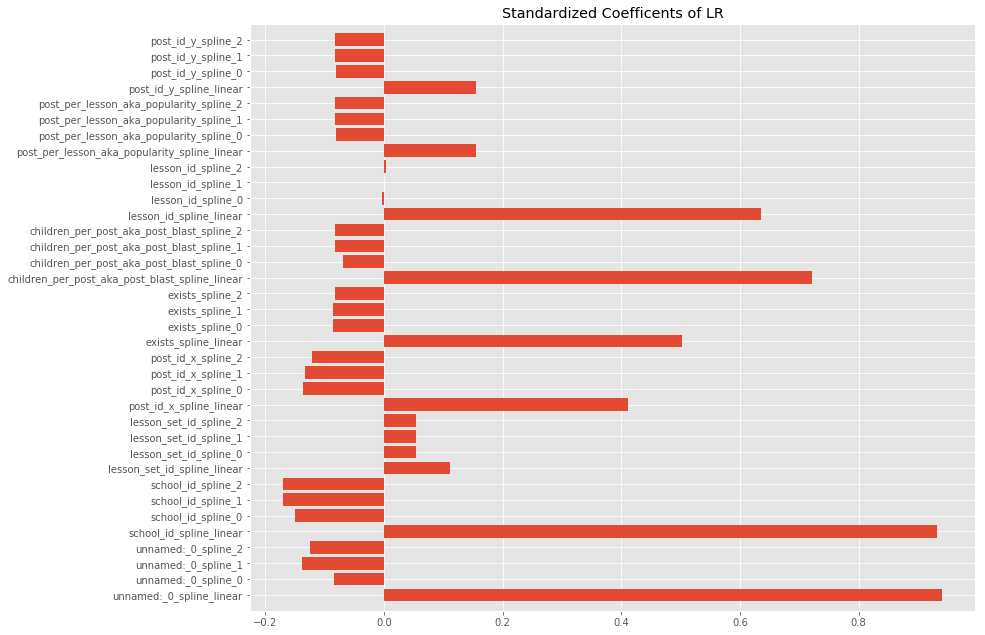

PLOT COEFFICIANTS TIME: 0.6939380168914795


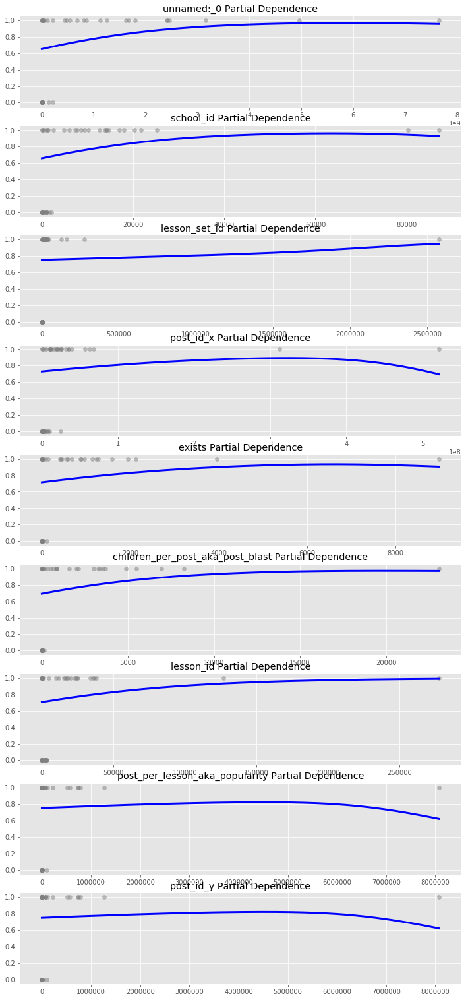

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 12%|█▎        | 1/8 [00:10<01:14, 10.71s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 9.968464136123657
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.008059024810791016
LR: MSE = 0.13953488372093023
LDA: mean=0.630000 std=0.210000
CV CALC TIME: 0.028530359268188477
PLOT PREDICTED VS ACTUALS TIME: 0.0


/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are

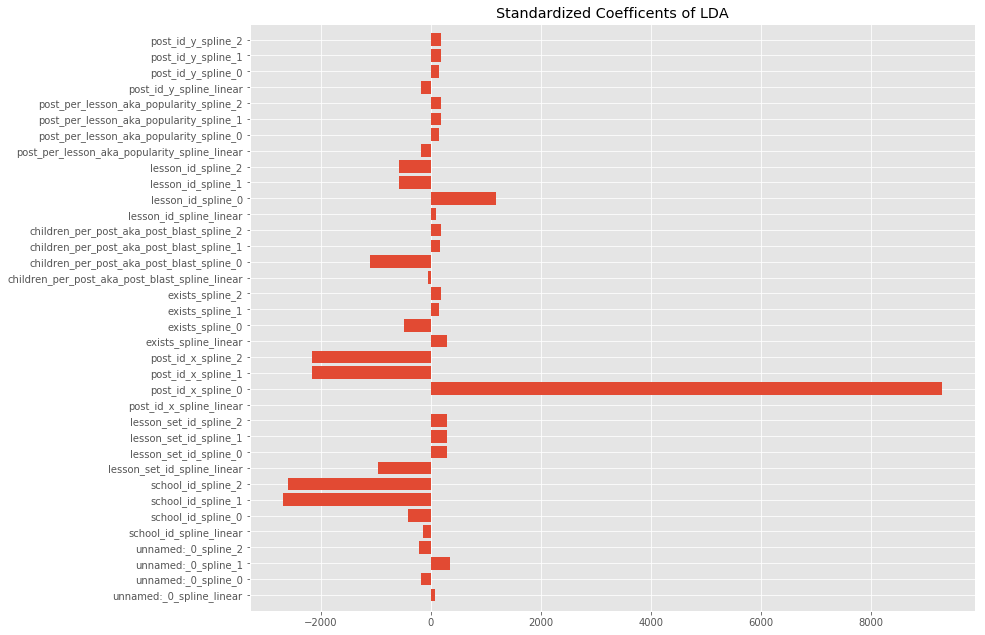

PLOT COEFFICIANTS TIME: 0.9713101387023926


/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:510: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)


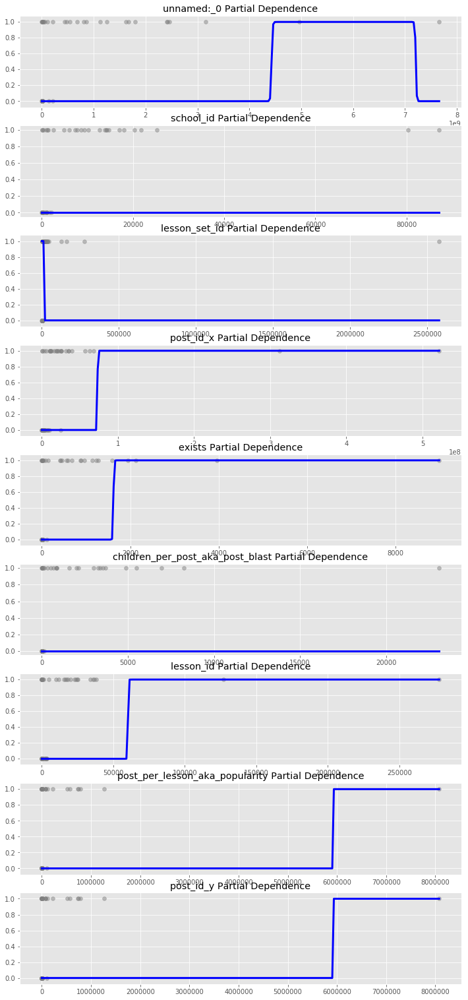

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 25%|██▌       | 2/8 [00:22<01:08, 11.35s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 10.947474956512451
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.003854036331176758
LDA: MSE = 0.23255813953488372
LC: mean=0.555000 std=0.227431
CV CALC TIME: 0.04639410972595215
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


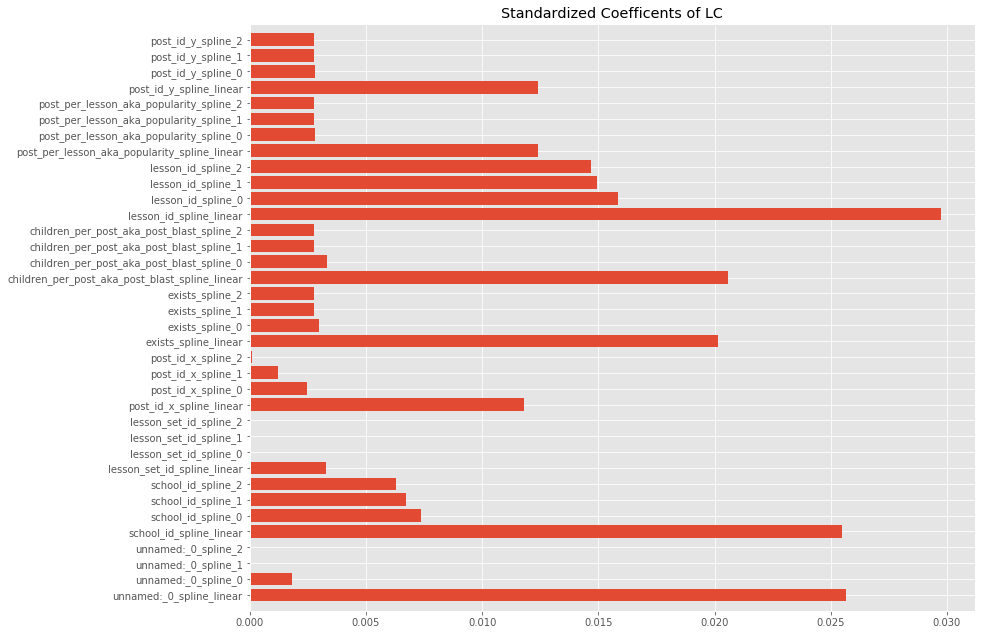

PLOT COEFFICIANTS TIME: 0.8826100826263428


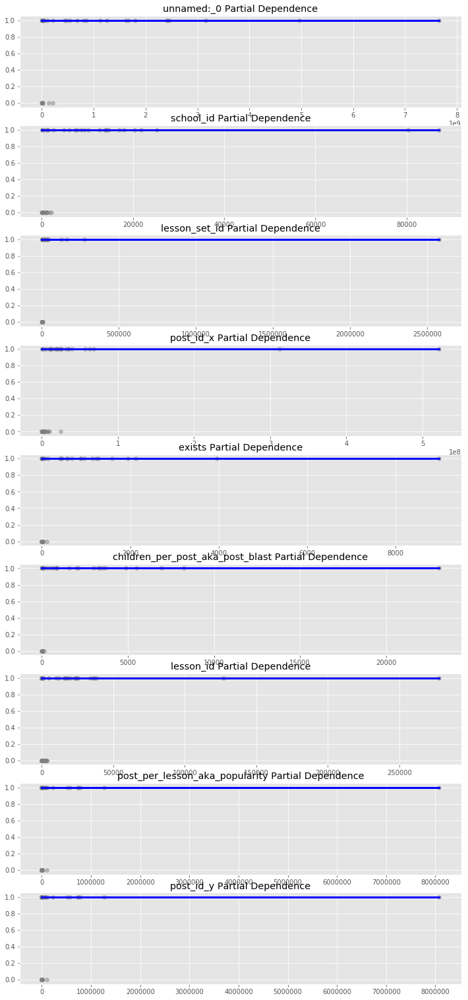

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 38%|███▊      | 3/8 [00:34<00:57, 11.43s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 10.624638080596924
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.0033588409423828125
LC: MSE = 0.3953488372093023
KNN: mean=0.775000 std=0.207666
CV CALC TIME: 0.02543497085571289
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


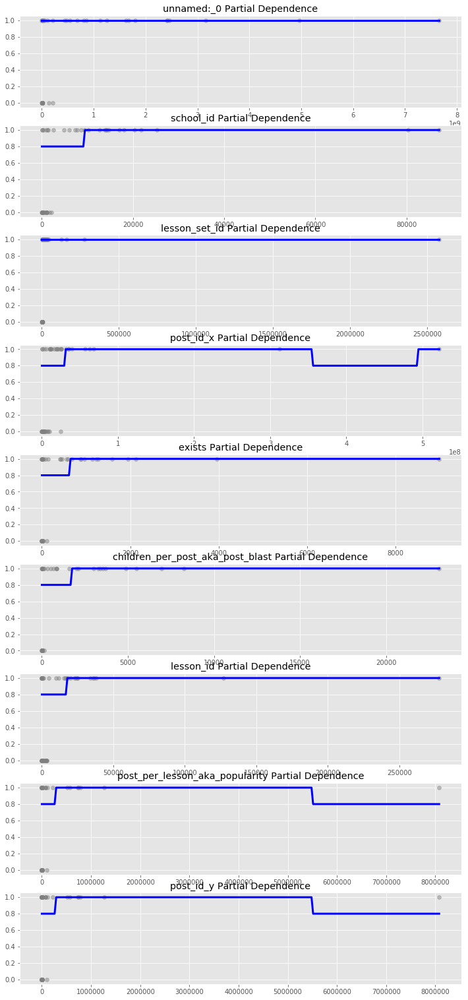

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 50%|█████     | 4/8 [00:43<00:43, 10.90s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 9.257107973098755
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.004242897033691406
KNN: MSE = 0.16279069767441862
DT: mean=0.695000 std=0.157242
CV CALC TIME: 0.018358945846557617
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


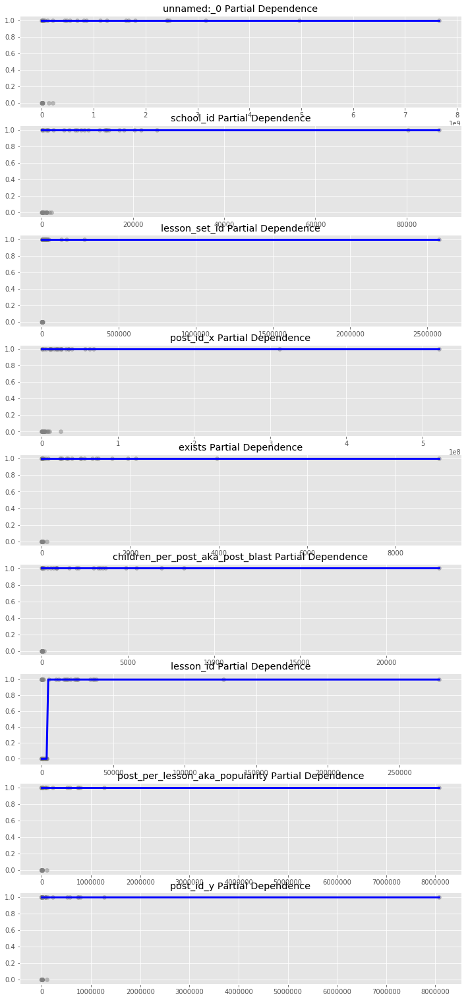

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 62%|██████▎   | 5/8 [00:52<00:31, 10.54s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 9.08000373840332
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.0035369396209716797
DT: MSE = 0.11627906976744186
RF: mean=0.735000 std=0.177553
CV CALC TIME: 0.17754602432250977
PLOT PREDICTED VS ACTUALS TIME: 0.0


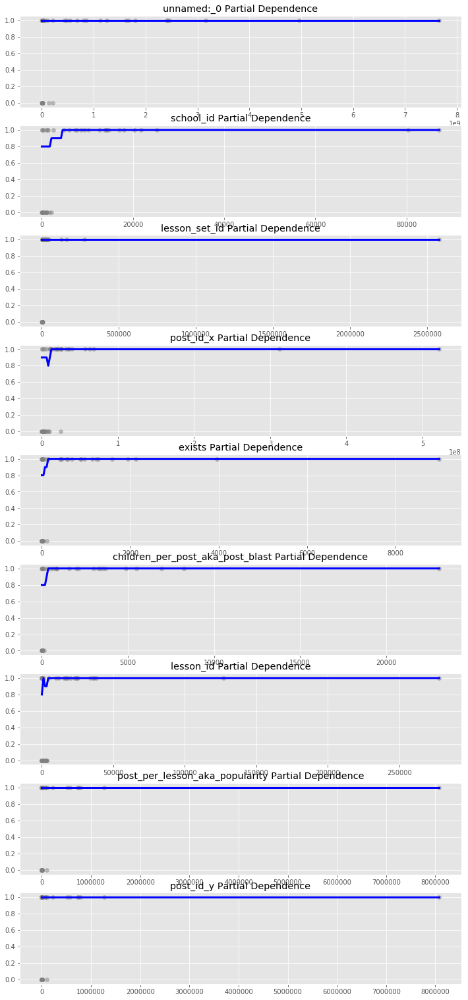

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 75%|███████▌  | 6/8 [01:02<00:20, 10.39s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 9.23060917854309
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.007834196090698242
RF: MSE = 0.13953488372093023
GB: mean=0.735000 std=0.209821
CV CALC TIME: 0.5946822166442871
PLOT PREDICTED VS ACTUALS TIME: 0.0


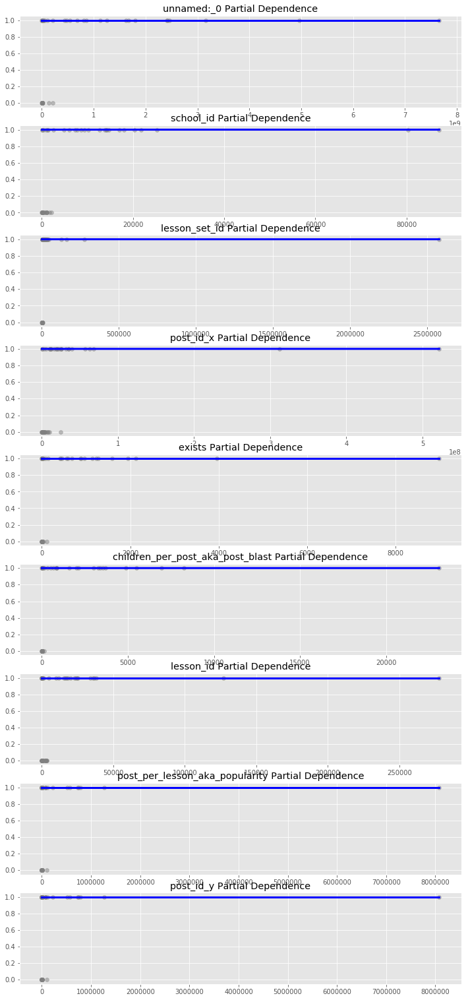

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 88%|████████▊ | 7/8 [01:12<00:10, 10.36s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 9.075999021530151
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.0038809776306152344
GB: MSE = 0.13953488372093023
DT: mean=0.690000 std=0.168523
CV CALC TIME: 0.8567919731140137
PLOT PREDICTED VS ACTUALS TIME: 1.1920928955078125e-06


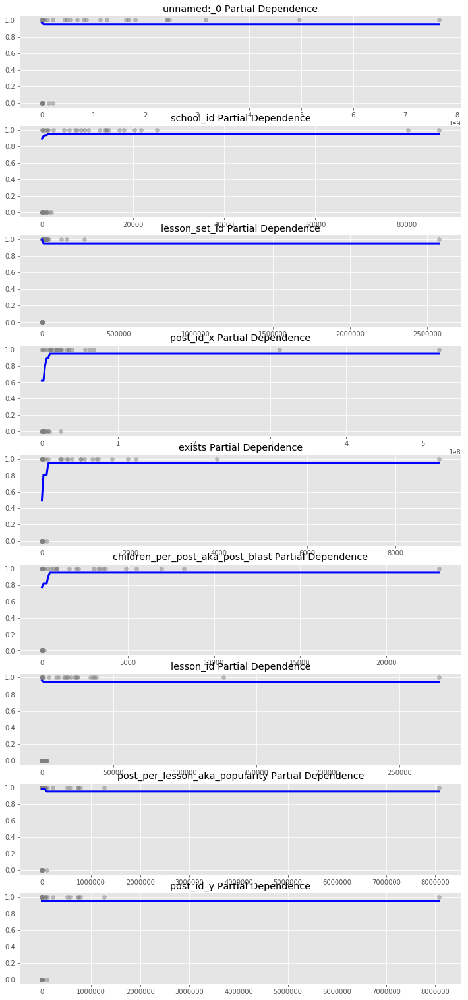

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
100%|██████████| 8/8 [01:24<00:00, 10.50s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 9.809864044189453
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.002977609634399414
DT: MSE = 0.06976744186046512


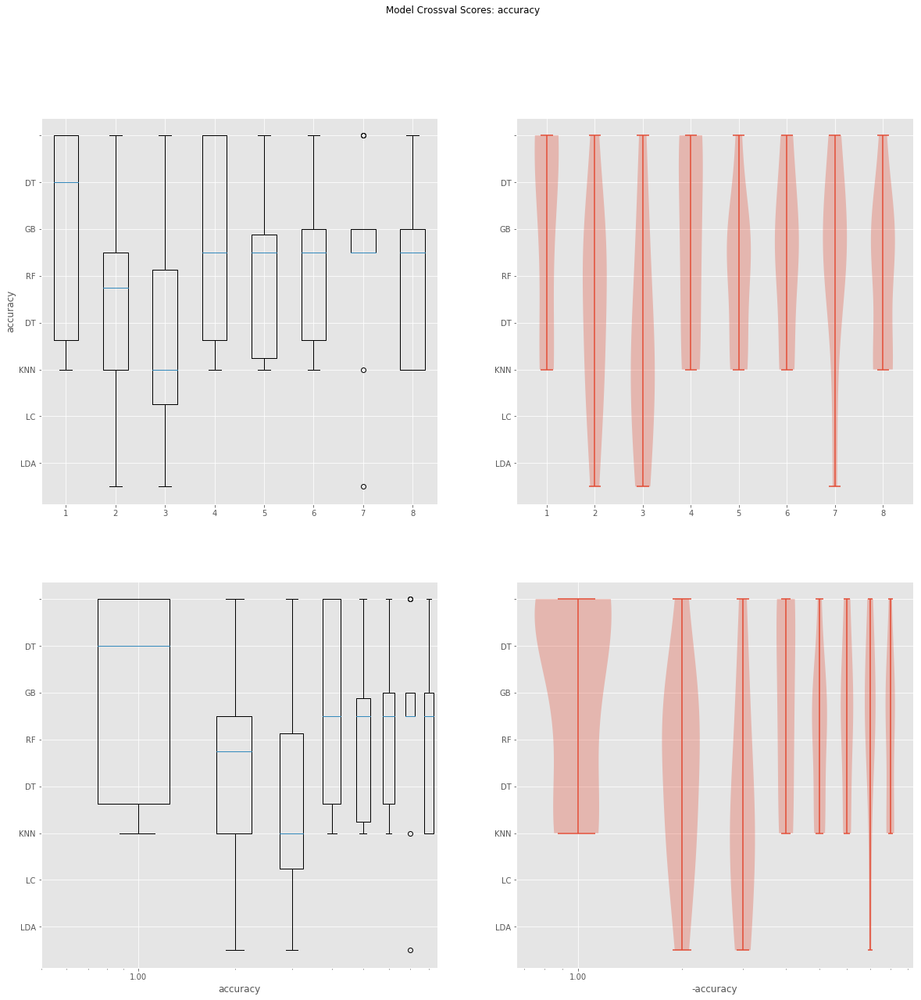

PLOT BAR AND VIOLIN TIME: 1.8167259693145752


/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:510: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)


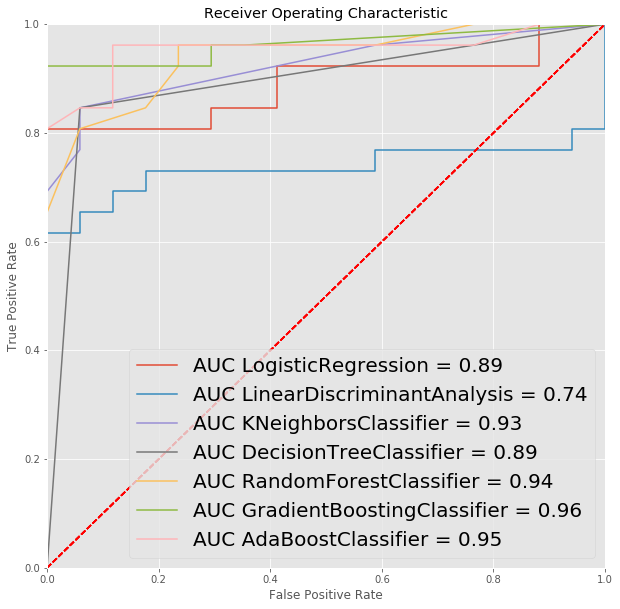

PLOT ROC TIME: 0.5068120956420898


In [101]:
import autoregression
names, results, models, pipeline = autoregression.compare_predictions(classrooms_sum_before_now, 'will_post_next_semester')

MAKE SUBSAMPLE TIME: 1.4066696166992188e-05
CLEAN_DF TIME: 0.02045297622680664


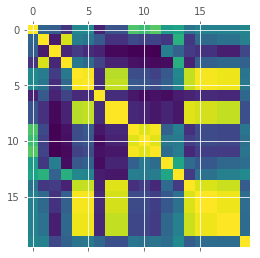

PLOT CORRELATION TIME: 0.13921427726745605


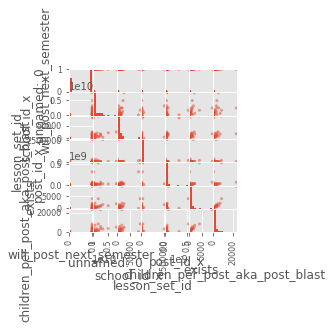

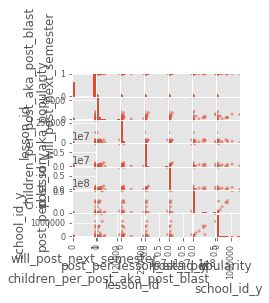

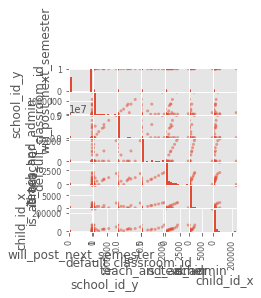

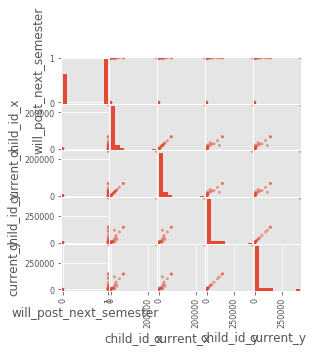

MAKE SCATTER TIME: 7.401943922042847

DF COLUMNS: 
['unnamed:_0', 'school_id_x', 'lesson_set_id', 'post_id_x', 'exists', 'children_per_post_aka_post_blast', 'lesson_id', 'post_per_lesson_aka_popularity', 'post_id_y', 'id', 'school_id_y', 'default_classroom_id', 'teach_and_admin', 'is_teacher', 'is_admin', 'child_id_x', 'current_x', 'child_id_y', 'current_y', 'will_post_next_semester']



  0%|          | 0/8 [00:00<?, ?it/s]

DF COLUMNS AFTER TRANSFORM: 
['unnamed:_0_spline_linear', 'unnamed:_0_spline_0', 'unnamed:_0_spline_1', 'unnamed:_0_spline_2', 'school_id_x_spline_linear', 'school_id_x_spline_0', 'school_id_x_spline_1', 'school_id_x_spline_2', 'lesson_set_id_spline_linear', 'lesson_set_id_spline_0', 'lesson_set_id_spline_1', 'lesson_set_id_spline_2', 'post_id_x_spline_linear', 'post_id_x_spline_0', 'post_id_x_spline_1', 'post_id_x_spline_2', 'exists_spline_linear', 'exists_spline_0', 'exists_spline_1', 'exists_spline_2', 'children_per_post_aka_post_blast_spline_linear', 'children_per_post_aka_post_blast_spline_0', 'children_per_post_aka_post_blast_spline_1', 'children_per_post_aka_post_blast_spline_2', 'lesson_id_spline_linear', 'lesson_id_spline_0', 'lesson_id_spline_1', 'lesson_id_spline_2', 'post_per_lesson_aka_popularity_spline_linear', 'post_per_lesson_aka_popularity_spline_0', 'post_per_lesson_aka_popularity_spline_1', 'post_per_lesson_aka_popularity_spline_2', 'post_id_y_spline_linear', 'post_i

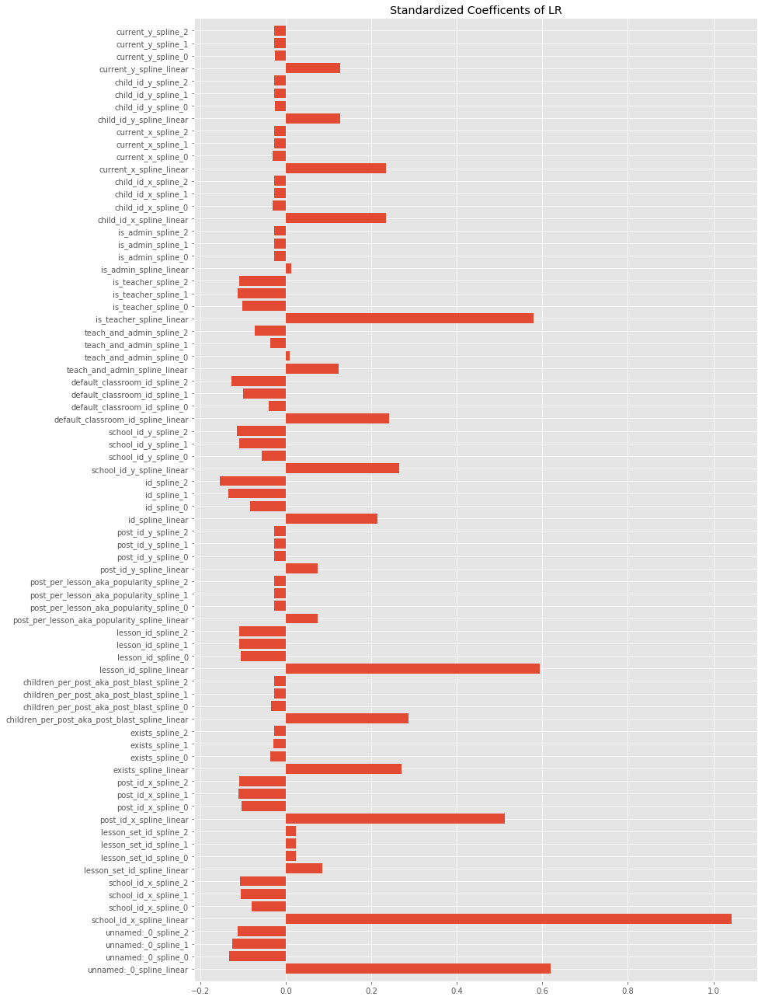

PLOT COEFFICIANTS TIME: 2.060955047607422


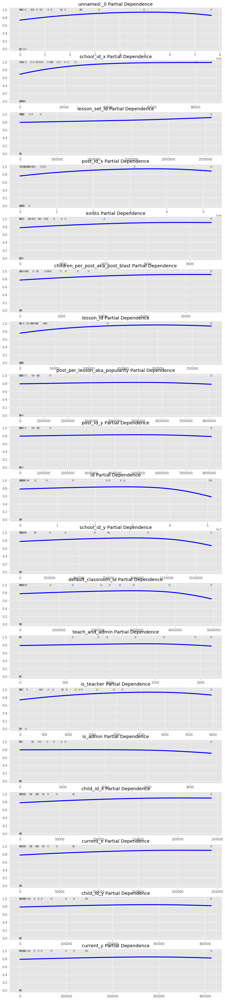

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 12%|█▎        | 1/8 [00:47<05:30, 47.26s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 44.979698181152344
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.021044015884399414
LR: MSE = 0.16279069767441862
LDA: mean=0.595000 std=0.288487
CV CALC TIME: 0.045639991760253906
PLOT PREDICTED VS ACTUALS TIME: 7.152557373046875e-07


/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are

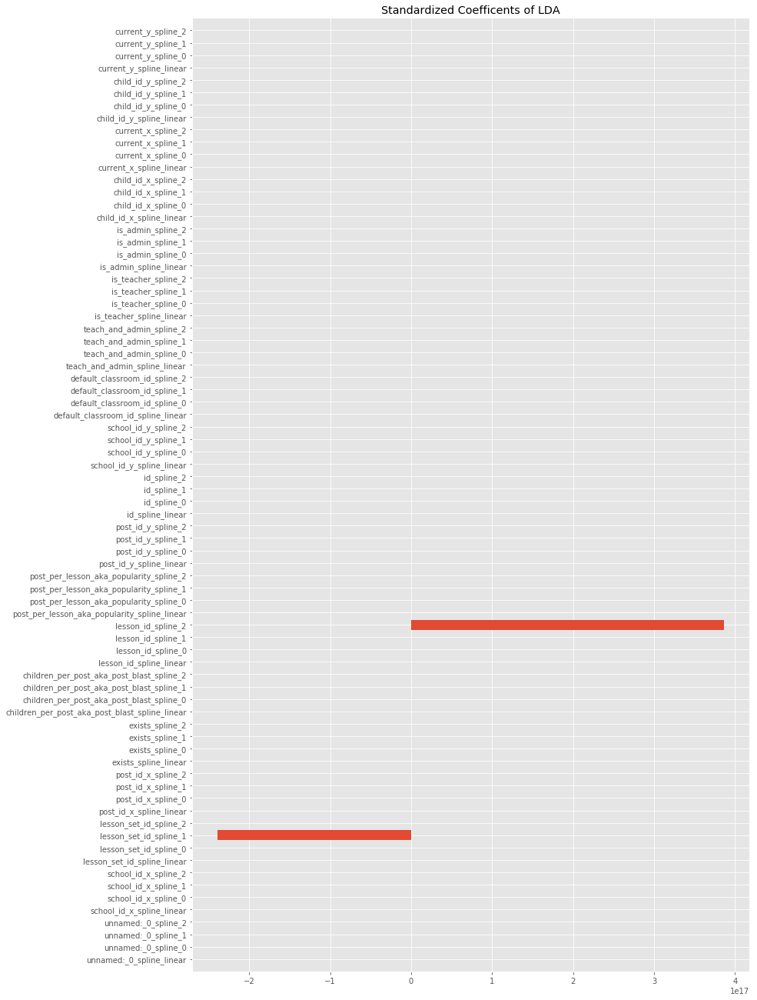

PLOT COEFFICIANTS TIME: 2.407881259918213


/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:510: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)


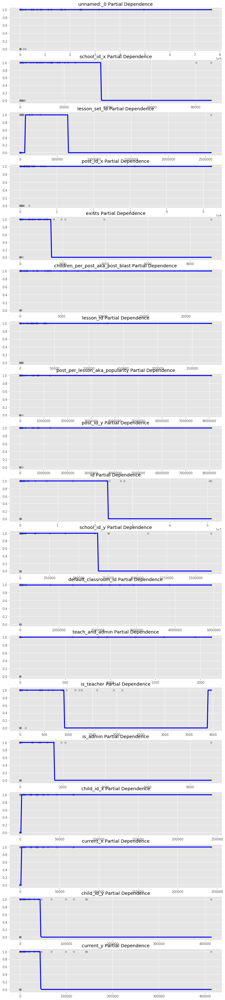

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 25%|██▌       | 2/8 [01:33<04:39, 46.55s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 43.312840938568115
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.01702404022216797
LDA: MSE = 0.3488372093023256
LC: mean=0.550000 std=0.222486
CV CALC TIME: 0.16806292533874512
PLOT PREDICTED VS ACTUALS TIME: 1.6689300537109375e-06


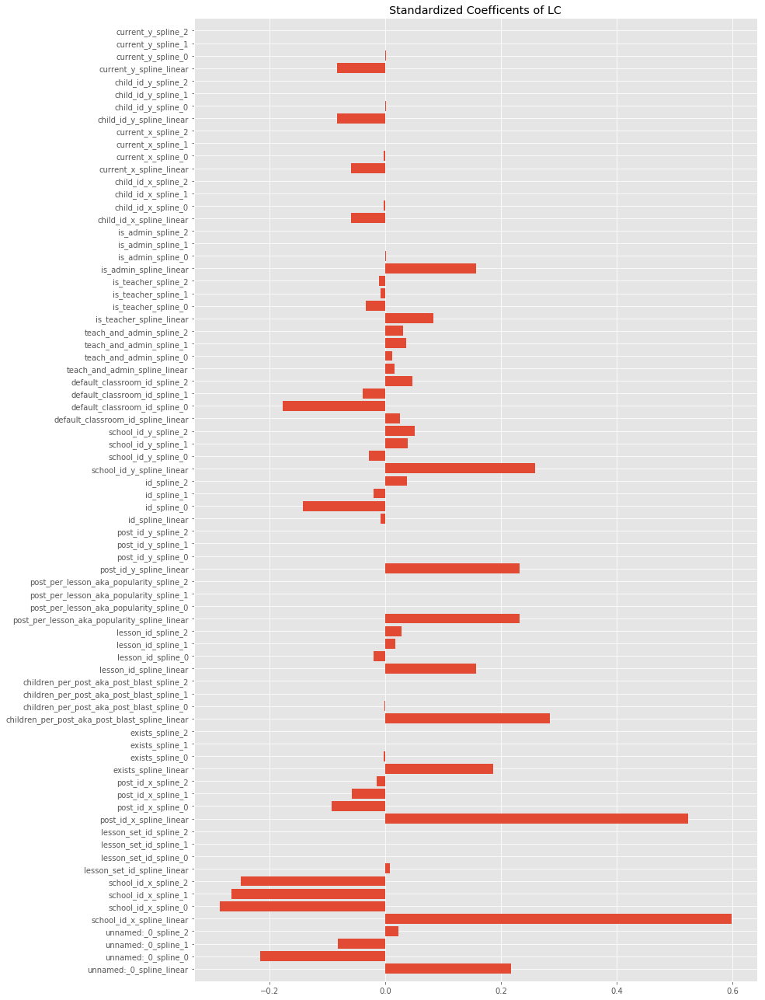

PLOT COEFFICIANTS TIME: 2.242594003677368


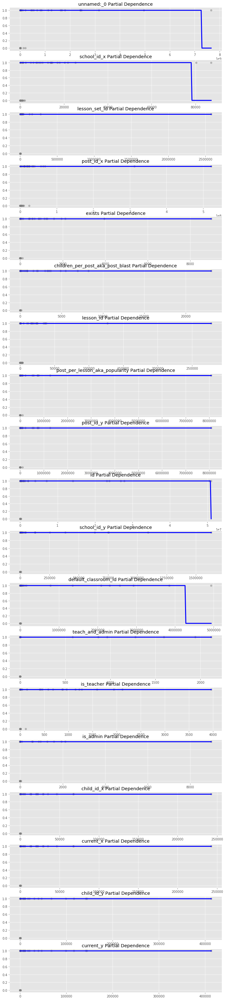

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 38%|███▊      | 3/8 [02:18<03:50, 46.07s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 42.583351135253906
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.007870912551879883
LC: MSE = 0.13953488372093023
KNN: mean=0.730000 std=0.208806
CV CALC TIME: 0.02413487434387207
PLOT PREDICTED VS ACTUALS TIME: 1.1920928955078125e-06


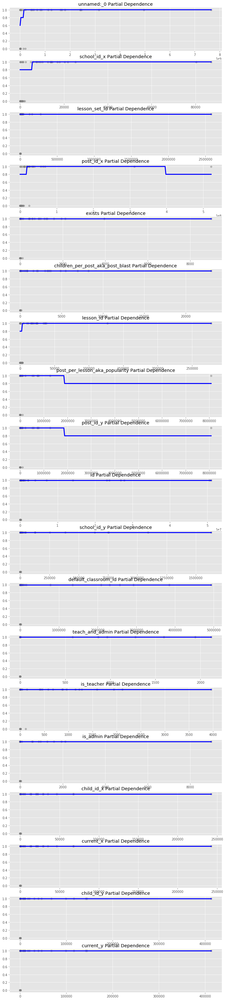

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 50%|█████     | 4/8 [02:57<02:57, 44.26s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 38.79674696922302
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.00619816780090332
KNN: MSE = 0.20930232558139536
DT: mean=0.685000 std=0.200062
CV CALC TIME: 0.01856374740600586
PLOT PREDICTED VS ACTUALS TIME: 1.1920928955078125e-06


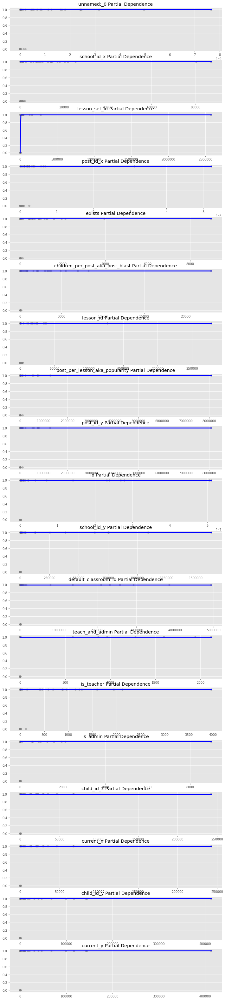

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 62%|██████▎   | 5/8 [03:36<02:10, 43.39s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 39.8407518863678
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.006509065628051758
DT: MSE = 0.09302325581395349
RF: mean=0.650000 std=0.146629
CV CALC TIME: 0.18237805366516113
PLOT PREDICTED VS ACTUALS TIME: 0.0


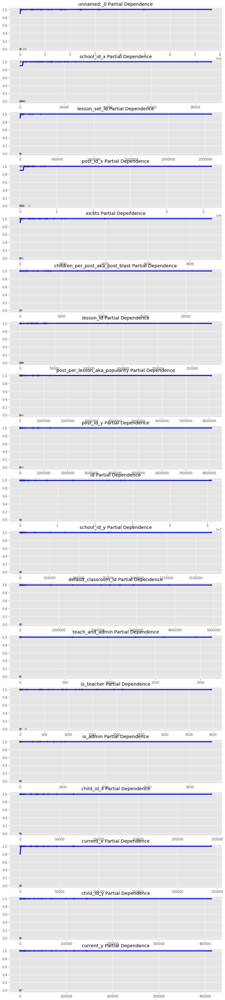

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 75%|███████▌  | 6/8 [04:24<01:28, 44.11s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 47.349063873291016
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.011404037475585938
RF: MSE = 0.09302325581395349
GB: mean=0.785000 std=0.134257
CV CALC TIME: 0.6936461925506592
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


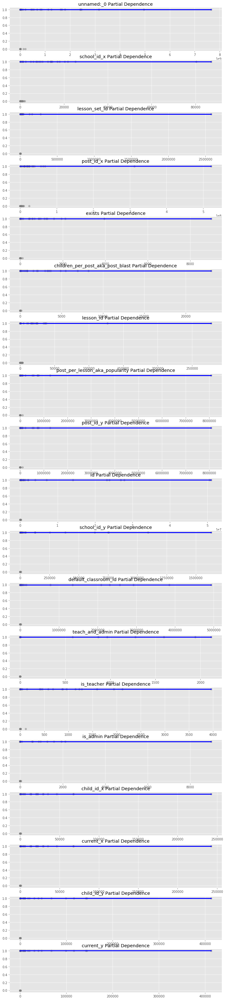

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 88%|████████▊ | 7/8 [05:05<00:43, 43.65s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 39.632232904434204
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.01254582405090332
GB: MSE = 0.11627906976744186
DT: mean=0.620000 std=0.172047
CV CALC TIME: 0.9080886840820312
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


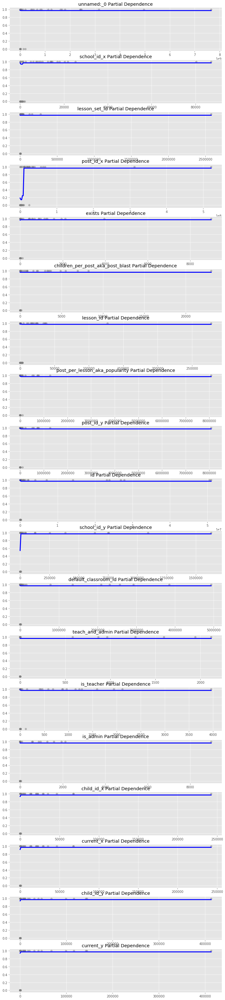

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
100%|██████████| 8/8 [05:47<00:00, 43.43s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 40.033350229263306
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.007483243942260742
DT: MSE = 0.09302325581395349


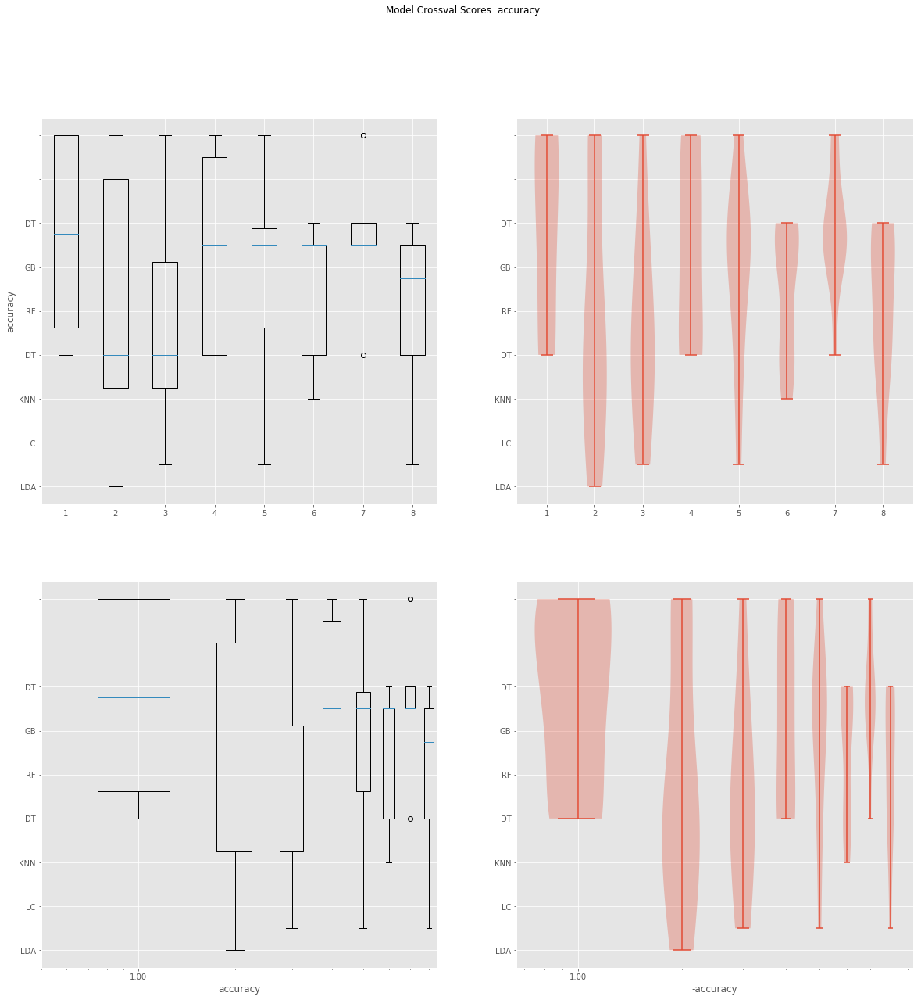

PLOT BAR AND VIOLIN TIME: 2.3374478816986084


/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:510: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)


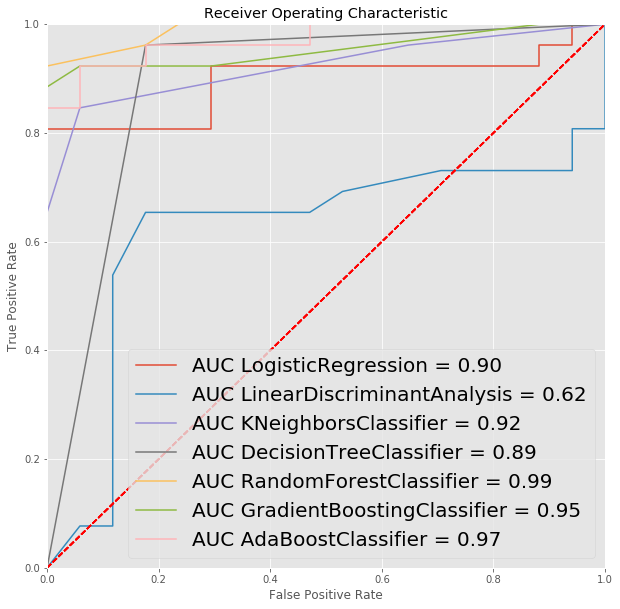

PLOT ROC TIME: 0.5799441337585449


'percent_data' NOT SPECIFIED AND len(df)=(3643)
                  IS > 1000: TAKING A RANDOM %10 OF THE SAMPLE
MAKE SUBSAMPLE TIME: 0.003206968307495117
CLEAN_DF TIME: 0.017061948776245117


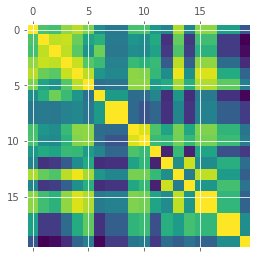

PLOT CORRELATION TIME: 0.3932211399078369


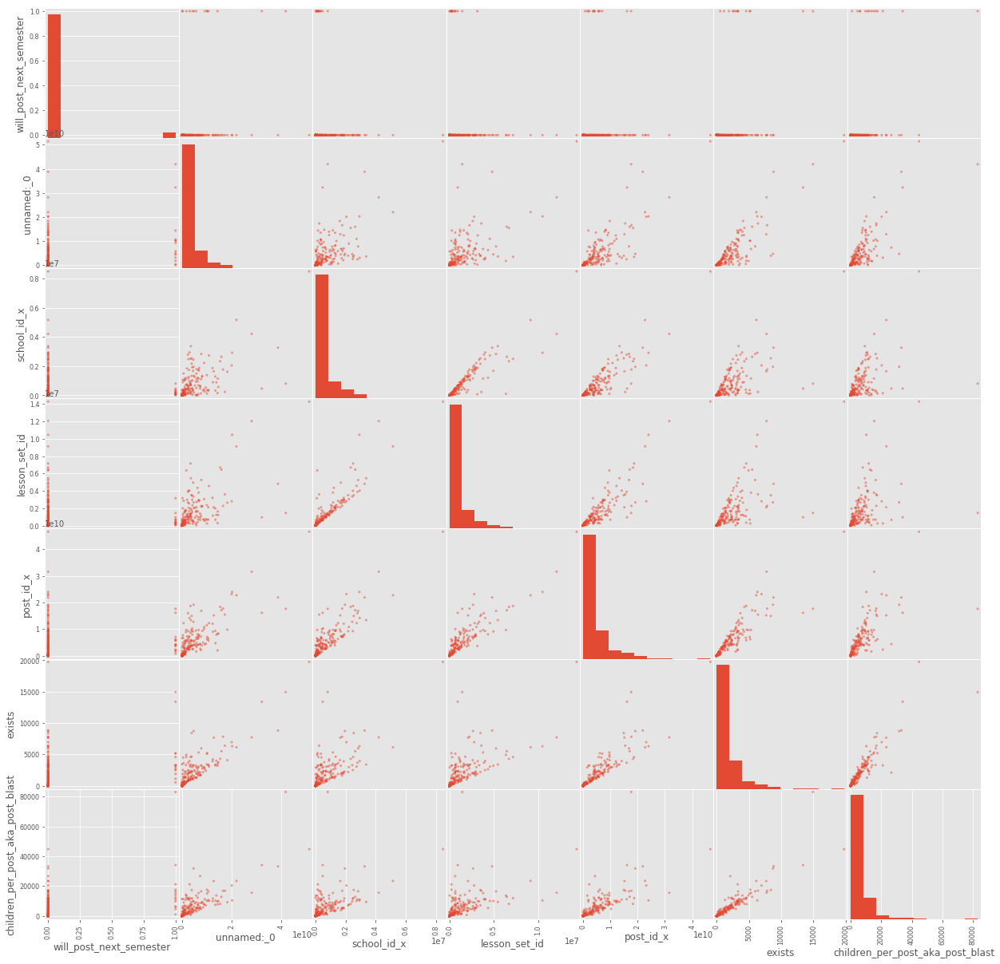

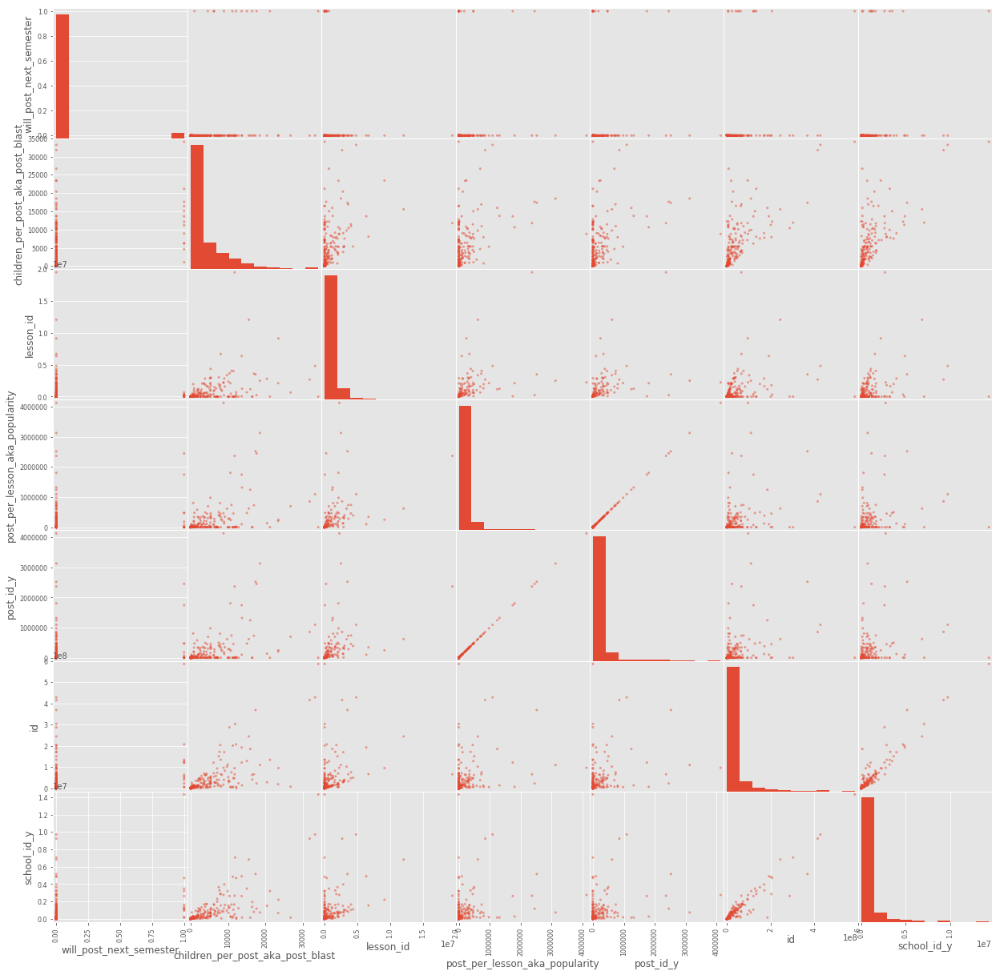

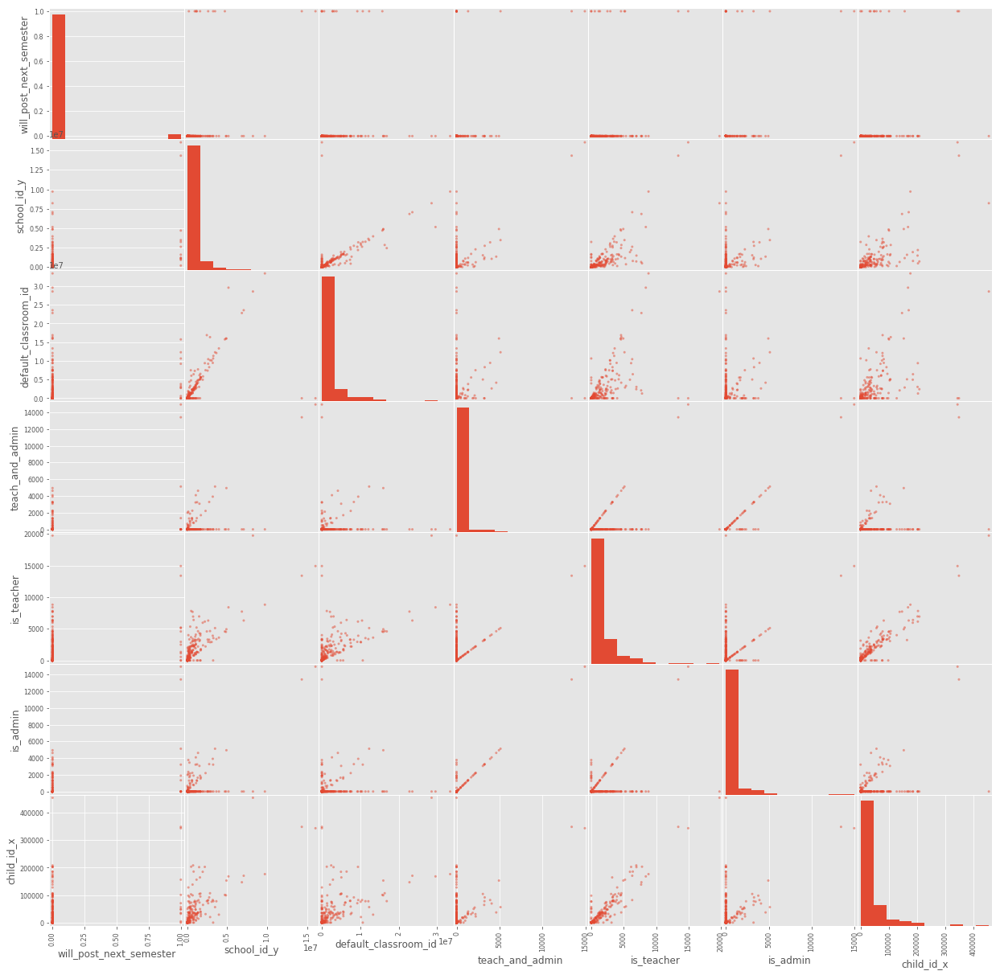

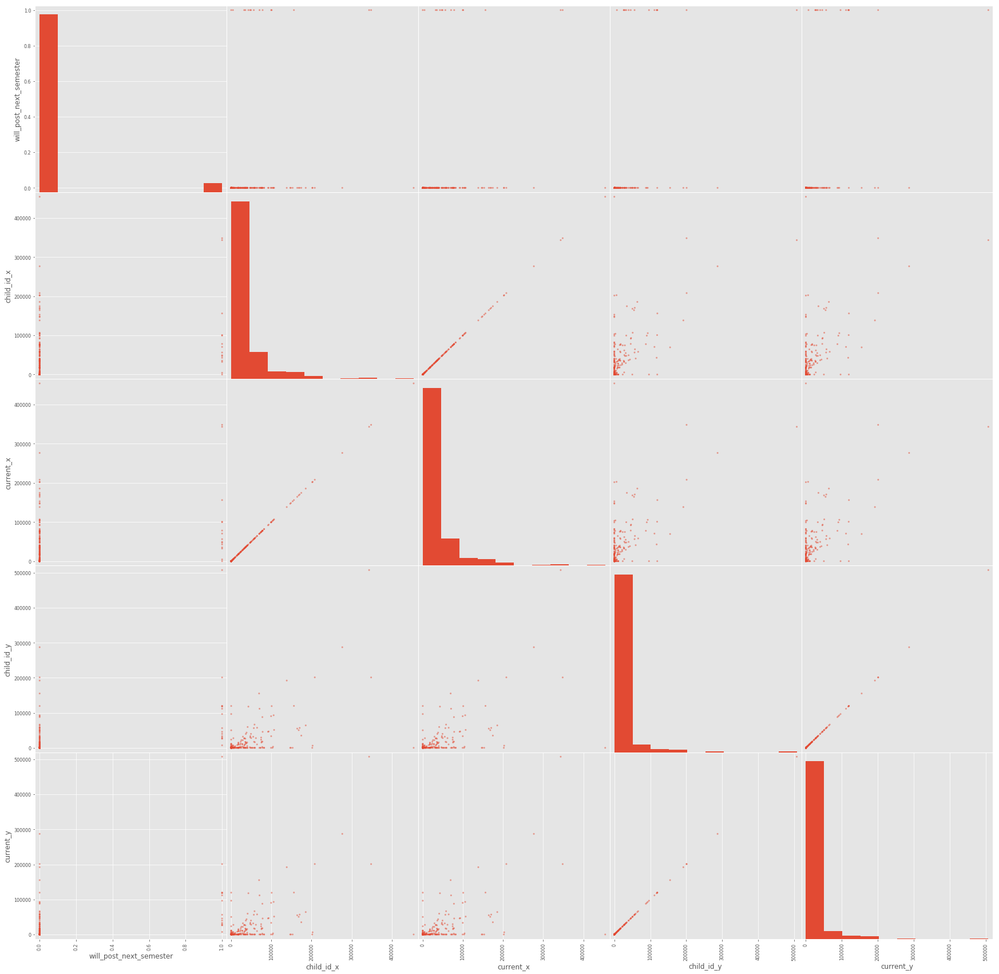

MAKE SCATTER TIME: 14.877360105514526

DF COLUMNS: 
['unnamed:_0', 'school_id_x', 'lesson_set_id', 'post_id_x', 'exists', 'children_per_post_aka_post_blast', 'lesson_id', 'post_per_lesson_aka_popularity', 'post_id_y', 'id', 'school_id_y', 'default_classroom_id', 'teach_and_admin', 'is_teacher', 'is_admin', 'child_id_x', 'current_x', 'child_id_y', 'current_y', 'will_post_next_semester']



  0%|          | 0/8 [00:00<?, ?it/s]

DF COLUMNS AFTER TRANSFORM: 
['unnamed:_0_spline_linear', 'unnamed:_0_spline_0', 'unnamed:_0_spline_1', 'unnamed:_0_spline_2', 'school_id_x_spline_linear', 'school_id_x_spline_0', 'school_id_x_spline_1', 'school_id_x_spline_2', 'lesson_set_id_spline_linear', 'lesson_set_id_spline_0', 'lesson_set_id_spline_1', 'lesson_set_id_spline_2', 'post_id_x_spline_linear', 'post_id_x_spline_0', 'post_id_x_spline_1', 'post_id_x_spline_2', 'exists_spline_linear', 'exists_spline_0', 'exists_spline_1', 'exists_spline_2', 'children_per_post_aka_post_blast_spline_linear', 'children_per_post_aka_post_blast_spline_0', 'children_per_post_aka_post_blast_spline_1', 'children_per_post_aka_post_blast_spline_2', 'lesson_id_spline_linear', 'lesson_id_spline_0', 'lesson_id_spline_1', 'lesson_id_spline_2', 'post_per_lesson_aka_popularity_spline_linear', 'post_per_lesson_aka_popularity_spline_0', 'post_per_lesson_aka_popularity_spline_1', 'post_per_lesson_aka_popularity_spline_2', 'post_id_y_spline_linear', 'post_i

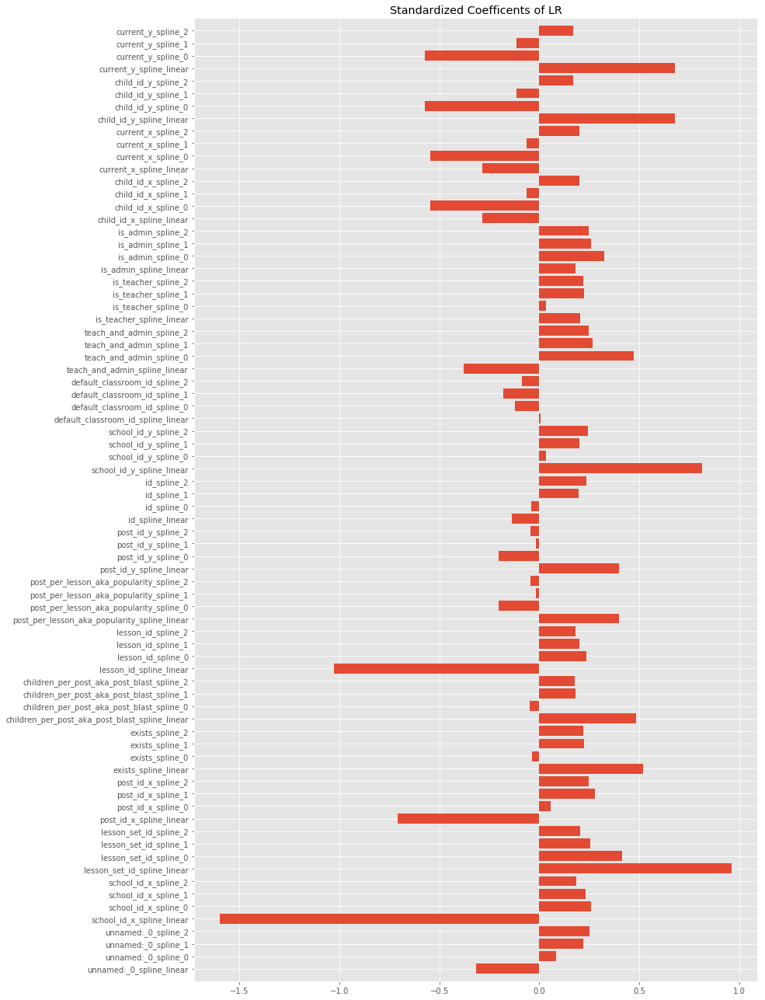

PLOT COEFFICIANTS TIME: 1.7960789203643799


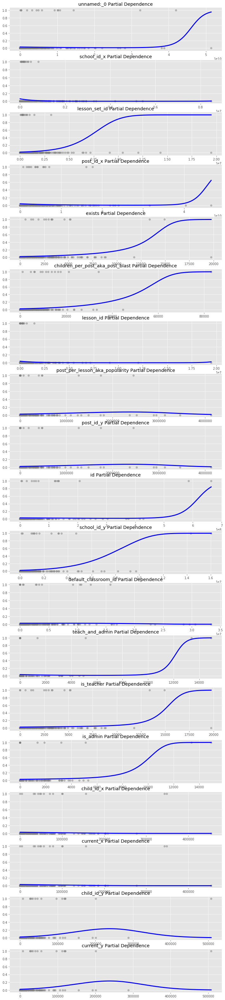

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 12%|█▎        | 1/8 [00:42<04:54, 42.14s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 40.125823974609375
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.012847900390625
LR: MSE = 0.03296703296703297
LDA: mean=0.931532 std=0.027561
CV CALC TIME: 0.08029961585998535
PLOT PREDICTED VS ACTUALS TIME: 1.1920928955078125e-06


/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are

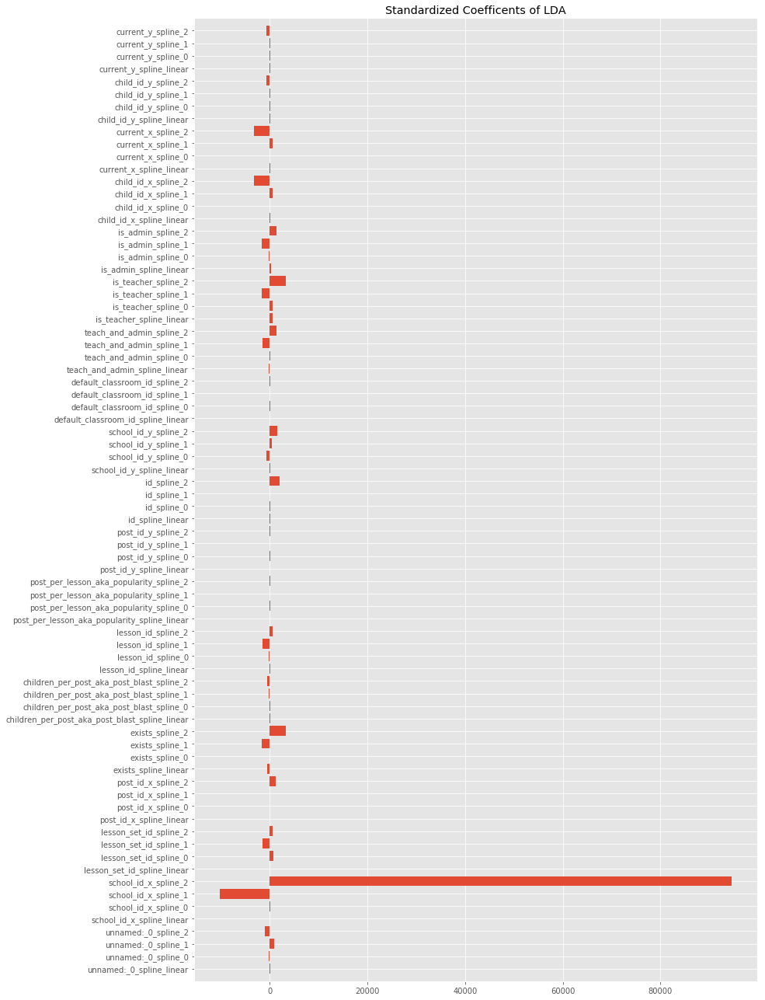

PLOT COEFFICIANTS TIME: 1.8689978122711182


/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:510: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)


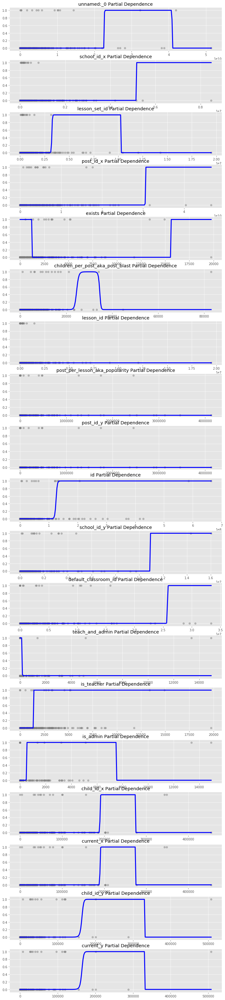

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 25%|██▌       | 2/8 [01:20<04:02, 40.34s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 36.49908804893494
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.009962797164916992
LDA: MSE = 0.038461538461538464
LC: mean=0.964414 std=0.021134
CV CALC TIME: 0.08998298645019531
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


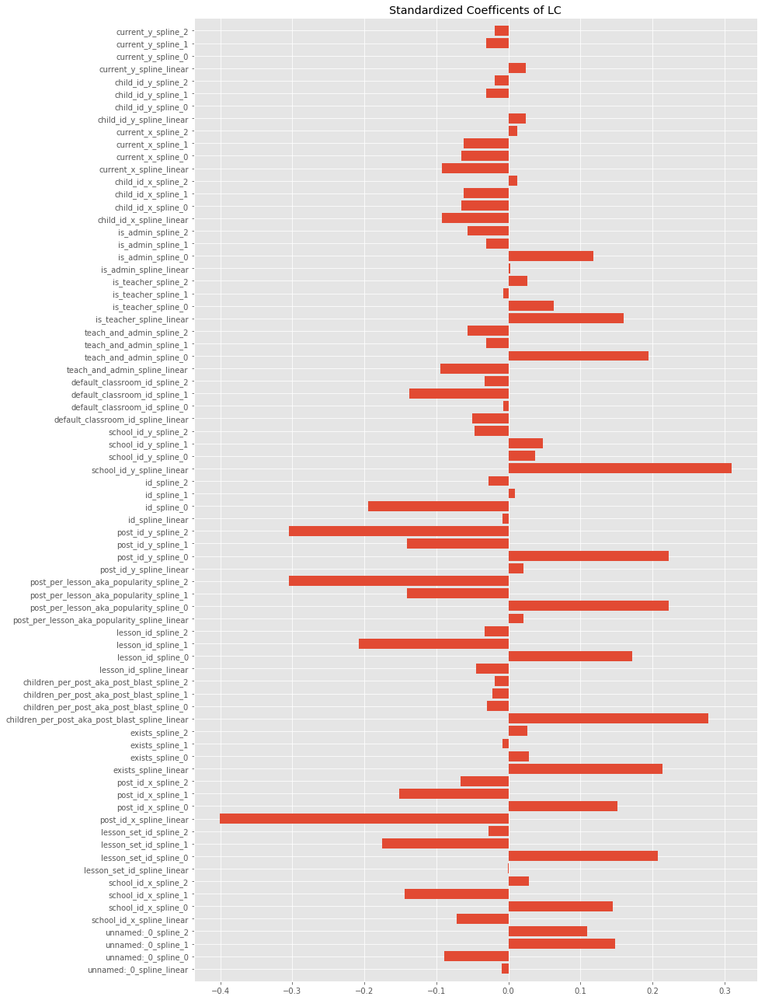

PLOT COEFFICIANTS TIME: 2.018112897872925


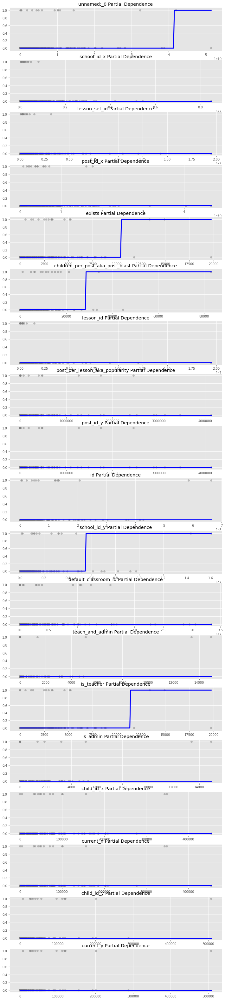

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 38%|███▊      | 3/8 [02:00<03:21, 40.29s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 37.963072061538696
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.013178825378417969
LC: MSE = 0.02197802197802198
KNN: mean=0.958934 std=0.021844
CV CALC TIME: 0.06687116622924805
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


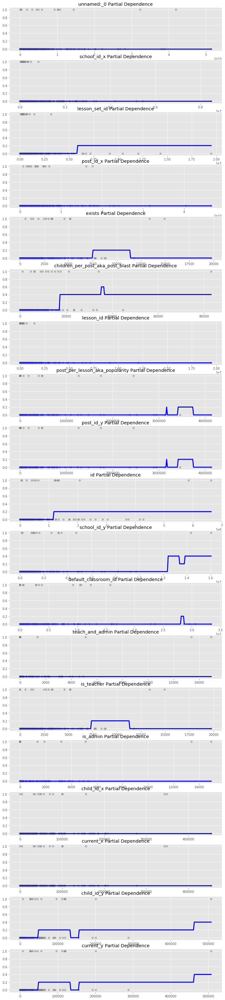

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 50%|█████     | 4/8 [02:44<02:44, 41.07s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 43.26213812828064
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.009231090545654297
KNN: MSE = 0.03571428571428571
DT: mean=0.964339 std=0.021299
CV CALC TIME: 0.08232402801513672
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


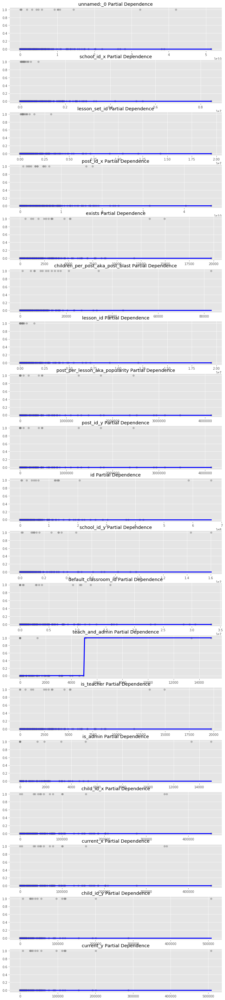

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 62%|██████▎   | 5/8 [03:22<02:01, 40.49s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 37.98375606536865
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.00941324234008789
DT: MSE = 0.01098901098901099
RF: mean=0.969895 std=0.022591
CV CALC TIME: 0.19565391540527344
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


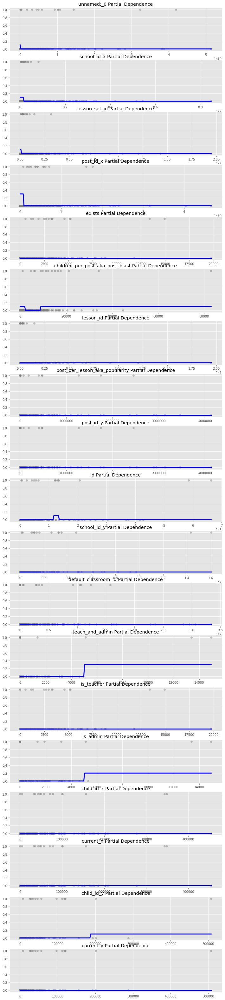

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 75%|███████▌  | 6/8 [04:06<01:22, 41.02s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 42.95860409736633
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.012692928314208984
RF: MSE = 0.013736263736263736
GB: mean=0.969820 std=0.014475
CV CALC TIME: 2.772611141204834
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


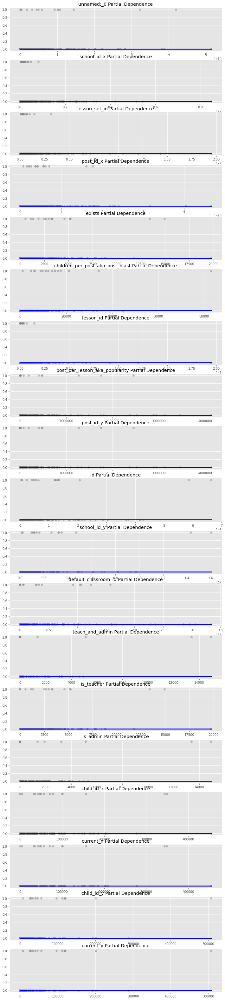

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
 88%|████████▊ | 7/8 [04:52<00:41, 41.76s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 41.03452920913696
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.014501094818115234
GB: MSE = 0.016483516483516484
DT: mean=0.967117 std=0.023981
CV CALC TIME: 1.555420160293579
PLOT PREDICTED VS ACTUALS TIME: 9.5367431640625e-07


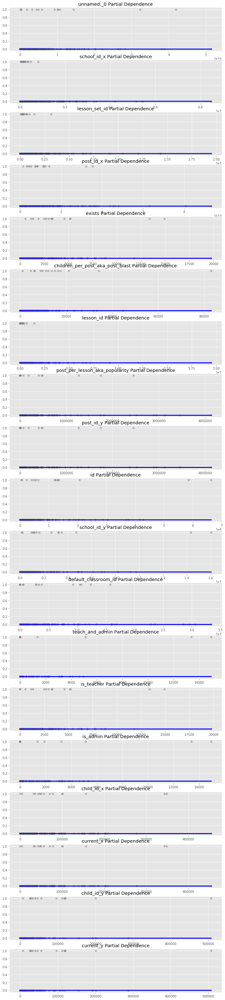

/Users/macbookpro/anaconda3/lib/python3.6/site-packages/pandas/core/computation/expressions.py:179: UserWarning: evaluating in Python space because the '-' operator is not supported by numexpr for the bool dtype, use '^' instead
  .format(op=op_str, alt_op=unsupported[op_str]))
100%|██████████| 8/8 [05:37<00:00, 42.15s/it]

PLOT CONTINOUS PARTIAL DEPENDENCIES TIME: 41.52923393249512
PLOT CATEGORICAL PARTIAL DEPENDENCIES TIME: 0.016778945922851562
DT: MSE = 0.016483516483516484


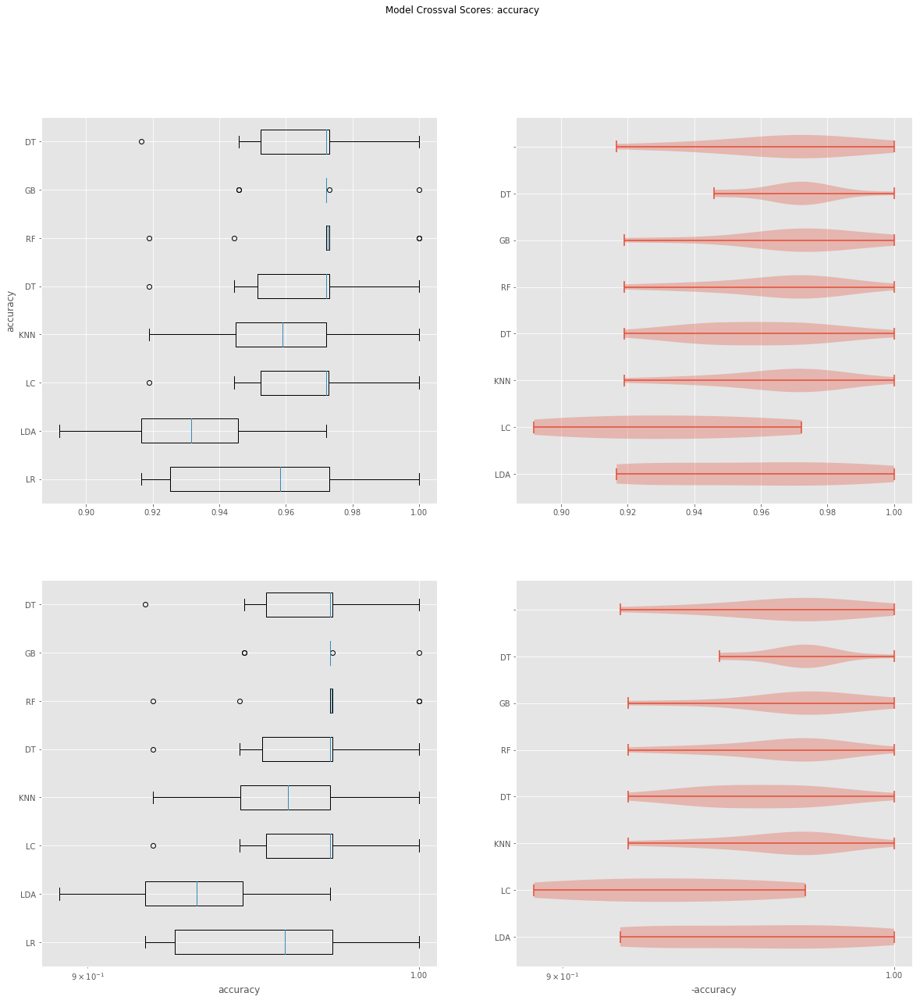

PLOT BAR AND VIOLIN TIME: 2.8312761783599854


/Users/macbookpro/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:510: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)


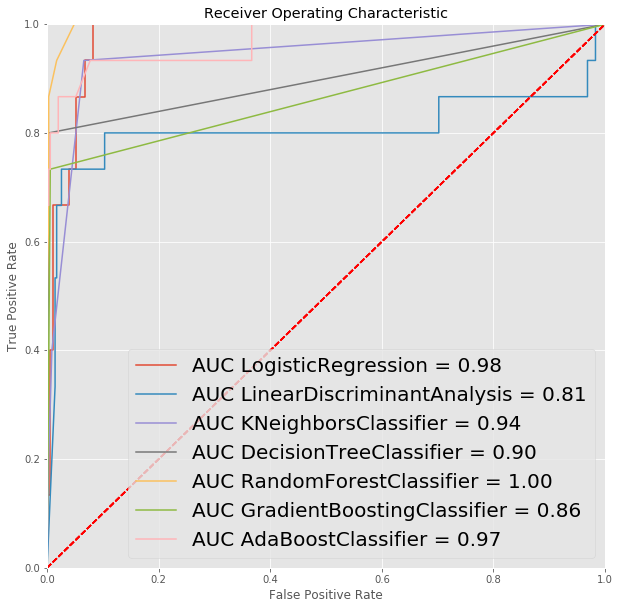

PLOT ROC TIME: 0.9520308971405029


In [35]:
import autoregression
names, results, models, pipeline = autoregression.compare_predictions(classrooms_sum, 'will_post_next_semester')

In [ ]:
# then scan this function forward in time
# function that aggregates the data 6 months in the future (zero use to start)
# a function that keeps track of aggregated child/teacher/image/post stats over each month ago
# LATER function that has a coeff for alllll the history timeseries data, 

In [ ]:
class_month_posts = posts.pivot_table(index='year_month',
                     columns='classroom_id', 
                     values='exists',
                     fill_value=0, 
                     aggfunc='count').unstack()

In [6]:
y = class_month_posts.head(100)

classroom_id  year_month
1             1908-10-01      0
              1917-01-01      0
              1917-03-01      0
              2002-01-01      0
              2007-10-01      0
              2010-11-01      0
              2011-09-01      0
              2011-12-01     16
              2012-01-01    167
              2012-02-01    262
              2012-03-01    292
              2012-04-01    173
              2012-05-01    199
              2012-06-01     77
              2012-07-01    200
              2012-08-01    114
              2012-09-01    330
              2012-10-01    237
              2012-11-01    215
              2012-12-01    168
              2013-01-01    224
              2013-02-01    238
              2013-03-01    164
              2013-04-01    367
              2013-05-01    415
              2013-06-01    260
              2013-07-01     63
              2013-08-01    118
              2013-09-01    423
              2013-10-01    360
               

In [37]:
classrooms_sum_drop_leak = classrooms_sum[[]]

,Unnamed: 0,school_id_x,lesson_set_id,post_id_x,exists,children_per_post_aka_post_blast,lesson_id,post_per_lesson_aka_popularity,post_id_y,id,school_id_y,default_classroom_id,teach_and_admin,is_teacher,is_admin,child_id_x,current_x,child_id_y,current_y,will_post_next_semester
classroom_id,,,,,,,,,,,,,,,,,,,,
1,5516605440,40960,81920,1.561344e+10,20480.0,49127.0,81920.0,18411520.0,18411520.0,9113600,286720,0.0,0.0,0.0,20480.0,552960.0,552960.0,942080.0,942080.0,True
3,16010970,339,79552,3.052845e+08,113.0,509.0,0.0,0.0,0.0,540705,7910,22035.0,0.0,113.0,0.0,2147.0,2147.0,4294.0,4294.0,False
4,6358506127,5574,390180,4.002759e+09,1858.0,12241.0,0.0,0.0,0.0,124486,5574,7432.0,0.0,0.0,1858.0,40876.0,40876.0,59456.0,59456.0,False
15,5806676421,20566,44070,1.564814e+09,2938.0,13642.0,44070.0,1745172.0,1745172.0,121301206,2617758,9222382.0,0.0,2938.0,0.0,70512.0,70512.0,111644.0,111644.0,True
16,1909780247,59824,119648,7.093019e+09,7478.0,28754.0,119648.0,4449410.0,4449410.0,3013634,52346,112170.0,7478.0,7478.0,7478.0,239296.0,239296.0,508504.0,508504.0,True
17,1930651,10,17,0.000000e+00,0.0,0.0,17.0,872.0,872.0,404,7,15.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,False
18,1513451401,99638,163044,8.842450e+09,9058.0,29559.0,163044.0,5570670.0,5570670.0,3677548,90580,153986.0,9058.0,9058.0,9058.0,144928.0,144928.0,824278.0,824278.0,True
19,2430192604,15456,24472,4.319312e+09,1288.0,2746.0,24472.0,828184.0,828184.0,529368,10304,32200.0,0.0,1288.0,0.0,33488.0,33488.0,3864.0,3864.0,False
20,1971346,12,19,0.000000e+00,0.0,0.0,19.0,643.0,643.0,413,10,0.0,0.0,0.0,1.0,7.0,7.0,0.0,0.0,False
